In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 3
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 51
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 262, 8517,  286]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:01<00:00,  8.58it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        #        "naive random direction": "tab:purple",
        r_other_key: "tab:orange",
        #        "inverse random activation direction": "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

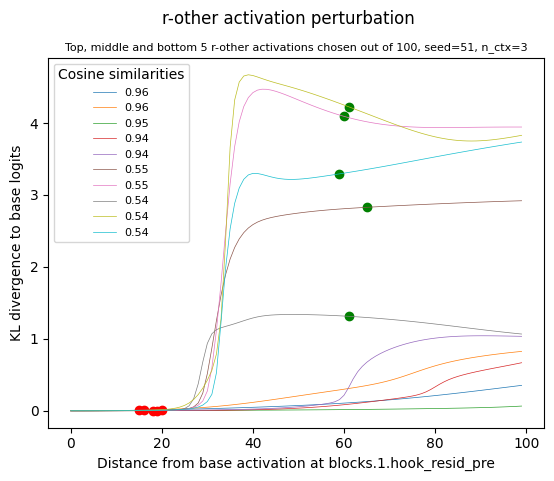

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 3
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 51
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 262, 8517,  286]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.88 GB


100%|██████████| 10/10 [00:06<00:00,  1.52it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        #        "naive random direction": "tab:purple",
        r_other_key: "tab:orange",
        #        "inverse random activation direction": "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

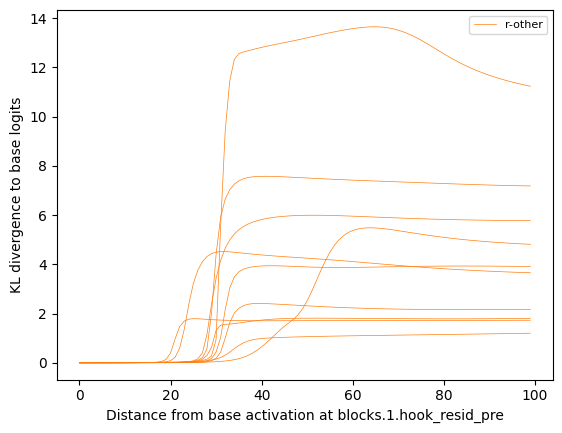

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 50
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 51
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  262,  8517,   286,   471,    37, 32298,    17,   468,  1234,   257,
         24458,   286,   262,   983,   319,   383, 17418,  4696,    13,   198,
           198, 22248,   547,  2045,  2495,   922,   329,   471,    37, 32298,
            17,   287,  2321,    13,   317,  4388, 14437,  1923, 12908,   510,
           287,  3945,   286,   326,   614,   290,   287,  2932,    11,   340]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.50 GB


100%|██████████| 10/10 [00:25<00:00,  2.52s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        #        "naive random direction": "tab:purple",
        r_other_key: "tab:orange",
        #        "inverse random activation direction": "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

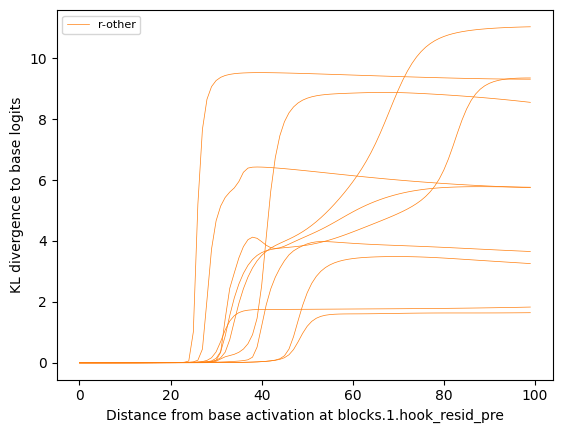

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 51
dataloader_batch_size = 15
perturbation_pos = slice(0, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  262,  8517,   286,   471,    37, 32298,    17,   468,  1234,   257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:06<00:00,  1.51it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        #        "naive random direction": "tab:purple",
        r_other_key: "tab:orange",
        #        "inverse random activation direction": "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

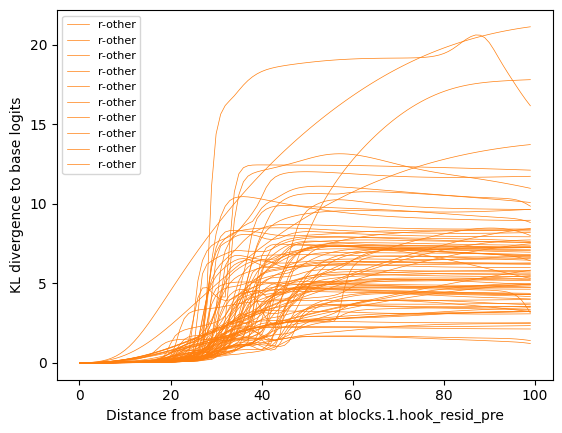

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(0, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:07<00:00,  1.34it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        #        "naive random direction": "tab:purple",
        r_other_key: "tab:orange",
        #        "inverse random activation direction": "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

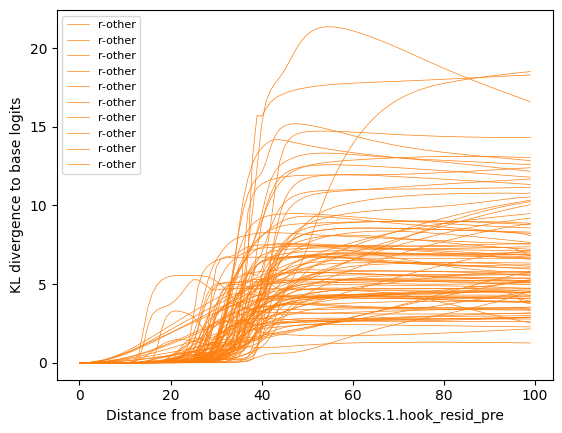

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(0, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:00<00:00, 57.74it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        #        "naive random direction": "tab:purple",
        r_other_key: "tab:orange",
        #        "inverse random activation direction": "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(0, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:00<00:00, 53.23it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        #        "naive random direction": "tab:purple",
        r_other_key: "tab:orange",
        #        "inverse random activation direction": "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

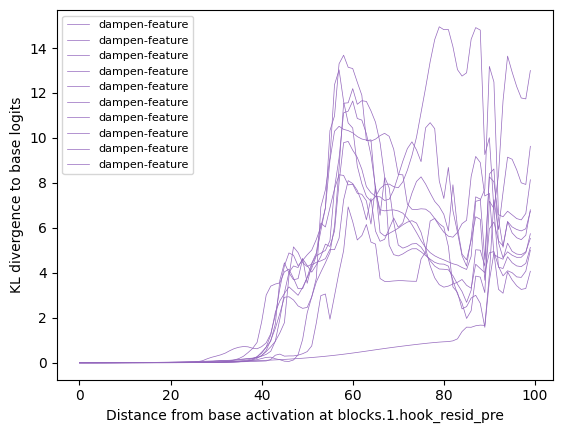

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
dampen_targets

[Parameter containing:
 tensor([ 2.4498e-01, -6.4232e-02, -1.9662e-01,  1.8618e-01, -3.8614e-03,
         -8.1591e-02,  1.1732e-01,  4.2087e-01,  1.1142e-01,  7.6832e-03,
          2.2520e-01, -7.2474e-02,  3.0415e-02, -1.4289e-02,  1.0463e-01,
          1.1571e-01,  8.4947e-01, -1.6372e-01,  1.7246e-01, -6.2242e-01,
         -2.9057e-01, -1.6181e-01, -1.4450e-01,  7.8514e-02, -2.9298e-02,
          2.2686e-02, -7.1229e-02, -9.5085e-02,  4.6262e-02,  1.9331e-02,
         -2.3191e-01, -5.1371e-02, -8.0584e-02,  2.1479e-01, -2.0802e-01,
          2.4888e-01,  4.0019e-02,  3.8544e-01,  3.0531e-01,  4.0086e-02,
          3.1388e-02, -8.0972e-02, -1.7746e-02, -3.1542e-02, -2.6515e-01,
         -3.9421e-01, -5.1630e-02, -1.1327e-01, -3.8745e-01,  3.5708e-01,
         -1.1061e-01,  1.6130e-01, -3.4032e-01,  3.4465e-01,  3.7562e-02,
          4.4120e-01,  4.2337e-02, -2.6039e-01, -6.7830e-02, -4.5138e-01,
          1.1923e-01,  1.0930e-01, -1.8830e-01, -1.1201e-01, -2.3755e+01,
         -4.061

In [ ]:
len(dampen_targets)

1

In [ ]:
len(results)

1

In [ ]:
results.keys()

dict_keys(['dampen-feature'])

In [ ]:
results[0]

[]

In [ ]:
results[dampen_feature_key]

[tensor([[-2.6393e-07,  9.7646e-09, -2.6087e-07, -1.9922e-07,  2.0238e-08,
           1.0022e-07, -1.9827e-07,  5.2523e-08,  3.8321e-08,  1.1866e-07],
         [ 4.4426e-05,  3.4553e-06,  6.5025e-06,  8.8835e-06,  7.9017e-06,
           1.7750e-05,  5.2664e-05,  6.8837e-05,  2.5661e-05,  3.6990e-05],
         [ 1.7758e-04,  1.6203e-05,  2.4434e-05,  3.4860e-05,  3.0158e-05,
           7.2883e-05,  2.1158e-04,  2.7572e-04,  9.8946e-05,  1.5313e-04],
         [ 4.0873e-04,  3.8266e-05,  5.8213e-05,  7.6769e-05,  6.9552e-05,
           1.6463e-04,  4.8331e-04,  6.2154e-04,  2.2475e-04,  3.4823e-04],
         [ 7.2899e-04,  6.9482e-05,  1.0657e-04,  1.3409e-04,  1.2497e-04,
           2.9082e-04,  8.7168e-04,  1.1088e-03,  4.0296e-04,  6.2988e-04],
         [ 1.1483e-03,  1.0893e-04,  1.7841e-04,  2.0783e-04,  1.9802e-04,
           4.5338e-04,  1.3823e-03,  1.7352e-03,  6.3538e-04,  9.9761e-04],
         [ 1.6655e-03,  1.5799e-04,  2.7334e-04,  2.9465e-04,  2.9078e-04,
           6.5026e-

In [ ]:
len(results[dampen_feature_key])

1

In [ ]:
len(results[dampen_feature_key][0])

100

In [ ]:
len(results[dampen_feature_key][1])

IndexError: list index out of range

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

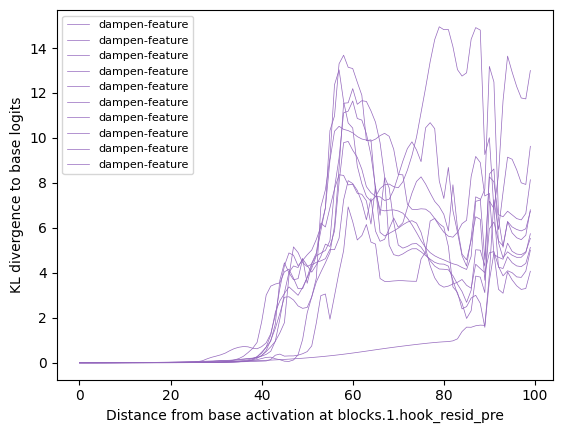

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

Restarted .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(0, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 10/10 [00:00<00:00, 19.65it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

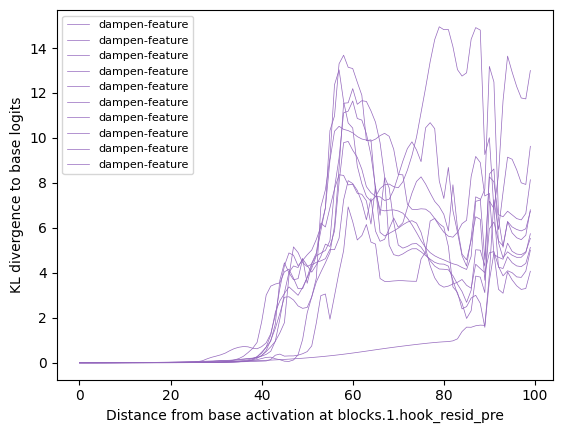

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(f"i is {i}")
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

i is 0


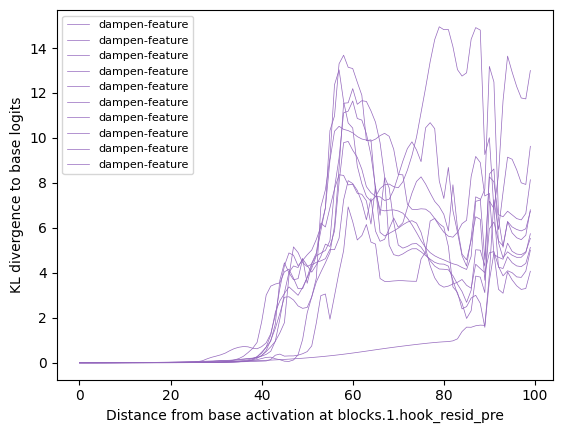

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
results[dampen_feature_key][0][0]

tensor([-2.6393e-07,  9.7646e-09, -2.6087e-07, -1.9922e-07,  2.0238e-08,
         1.0022e-07, -1.9827e-07,  5.2523e-08,  3.8321e-08,  1.1866e-07])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 22.84it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(f"i is {i}")
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

i is 0


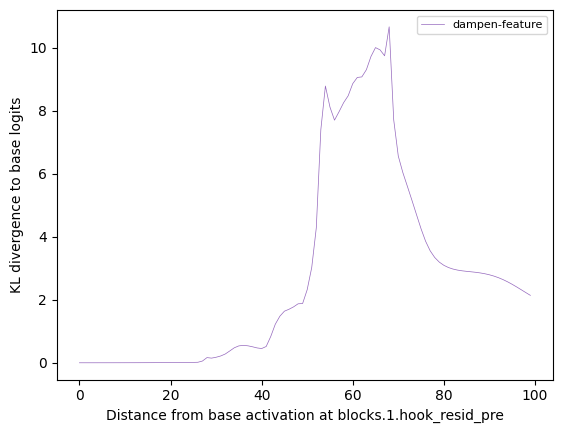

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


  0%|          | 0/10 [00:00<?, ?it/s]


ValueError: No more targets to perturb to

In [ ]:
dampen_targets

[tensor([ 4.0557e+00, -3.7051e+00, -2.3153e+00,  3.8815e+00,  1.1579e+00,
         -3.5861e-01,  7.9591e+00, -5.3096e+00, -2.8317e+00,  1.8980e+00,
          2.2168e+00,  3.3609e+00,  1.0582e+00, -3.0315e-01, -2.0105e+00,
         -3.7103e+00,  2.0958e+00, -8.7878e-01,  4.0111e+00, -5.8992e-02,
          3.5855e-01,  2.6399e+00,  1.8537e+00,  9.1945e-01, -1.5465e+00,
          1.7415e+00,  9.4804e-01,  1.0440e+00,  1.6146e+00, -2.7547e-03,
          6.6812e-01, -2.3680e+00, -1.3354e+00, -2.3602e+00, -8.0377e-01,
         -2.8695e+00, -1.0354e+01, -3.2735e-01,  4.6328e-01, -1.4120e+00,
         -4.9431e-01,  8.3795e-01,  1.0344e+00,  1.8514e-01, -2.9604e-01,
         -2.7247e+00, -7.7155e-01,  1.0805e+00, -4.3315e+00,  5.0051e+00,
          1.1270e+00,  1.0238e+00, -5.1993e+00,  2.9378e+00,  7.4560e-01,
          5.3570e+00, -5.9690e-01, -2.8281e+00, -1.6151e+00, -1.5848e+00,
         -2.0662e+00,  3.9608e-01,  3.6896e+00,  2.2816e-01, -2.6548e+01,
          9.7116e-01,  6.0149e-03,  5.

In [ ]:
len(dampen_targets)

1

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


  0%|          | 0/10 [00:00<?, ?it/s]


ValueError: No more targets to perturb to

Restarted .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 10/10 [00:00<00:00, 19.41it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(f"i is {i}")
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
    else:
        plt.suptitle("r-other activation perturbation")
    if ADDITIVE_PERTURBATION:
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

i is 0


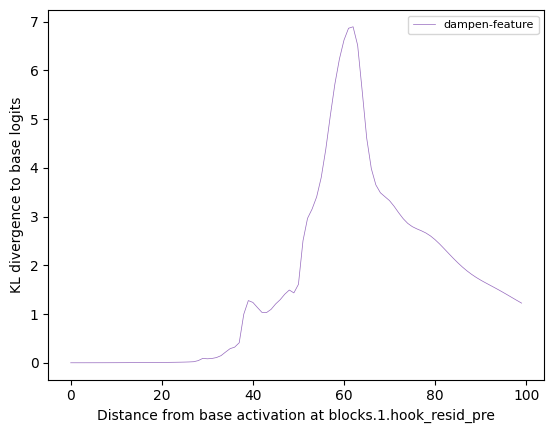

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

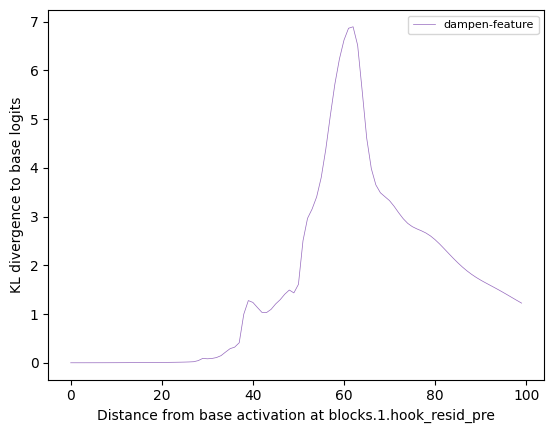

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

<ipython-input-27-c149503fb932>:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=8)


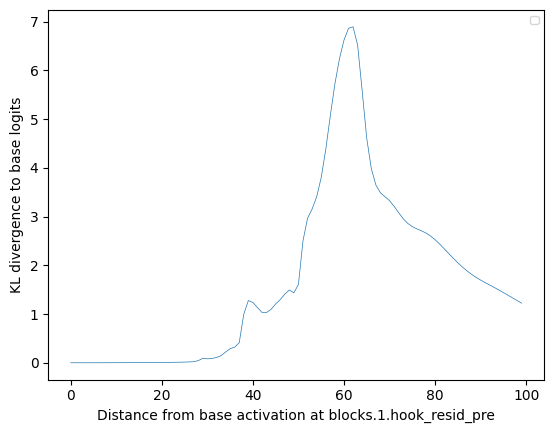

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
elif DAMPEN_FEATURE:
    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = False
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 18.88it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

<ipython-input-48-c149503fb932>:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize=8)


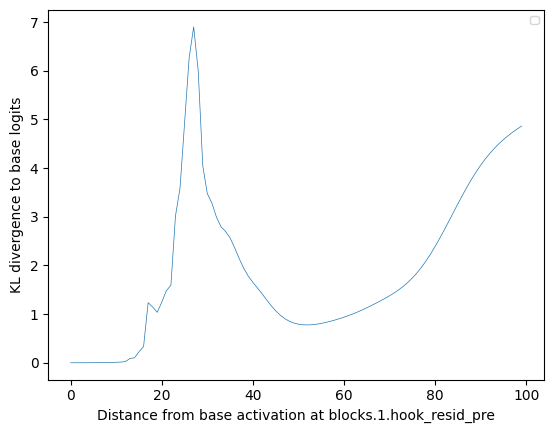

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
elif DAMPEN_FEATURE:
    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 20.57it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

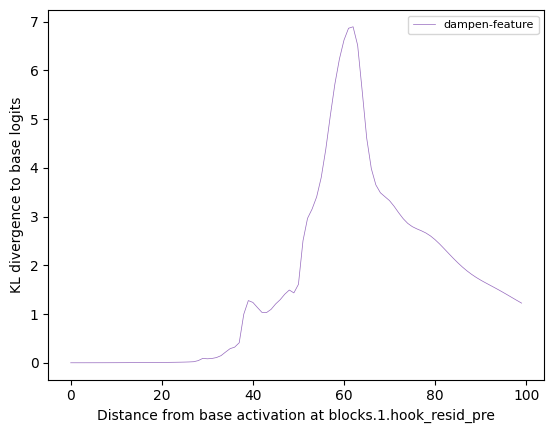

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = False
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 19.89it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

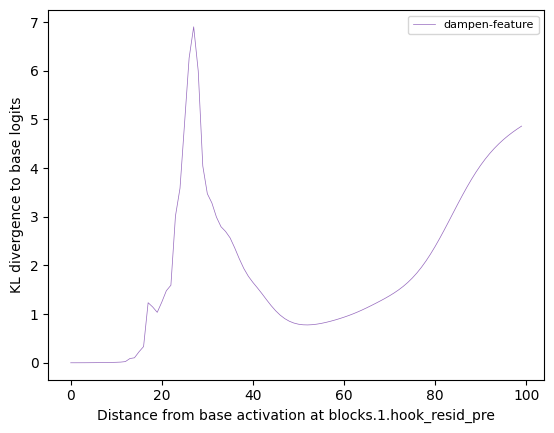

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = False
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 24.25it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

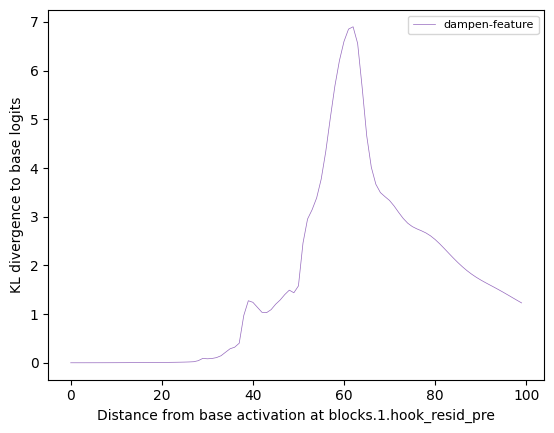

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 25.11it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

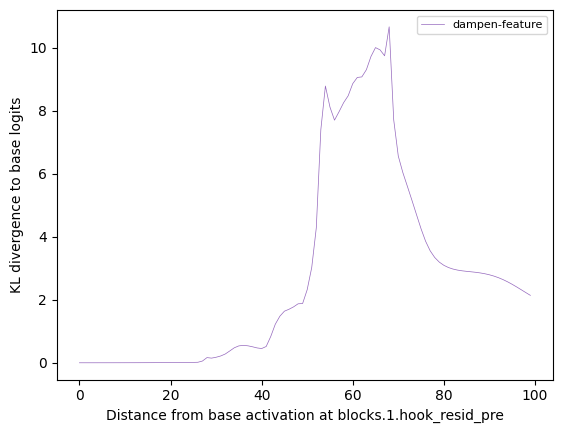

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                -100,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 25.69it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

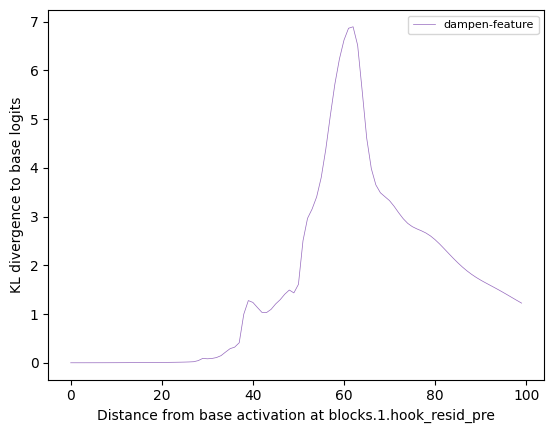

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
d_t = dampen_targets[0]

In [ ]:
torch.norm(d_t)

tensor(99.5249)

In [ ]:
torch.norm(d_t-A)

NameError: name 'A' is not defined

In [ ]:
torch.norm(d_t-base_ref.act)

tensor(127.4578)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
            sorted_indices = torch.argsort(strs[0], descending=True)

            (
                acts[0][ids[0][sorted_indices[0].item()]],
                # acts[0][ids[0][sorted_indices[1].item()]],
            ) = (
                0,
                # strs[0][sorted_indices[0].item()].clone(),
            )
            # print(acts[0][ids[0][sorted_indices[0].item()]])
            # print(acts[0][ids[0][sorted_indices[1].item()]])
            dampen_targets.append(sae.decode(acts[0]))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 19.68it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

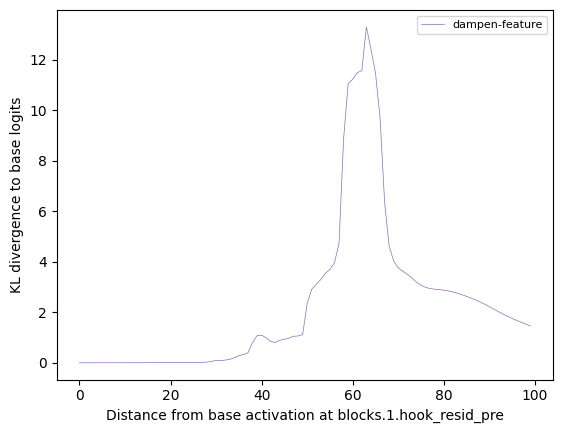

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
d_t = dampen_targets[0]

In [ ]:
torch.norm(d_t)

tensor(42.8277)

In [ ]:
torch.norm(d_t-A)

NameError: name 'A' is not defined

In [ ]:
torch.norm(d_t-base_ref.act)

tensor(27.9342)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = True
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_dec[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector *= -1
                dampen_targets.append(sae.b_dec + torch.tensor(projection_vector))

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 18.76it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

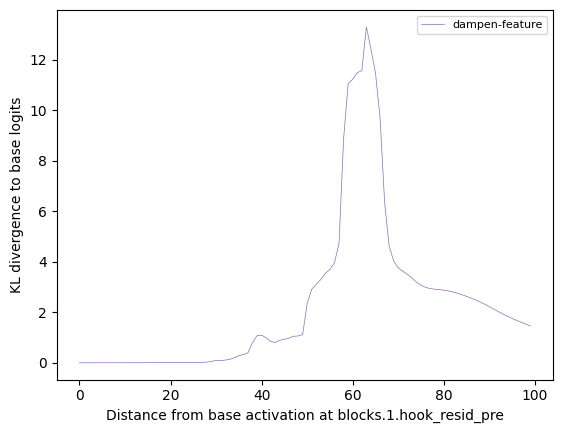

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_dec[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector *= -1
                dampen_targets.append(sae.b_dec + torch.tensor(projection_vector))

RuntimeError: The size of tensor a (768) must match the size of tensor b (0) at non-singleton dimension 0

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

: 

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
sae.W_dec.shape

torch.Size([24576, 768])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector *= -1
                dampen_targets.append(sae.b_dec + torch.tensor(projection_vector))

RuntimeError: The size of tensor a (768) must match the size of tensor b (0) at non-singleton dimension 0

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

: 

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
sae.W_enc.shape

torch.Size([768, 24576])

In [ ]:
sae.cfg.d_in

768

In [ ]:
projection_vector

[]

In [ ]:
sae.W_enc

Parameter containing:
tensor([[-0.0924, -0.1662, -0.0966,  ...,  0.0148, -0.1043, -0.0344],
        [ 0.0321,  0.2077, -0.0156,  ...,  0.0192,  0.1230, -0.0130],
        [ 0.0394,  0.2702,  0.1050,  ..., -0.0918, -0.0176, -0.0174],
        ...,
        [-0.1177,  0.0534, -0.1353,  ...,  0.0964, -0.1858,  0.0239],
        [-0.1032,  0.0332,  0.0316,  ..., -0.1231, -0.1434, -0.0391],
        [-0.1196, -0.1057, -0.0497,  ..., -0.0111, -0.2159, -0.0578]],
       requires_grad=True)

In [ ]:
projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]

In [ ]:
projection_vector

[-0.16615957021713257,
 0.20772874355316162,
 0.2701902985572815,
 0.05946539342403412,
 -0.07861273735761642,
 0.16491331160068512,
 0.1625394970178604,
 -0.09206117689609528,
 -0.17123322188854218,
 0.24854746460914612,
 0.1469944268465042,
 0.1424654722213745,
 0.20886366069316864,
 -0.17517562210559845,
 0.10439860075712204,
 0.0813460573554039,
 0.019996417686343193,
 -0.06995587050914764,
 0.1924886554479599,
 0.014690307900309563,
 -0.21312950551509857,
 0.10778973251581192,
 -0.059959251433610916,
 -0.14966745674610138,
 -0.054698213934898376,
 0.1246839165687561,
 -0.09565140306949615,
 0.021154383197426796,
 0.08724278956651688,
 0.013206355273723602,
 0.07571042329072952,
 -0.1258644014596939,
 -0.16521723568439484,
 0.09193107485771179,
 0.004323374014347792,
 0.03177390247583389,
 0.08178550750017166,
 0.18695083260536194,
 0.02560192346572876,
 0.14825794100761414,
 0.058242395520210266,
 -0.127681702375412,
 -0.057078901678323746,
 -0.047810643911361694,
 -0.004630065057

In [ ]:
projection_vector *= -1

In [ ]:
projection_vector

[]

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(sae.b_dec + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 19.54it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

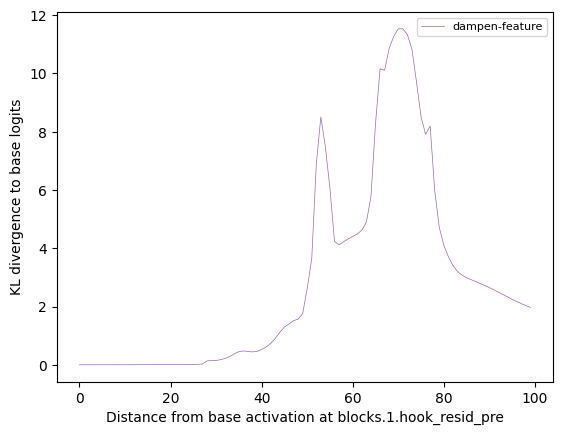

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = False
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(sae.b_dec + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 23.79it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

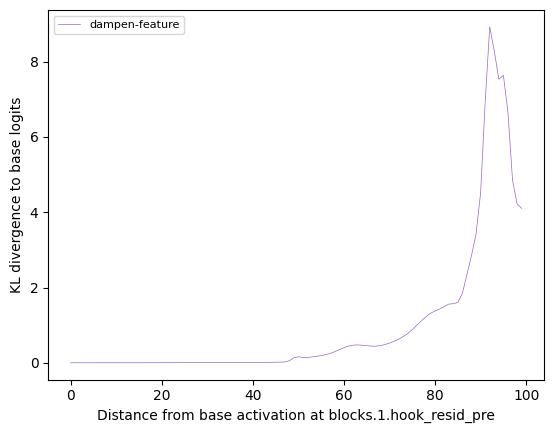

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# plotting here
heatmap = True
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

IndexError: list index out of range

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = False
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(sae.b_dec + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 12.92it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
# plotting here
heatmap = True
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

NameError: name 'target_list' is not defined

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

<ipython-input-337-310305e938b2>:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


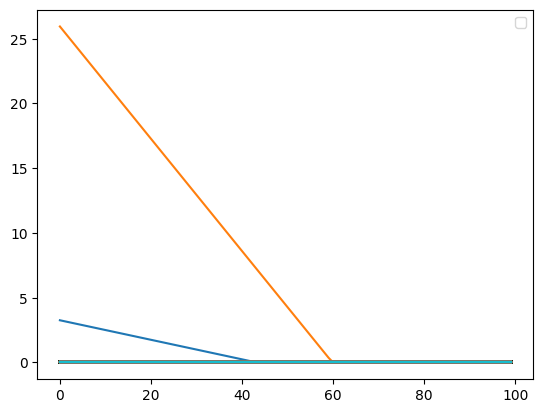

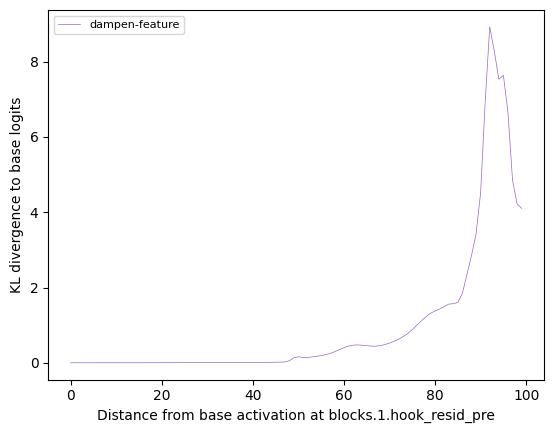

In [ ]:
# plotting here
heatmap = True
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
base_ids

{'random': [],
 'r-other': [],
 'predefined-other': [],
 'activate-sae-feature': [],
 'dampen-feature': [[tensor([17359, 19958])]]}

In [ ]:
base_strs

{'random': [],
 'r-other': [],
 'predefined-other': [],
 'activate-sae-feature': [],
 'dampen-feature': [[tensor([ 3.2598, 25.9447])]]}

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = False
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 11.27it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
# plotting here
heatmap = True
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

TypeError: unhashable type: 'list'

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

<ipython-input-361-310305e938b2>:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


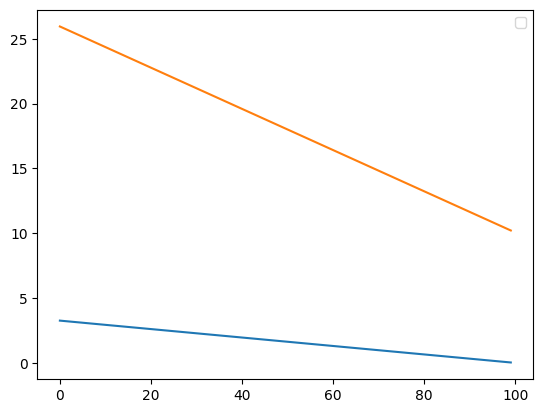

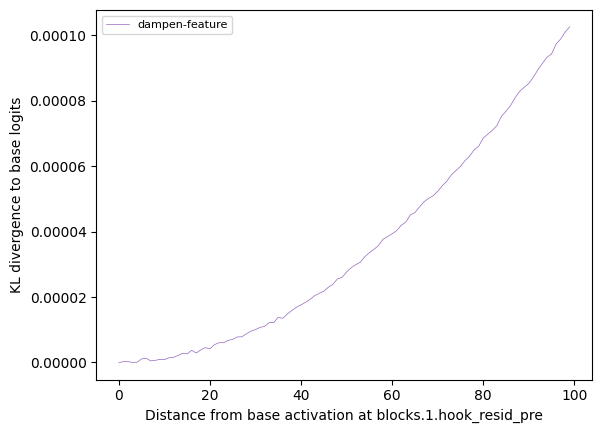

In [ ]:
# plotting here
heatmap = True
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []# dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
torch.norm(projection_vector)

tensor(3.2980)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = False
        if just_dampen:
            dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 12.77it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

<ipython-input-384-310305e938b2>:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


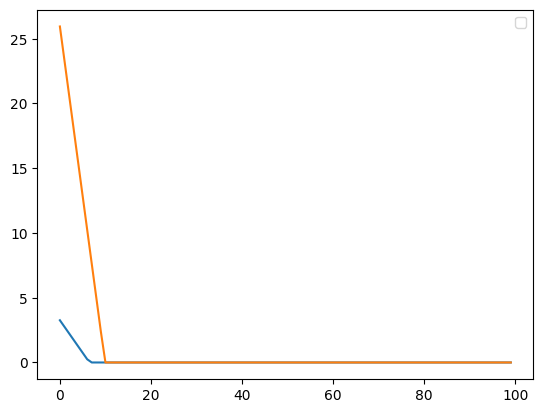

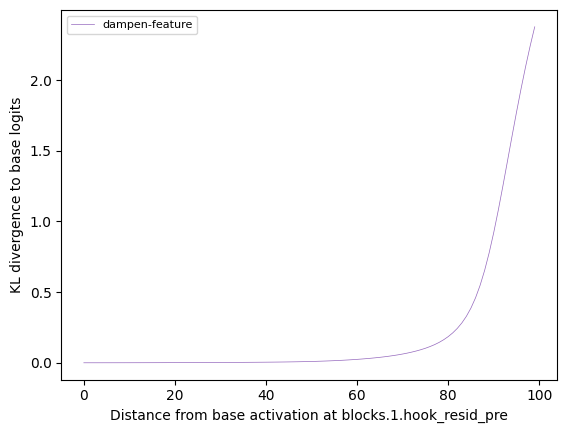

In [ ]:
# plotting here
heatmap = True
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = True

SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            #dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:00<00:00, 12.34it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

<ipython-input-409-310305e938b2>:12: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


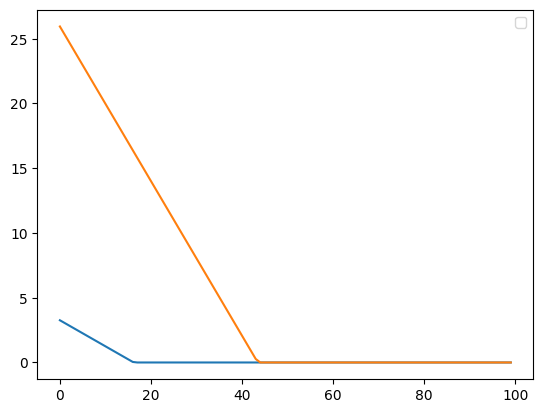

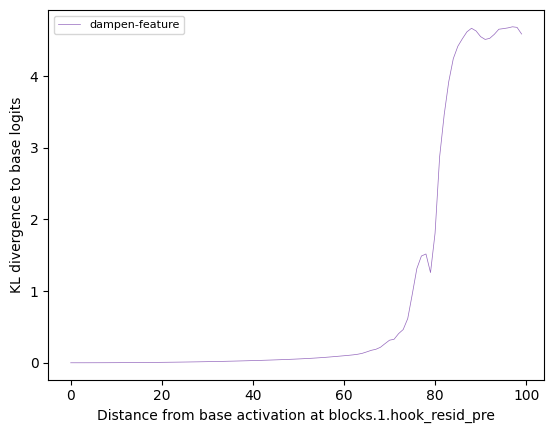

In [ ]:
# plotting here
heatmap = True
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False

SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.65 GB


100%|██████████| 10/10 [00:10<00:00,  1.06s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
# plotting here
heatmap = True
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

IndexError: list index out of range

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

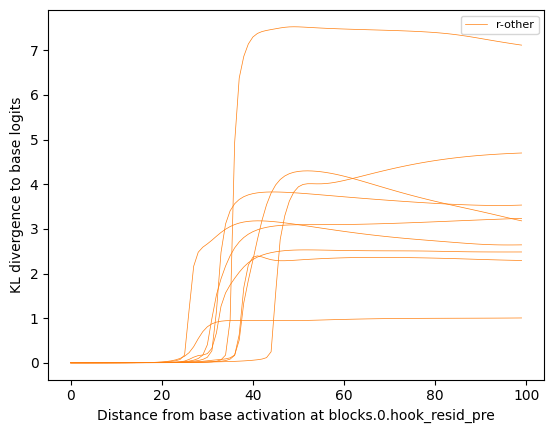

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.29 GB


100%|██████████| 10/10 [00:10<00:00,  1.07s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

KeyError: 'last-token'

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

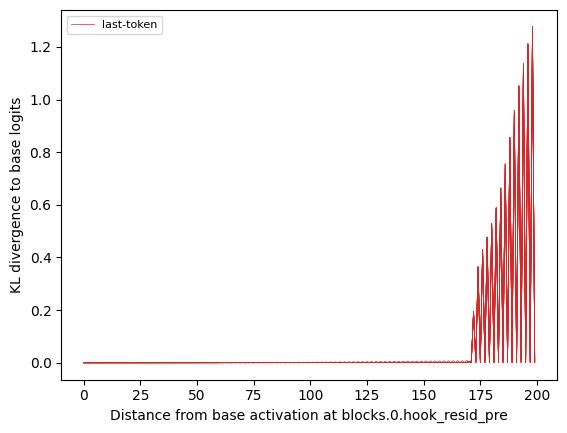

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.91 GB


100%|██████████| 10/10 [00:09<00:00,  1.02it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

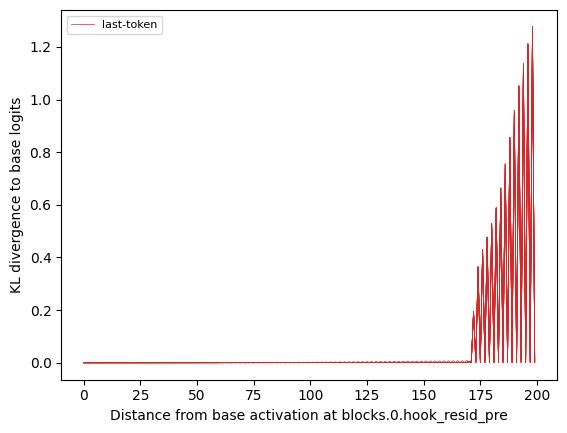

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.91 GB


100%|██████████| 10/10 [00:10<00:00,  1.02s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

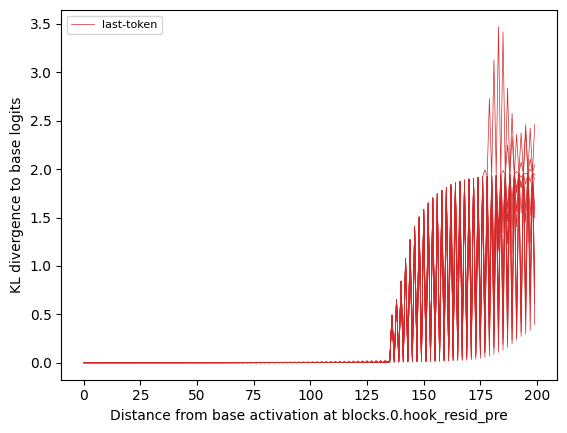

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
results[last_token_key]

[tensor([-1.4189e-07, -1.4189e-07,  8.4248e-08,  9.6266e-07,  2.3274e-06,
          5.8459e-06,  4.3174e-06,  1.1374e-05,  7.4802e-06,  2.0333e-05,
          1.1393e-05,  3.0802e-05,  1.6849e-05,  4.2670e-05,  2.2017e-05,
          5.6909e-05,  2.7667e-05,  7.2860e-05,  3.4129e-05,  9.0025e-05,
          4.0315e-05,  1.0826e-04,  4.6976e-05,  1.2881e-04,  5.5248e-05,
          1.4960e-04,  6.1655e-05,  1.7377e-04,  6.9494e-05,  1.9798e-04,
          7.7793e-05,  2.2435e-04,  8.6322e-05,  2.5125e-04,  9.4157e-05,
          2.7954e-04,  1.0378e-04,  3.0999e-04,  1.1319e-04,  3.4198e-04,
          1.2322e-04,  3.7555e-04,  1.3406e-04,  4.1199e-04,  1.4504e-04,
          4.4890e-04,  1.5642e-04,  4.8902e-04,  1.7021e-04,  5.3175e-04,
          1.8338e-04,  5.7693e-04,  1.9712e-04,  6.2450e-04,  2.1124e-04,
          6.7683e-04,  2.2696e-04,  7.3183e-04,  2.4331e-04,  7.9007e-04,
          2.6135e-04,  8.5256e-04,  2.7922e-04,  9.1920e-04,  2.9935e-04,
          9.9052e-04,  3.2088e-04,  1.

In [ ]:
len(results[last_token_key])

10

In [ ]:
len(results[last_token_key][0])

200

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 200
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)

    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.91 GB


100%|██████████| 10/10 [00:13<00:00,  1.39s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

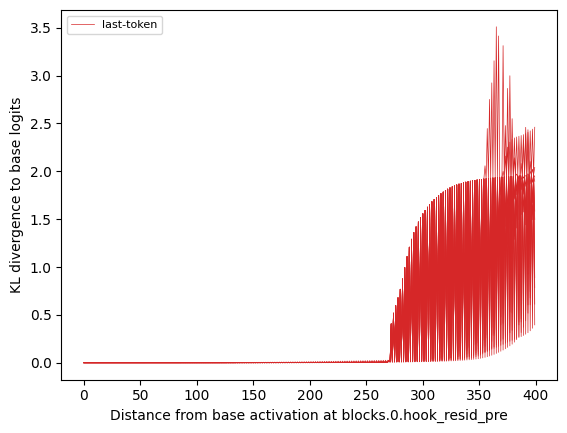

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    print(perturbed_activations.shape)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.91 GB


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([200, 1, 768])


 10%|█         | 1/10 [00:00<00:07,  1.27it/s]

torch.Size([200, 1, 768])


 20%|██        | 2/10 [00:01<00:06,  1.31it/s]

torch.Size([200, 1, 768])


 30%|███       | 3/10 [00:02<00:05,  1.33it/s]

torch.Size([200, 1, 768])


 40%|████      | 4/10 [00:03<00:04,  1.34it/s]

torch.Size([200, 1, 768])


 50%|█████     | 5/10 [00:03<00:03,  1.35it/s]

torch.Size([200, 1, 768])


 60%|██████    | 6/10 [00:04<00:02,  1.35it/s]

torch.Size([200, 1, 768])


 70%|███████   | 7/10 [00:05<00:02,  1.36it/s]

torch.Size([200, 1, 768])


 80%|████████  | 8/10 [00:06<00:01,  1.31it/s]

torch.Size([200, 1, 768])


 90%|█████████ | 9/10 [00:06<00:00,  1.27it/s]

torch.Size([200, 1, 768])


100%|██████████| 10/10 [00:07<00:00,  1.30it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

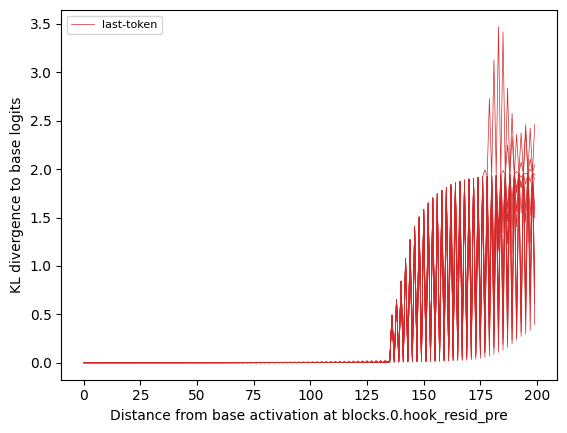

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

Restarted .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    print(perturbed_activations.shape)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.63 GB


  0%|          | 0/10 [00:00<?, ?it/s]

torch.Size([200, 1, 768])


 10%|█         | 1/10 [00:01<00:12,  1.41s/it]

torch.Size([200, 1, 768])


 20%|██        | 2/10 [00:02<00:10,  1.30s/it]

torch.Size([200, 1, 768])


 30%|███       | 3/10 [00:03<00:08,  1.15s/it]

torch.Size([200, 1, 768])


 40%|████      | 4/10 [00:04<00:06,  1.02s/it]

torch.Size([200, 1, 768])


 50%|█████     | 5/10 [00:05<00:04,  1.04it/s]

torch.Size([200, 1, 768])


 60%|██████    | 6/10 [00:06<00:03,  1.06it/s]

torch.Size([200, 1, 768])


 70%|███████   | 7/10 [00:07<00:02,  1.08it/s]

torch.Size([200, 1, 768])


 80%|████████  | 8/10 [00:07<00:01,  1.09it/s]

torch.Size([200, 1, 768])


 90%|█████████ | 9/10 [00:08<00:00,  1.10it/s]

torch.Size([200, 1, 768])


100%|██████████| 10/10 [00:09<00:00,  1.03it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

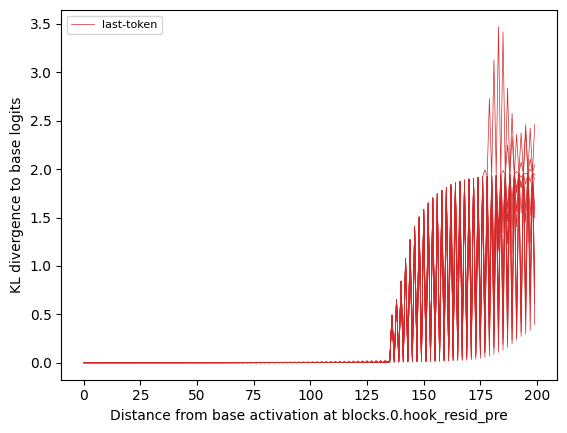

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    print(f"n_steps is {n_steps}")
    print(perturbed_activations.shape)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.25 GB


  0%|          | 0/10 [00:00<?, ?it/s]

n_steps is 100
torch.Size([200, 1, 768])


 10%|█         | 1/10 [00:01<00:12,  1.44s/it]

n_steps is 100
torch.Size([200, 1, 768])


 20%|██        | 2/10 [00:02<00:10,  1.26s/it]

n_steps is 100
torch.Size([200, 1, 768])


 30%|███       | 3/10 [00:03<00:07,  1.09s/it]

n_steps is 100
torch.Size([200, 1, 768])


 40%|████      | 4/10 [00:04<00:06,  1.01s/it]

n_steps is 100
torch.Size([200, 1, 768])


 50%|█████     | 5/10 [00:05<00:05,  1.04s/it]

n_steps is 100
torch.Size([200, 1, 768])


 60%|██████    | 6/10 [00:06<00:03,  1.00it/s]

n_steps is 100
torch.Size([200, 1, 768])


 70%|███████   | 7/10 [00:07<00:02,  1.04it/s]

n_steps is 100
torch.Size([200, 1, 768])


 80%|████████  | 8/10 [00:08<00:01,  1.07it/s]

n_steps is 100
torch.Size([200, 1, 768])


 90%|█████████ | 9/10 [00:09<00:00,  1.09it/s]

n_steps is 100
torch.Size([200, 1, 768])


100%|██████████| 10/10 [00:09<00:00,  1.01it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

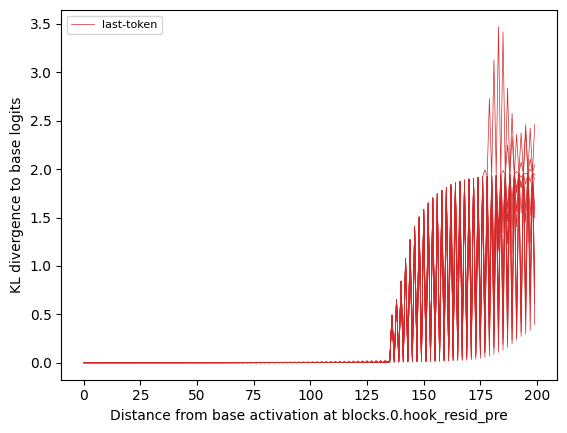

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))

IndentationError: unexpected indent (<ipython-input-51-3a34c41e30d2>, line 2)

In [ ]:
rand_token = generate_prompt(dataset, n_ctx=1)
last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:], rand_token))

In [ ]:
last_token_prompt

tensor([[257],
        [770]])

In [ ]:
base_ref.prompt.clone()[:, -1:]

tensor([[257]])

In [ ]:
base_ref.prompt.clone()[:, -1:][0]

tensor([257])

In [ ]:
rand_token

tensor([[770]])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 21
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    print(f"n_steps is {n_steps}")
    print(perturbed_activations.shape)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  13,  843,  326,  340, 4210,   82,  587, 2900,  656,  257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.25 GB


  0%|          | 0/10 [00:00<?, ?it/s]

n_steps is 100
torch.Size([100, 1, 768])


 10%|█         | 1/10 [00:00<00:06,  1.44it/s]

n_steps is 100
torch.Size([100, 1, 768])


 20%|██        | 2/10 [00:01<00:05,  1.51it/s]

n_steps is 100
torch.Size([100, 1, 768])


 30%|███       | 3/10 [00:02<00:04,  1.45it/s]

n_steps is 100
torch.Size([100, 1, 768])


 40%|████      | 4/10 [00:02<00:04,  1.37it/s]

n_steps is 100
torch.Size([100, 1, 768])


 50%|█████     | 5/10 [00:03<00:03,  1.43it/s]

n_steps is 100
torch.Size([100, 1, 768])


 60%|██████    | 6/10 [00:04<00:02,  1.48it/s]

n_steps is 100
torch.Size([100, 1, 768])


 70%|███████   | 7/10 [00:04<00:02,  1.50it/s]

n_steps is 100
torch.Size([100, 1, 768])


 80%|████████  | 8/10 [00:05<00:01,  1.52it/s]

n_steps is 100
torch.Size([100, 1, 768])


100%|██████████| 10/10 [00:06<00:00,  1.55it/s]

n_steps is 100
torch.Size([100, 1, 768])


100%|██████████| 10/10 [00:06<00:00,  1.50it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

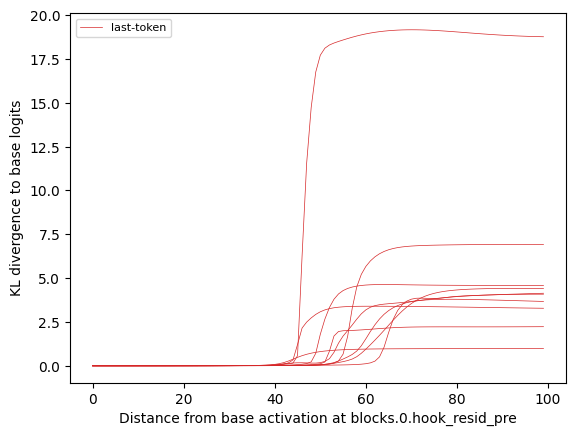

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 51
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  262,  8517,   286,   471,    37, 32298,    17,   468,  1234,   257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.25 GB


100%|██████████| 10/10 [00:07<00:00,  1.35it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

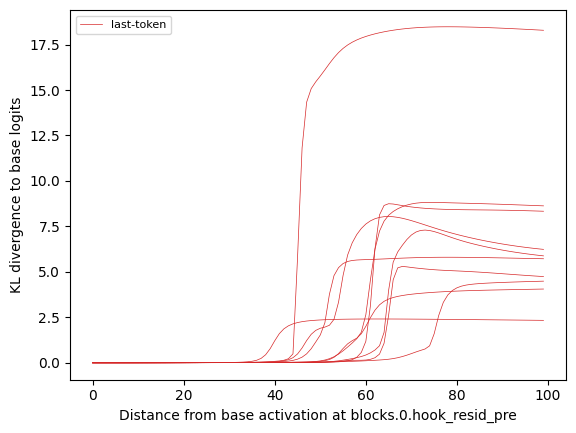

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
len(r_other_act)

0

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 51
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  262,  8517,   286,   471,    37, 32298,    17,   468,  1234,   257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.25 GB


100%|██████████| 10/10 [00:13<00:00,  1.40s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

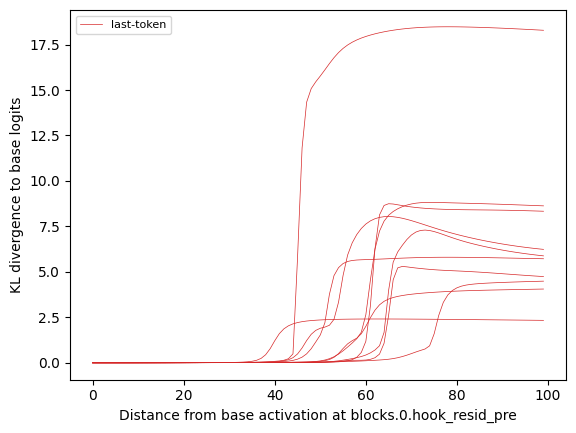

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
len(r_other_act)

10

In [ ]:
r_other_act[0]

tensor([[[ 3.9869e-02, -1.0090e-01, -7.0211e-02,  2.9179e-02, -1.2222e-01,
          -1.1508e-01, -2.5056e-01,  3.1159e-01, -1.2909e-02, -3.0553e-01,
          -1.6585e-01,  4.7428e-02, -2.7116e-01,  1.8237e-02,  1.0019e-01,
           3.8677e-02,  1.5786e-01,  5.3672e-02,  1.9691e-01,  7.9654e-01,
          -9.2050e-02, -4.2604e-03, -6.6489e-02,  5.9110e-02,  2.0416e-01,
           1.0842e-01,  1.0603e-01,  5.9865e-02, -1.3649e-01,  1.1966e-01,
           8.4548e-02, -3.2390e-01, -1.3377e-01, -1.3932e-01, -5.2942e-03,
           5.7093e-02, -1.4901e-01, -5.8333e-02,  1.0039e-01, -2.2316e-01,
          -4.9958e-02,  1.1518e-01, -1.3091e-01, -2.7959e-01,  6.8790e-02,
           1.1889e-01, -9.2227e-02,  6.8583e-02,  9.3805e-02, -2.0947e-01,
           4.1441e-02,  9.5159e-02,  9.3027e-01,  4.0804e-02, -3.4594e-02,
          -1.8503e-01,  5.3238e-02, -6.6125e-02, -8.8610e-02,  1.2330e-01,
          -2.2204e-01, -2.2327e-01, -1.3069e-01,  2.3704e-01,  1.7250e-01,
           1.1613e-01, -1

In [ ]:
for i in range(10):
    print(results[last_token_key][i][50])

tensor(0.0278)
tensor(0.0281)
tensor(0.0415)
tensor(0.0808)
tensor(0.1036)
tensor(1.8992)
tensor(0.0358)
tensor(1.5309)
tensor(2.3556)
tensor(15.7711)


In [ ]:
sens = r_other_act[-1]

In [ ]:
sens_encoded = sae.encode(sens)

In [ ]:
_, strs, acts, ids, _ = explore_sae_space(sens, sae)

In [ ]:
ids

[tensor([  513,  6111, 10920, 19337, 20184, 21821])]

In [ ]:
strs

[tensor([0.4826, 1.2876, 1.6871, 0.6467, 2.4065, 0.3698])]

In [ ]:
_, bstrs, bacts, bids, _ = explore_sae_space(base_ref.act, sae)

In [ ]:
bids

[tensor([ 1165,  7550, 11233, 15603, 18458, 19064, 20998, 24182])]

In [ ]:
for i in range(10):
    print(results[last_token_key][i][30])

tensor(0.0101)
tensor(0.0084)
tensor(0.0108)
tensor(0.0099)
tensor(0.0075)
tensor(0.0122)
tensor(0.0089)
tensor(0.0111)
tensor(0.0166)
tensor(0.0151)


In [ ]:
bstrs

[tensor([0.1479, 0.1744, 2.1026, 0.5188, 0.2054, 0.6522, 0.3380, 0.4194])]

In [ ]:
torch.norm(sens_encoded)

tensor(3.3291)

In [ ]:
A_encoded

NameError: name 'A_encoded' is not defined

In [ ]:
A_encoded = sae.encode(base_ref.act)

In [ ]:
torch.norm(A_encoded)

tensor(2.3476)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 51
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  262,  8517,   286,   471,    37, 32298,    17,   468,  1234,   257]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.25 GB


100%|██████████| 10/10 [00:14<00:00,  1.44s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

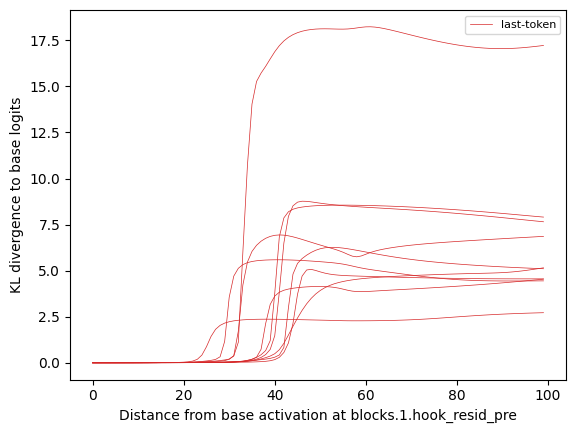

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 3
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  329,   262, 25098,   532,   290,   481,   629, 45828,   597,  5637]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.25 GB


100%|██████████| 10/10 [00:13<00:00,  1.39s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

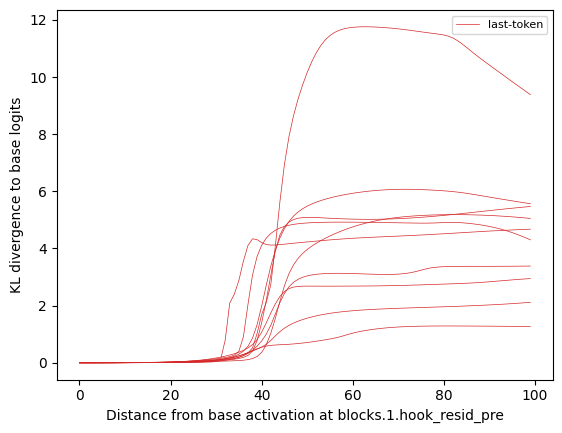

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 3
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = True
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  329,   262, 25098,   532,   290,   481,   629, 45828,   597,  5637]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.25 GB


100%|██████████| 10/10 [00:14<00:00,  1.40s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

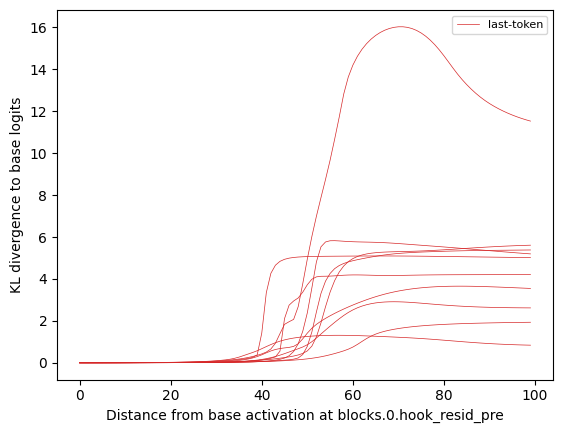

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
A

NameError: name 'A' is not defined

In [ ]:
A = base_ref.act

In [ ]:
torch.norm(A)

tensor(5.2009)

In [ ]:
model.to_str_tokens(base_ref.prompt)

[' for',
 ' the',
 ' Tories',
 ' -',
 ' and',
 ' will',
 ' sc',
 'upper',
 ' any',
 ' remaining']

In [ ]:
rec_error = (sae.decode(sae.encode(A)).abs().sum())

In [ ]:
rec_error

tensor(92.2377)

No kernel connected

Connected to .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 3
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  329,   262, 25098,   532,   290,   481,   629, 45828,   597,  5637]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 0.63 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 10/10 [00:08<00:00,  1.25it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

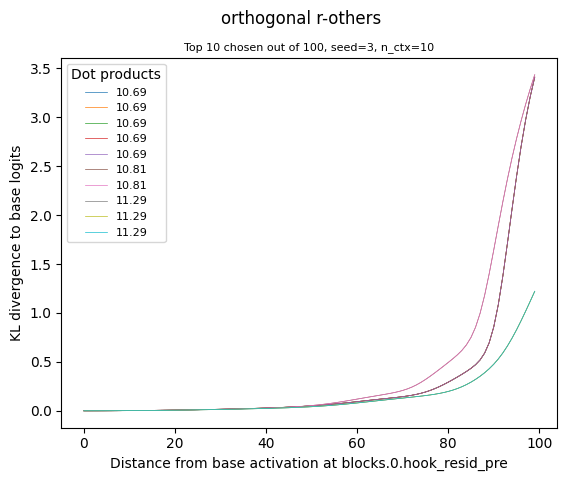

KeyError: 'predefined-other'

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = True
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

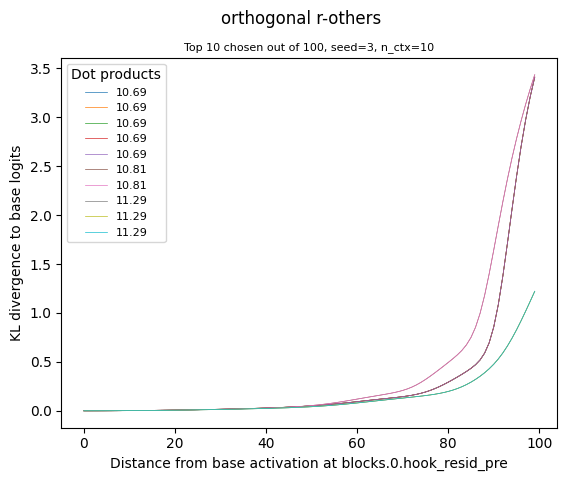

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 6
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 555
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  533,   862, 33576,  1267,    59, 18755]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 10/10 [00:08<00:00,  1.25it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

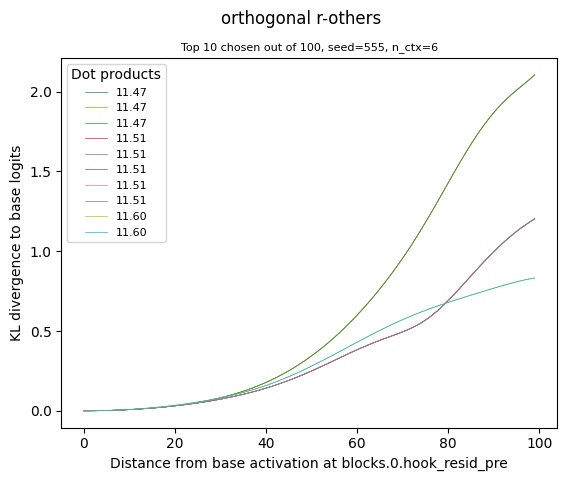

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
elif PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
len(results)

1

In [ ]:
len(results[predefined_other_key])

10

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

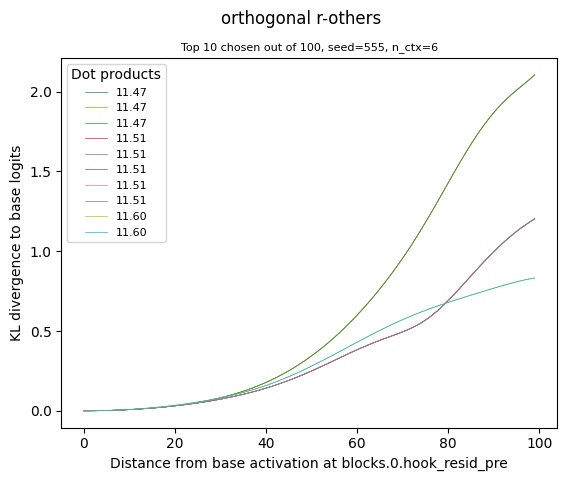

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


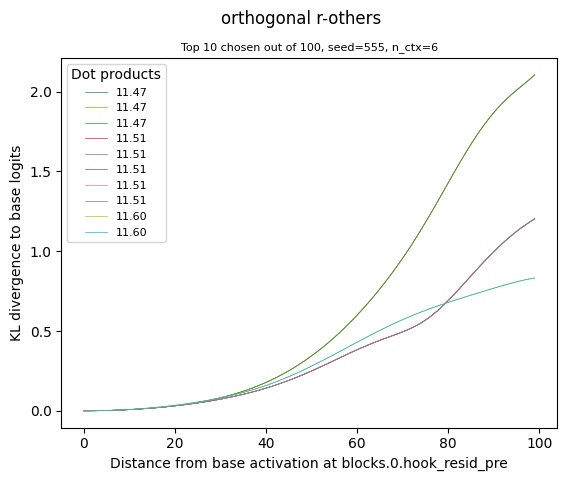

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        ) 

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


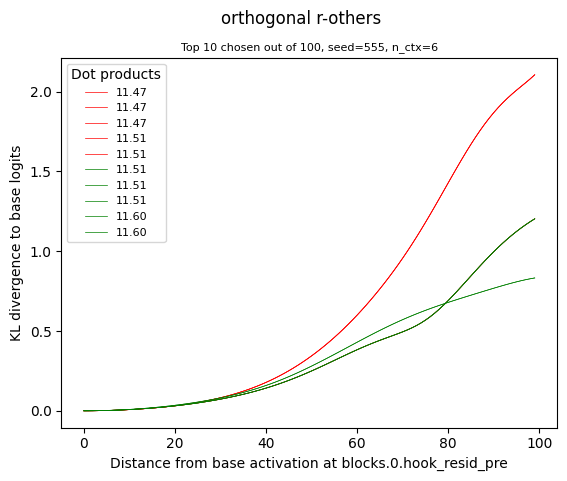

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 6
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 412
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 345, 1016,  284,  651,  340, 1363]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 10/10 [00:05<00:00,  1.75it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


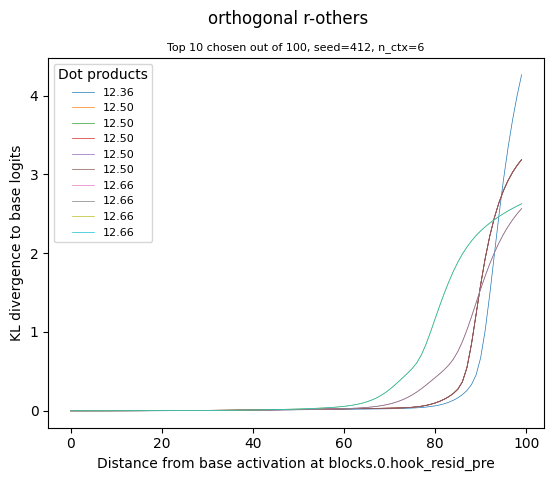

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 6
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 412
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = False
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 345, 1016,  284,  651,  340, 1363]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 10/10 [00:05<00:00,  1.83it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


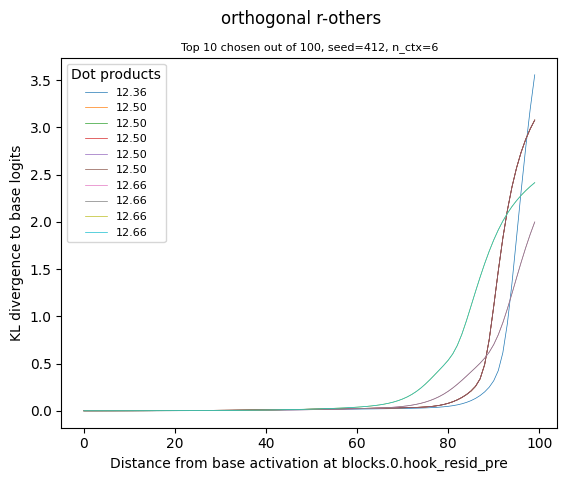

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 6
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 412
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 345, 1016,  284,  651,  340, 1363]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    ordering_metric = []
    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "dot product"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(A_origin.dot(t_origin).abs().item())
            sorted_indices = np.argsort(ordering_metric)
            ret_indices = sorted_indices[:10]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            ordering_metric.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(ordering_metric)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [ordering_metric[i] for i in ret_indices]

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 10/10 [00:01<00:00,  6.54it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


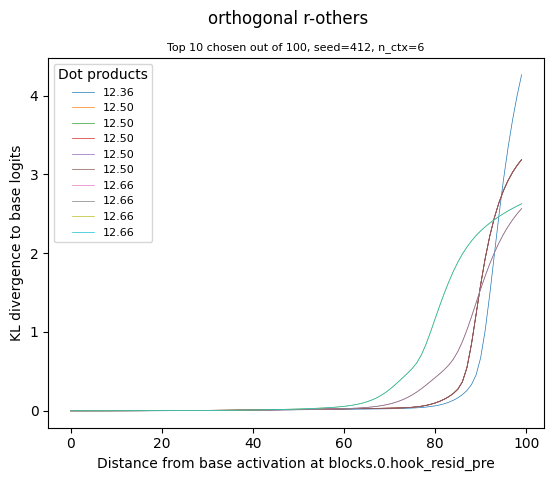

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
A_origin.shape


torch.Size([768])

In [ ]:
len(data)


100

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if metrics[i].abs() < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AttributeError: 'float' object has no attribute 'abs'

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
number_of_prompts_pe


15

In [ ]:
predefined_other_prompts

tensor([], size=(0, 6), dtype=torch.int64)

In [ ]:
metrics

[0.6785992383956909,
 0.6993318796157837,
 0.6993318796157837,
 0.6287041902542114,
 0.6589248776435852,
 0.6287041902542114,
 0.6524055600166321,
 0.6717455983161926,
 0.6646491289138794,
 0.6785992383956909,
 0.6379718780517578,
 0.6801583766937256,
 0.5921607613563538,
 0.5706031322479248,
 0.6785992383956909,
 0.6362918615341187,
 0.6313867568969727,
 0.6123497486114502,
 0.5918389558792114,
 0.6520313024520874,
 0.5275312066078186,
 0.5720340013504028,
 0.5940558910369873,
 0.6631783843040466,
 0.6161795854568481,
 0.6315860748291016,
 0.6253387928009033,
 0.6993318796157837,
 0.6881928443908691,
 0.6602341532707214,
 0.6350759267807007,
 0.6724282503128052,
 0.6618326902389526,
 0.673316478729248,
 0.673316478729248,
 0.664911687374115,
 0.627890408039093,
 0.6287041902542114,
 0.6329574584960938,
 0.6618326902389526,
 0.6314085721969604,
 0.6337111592292786,
 0.6785992383956909,
 0.613473653793335,
 0.6337111592292786,
 0.6993318796157837,
 0.5701903700828552,
 0.653356432914733

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 412
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  345,  1016,   284,   651,   340,  1363,    30,   406, 14887, 11114]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
metrics

[0.5056387782096863,
 0.5767092704772949,
 0.6164469122886658,
 0.5859898328781128,
 0.5324534773826599,
 0.5882692337036133,
 0.6112508177757263,
 0.5699098110198975,
 0.5964779853820801,
 0.5497982501983643,
 0.5924991369247437,
 0.6228413581848145,
 0.5578446388244629,
 0.5923120379447937,
 0.5421919226646423,
 0.5830751657485962,
 0.5634099841117859,
 0.5977166295051575,
 0.5497982501983643,
 0.5421919226646423,
 0.5946311950683594,
 0.5497982501983643,
 0.5468019247055054,
 0.5549675226211548,
 0.5939018726348877,
 0.6323778629302979,
 0.5800076723098755,
 0.602940559387207,
 0.5892211198806763,
 0.5825493335723877,
 0.613305926322937,
 0.5497982501983643,
 0.5949798822402954,
 0.6165857911109924,
 0.6013603210449219,
 0.5885356068611145,
 0.5648216009140015,
 0.5921120047569275,
 0.5630553364753723,
 0.6000747084617615,
 0.6180975437164307,
 0.6023765802383423,
 0.6693247556686401,
 0.6250103712081909,
 0.5559206008911133,
 0.5634099841117859,
 0.5842652320861816,
 0.604485154151

In [ ]:
t

tensor([ 6.2211e-02,  7.7434e-03,  1.5173e-01, -1.2881e-01,  5.1478e-02,
        -5.7624e-02, -2.6292e-01,  3.9022e-03,  3.2553e-02,  4.6011e-02,
         4.0936e-02,  2.1447e-02,  8.0856e-02,  1.6174e-03, -6.8230e-02,
         8.0373e-02,  2.4279e-03, -5.9361e-02, -6.9348e-02,  5.9341e-01,
        -4.6278e-02,  3.4795e-02, -4.2838e-02, -4.0358e-02, -3.0409e-02,
         6.0560e-02, -5.3887e-02, -1.5280e-02, -4.1206e-02, -4.2645e-02,
        -7.4843e-02,  4.7223e-02, -6.3666e-03,  6.5159e-02,  5.7000e-02,
         8.4284e-02, -5.5893e-01, -4.8568e-02, -9.4384e-02,  3.8328e-02,
         5.9020e-02,  5.0734e-02,  8.3147e-02,  7.7871e-02, -3.9136e-02,
        -7.9109e-02,  4.9377e-02, -8.6683e-02, -7.1570e-02, -5.7243e-01,
         4.8100e-02,  6.4499e-02,  9.7741e-02,  4.3640e-02, -6.1355e-02,
        -3.0440e-01, -2.7763e-02,  7.0107e-02, -1.5039e-02, -8.0547e-03,
        -1.3475e-01,  1.8181e-02, -5.8549e-02,  4.2687e-02, -3.7811e-01,
         1.2341e-01,  7.7369e-02, -5.9207e-02,  2.4

In [ ]:
torch.norm(t)

tensor(4.6062)

In [ ]:
torch.norm(A)

NameError: name 'A' is not defined

In [ ]:
torch.norm(base_ref.act)

tensor(5.2986)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 412
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  345,  1016,   284,   651,   340,  1363,    30,   406, 14887, 11114]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.91 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
metrics


[0.365162193775177,
 0.2937367558479309,
 0.4045093059539795,
 0.39129358530044556,
 0.3684445023536682,
 0.4032643437385559,
 0.3692321479320526,
 0.4358338713645935,
 0.42695513367652893,
 0.3692913055419922,
 0.427930623292923,
 0.45358985662460327,
 0.36861652135849,
 0.39939406514167786,
 0.3178327679634094,
 0.30506718158721924,
 0.360484778881073,
 0.3787439167499542,
 0.350394606590271,
 0.31985658407211304,
 0.4628007709980011,
 0.35120993852615356,
 0.33262041211128235,
 0.35280168056488037,
 0.39144790172576904,
 0.39643988013267517,
 0.4069603681564331,
 0.448239803314209,
 0.3499353229999542,
 0.34364479780197144,
 0.37567853927612305,
 0.36033743619918823,
 0.4154009222984314,
 0.4207555651664734,
 0.30742889642715454,
 0.4204674959182739,
 0.41204559803009033,
 0.3692134618759155,
 0.40760815143585205,
 0.4799671769142151,
 0.4043269157409668,
 0.4352996051311493,
 0.4844490587711334,
 0.499106228351593,
 0.31813564896583557,
 0.3597516119480133,
 0.3692992925643921,
 0.

In [ ]:
max(metrics)

0.499106228351593

In [ ]:
min(metrics)

0.2804010510444641

In [ ]:
torch.norm(sae.b_dec)

tensor(42.1730)

In [ ]:
torch.norm(base_ref.act.squeeze(0).squeeze(0))

tensor(56.3384)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 412
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  345,  1016,   284,   651,   340,  1363,    30,   406, 14887, 11114]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(data.shape)
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )

    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.91 GB
torch.Size([100, 768])
data_cov is not positive definite, need to alter it slightly


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
             )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
predefined_other_prompts

tensor([], size=(0, 10), dtype=torch.int64)

In [ ]:
metrics

[0.365162193775177,
 0.2937367558479309,
 0.4045093059539795,
 0.39129358530044556,
 0.3684445023536682,
 0.4032643437385559,
 0.3692321479320526,
 0.4358338713645935,
 0.42695513367652893,
 0.3692913055419922,
 0.427930623292923,
 0.45358985662460327,
 0.36861652135849,
 0.39939406514167786,
 0.3178327679634094,
 0.30506718158721924,
 0.360484778881073,
 0.3787439167499542,
 0.350394606590271,
 0.31985658407211304,
 0.4628007709980011,
 0.35120993852615356,
 0.33262041211128235,
 0.35280168056488037,
 0.39144790172576904,
 0.39643988013267517,
 0.4069603681564331,
 0.448239803314209,
 0.3499353229999542,
 0.34364479780197144,
 0.37567853927612305,
 0.36033743619918823,
 0.4154009222984314,
 0.4207555651664734,
 0.30742889642715454,
 0.4204674959182739,
 0.41204559803009033,
 0.3692134618759155,
 0.40760815143585205,
 0.4799671769142151,
 0.4043269157409668,
 0.4352996051311493,
 0.4844490587711334,
 0.499106228351593,
 0.31813564896583557,
 0.3597516119480133,
 0.3692992925643921,
 0.

In [ ]:
temp_metrics

[0.6580264568328857,
 0.6937065124511719,
 0.7396737337112427,
 0.7461938858032227,
 0.7372399568557739,
 0.7559506893157959,
 0.7306879162788391,
 0.7270863056182861,
 0.7140834331512451,
 0.7359381914138794,
 0.6977770924568176,
 0.7363176941871643,
 0.7067068815231323,
 0.7142928838729858,
 0.7054731845855713,
 0.7002218961715698,
 0.73680180311203,
 0.7358258962631226,
 0.7258316874504089,
 0.7061803340911865,
 0.746475100517273,
 0.7280328273773193,
 0.6352242231369019,
 0.6419723033905029,
 0.6969010829925537,
 0.7302005290985107,
 0.7410744428634644,
 0.7157713174819946,
 0.7123004794120789,
 0.6836218237876892,
 0.7251744270324707,
 0.7315742373466492,
 0.7197006344795227,
 0.735858678817749,
 0.699454665184021,
 0.7175472974777222,
 0.7369652986526489,
 0.7411890029907227,
 0.7361047267913818,
 0.7522473335266113,
 0.7498346567153931,
 0.7265667915344238,
 0.744813859462738,
 0.7628952860832214,
 0.6158274412155151,
 0.7380926609039307,
 0.7008679509162903,
 0.7487080097198486

In [ ]:
torch.to_str_tokens(base_prompt)

AttributeError: module 'torch' has no attribute 'to_str_tokens'

In [ ]:
model.to_str_tokens(base_prompt)

[' you', ' going', ' to', ' get', ' it', ' home', '?', ' L', 'IZ', ' walks']

In [ ]:
batch_of_prompts

tensor([[ 4410,    11,  1390, 39767,    82,   290, 14554, 13224,    12, 11487],
        [ 8814,   319,   326,  2438,  4683,   287,   534,   898, 15563,   357],
        [22594,   351,   262,  2742,  2858,   287, 31295,    13,  3244,   356],
        [  257,  5655,    12, 36866,  1181,    11,  1422,   470,  4654,   287],
        [  428,   845,   881,  2014,   843,   617,   309,  7708,   364,    11],
        [ 1908,  6920,  9483,   318, 19365,    11,   345,  1183,   761,   284],
        [  379,   617,   517,  5205,    13,  4042,   286,   777,  1625,   422],
        [  788,   314,  2067,   284,  6537,   644,   340,  1724,   284,  3357],
        [  607,  1204,    13, 16168,   278,   607,   284,  4729,   257,  5229],
        [ 4485,  2029,   262, 39017,  1641,   290, 11005,   606,  1111,    13],
        [ 1919,  2056,   338, 13530,    13,  2332,  1393,   287,  1262, 23696],
        [ 1398,  6531,   318, 17640,   546,   428,  5358,   287,   262,  3034],
        [  287,   262,  7346,   583,   4

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 412
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  345,  1016,   284,   651,   340,  1363,    30,   406, 14887, 11114]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.91 GB
batch data shape: torch.Size([100, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 412
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  345,  1016,   284,   651,   340,  1363,    30,   406, 14887, 11114]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.91 GB
batch data shape: torch.Size([100, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
predefined_other_prompts

tensor([], size=(0, 10), dtype=torch.int64)

In [ ]:
metrics

[0.365162193775177,
 0.2937367558479309,
 0.4045093059539795,
 0.39129358530044556,
 0.3684445023536682,
 0.4032643437385559,
 0.3692321479320526,
 0.4358338713645935,
 0.42695513367652893,
 0.3692913055419922,
 0.427930623292923,
 0.45358985662460327,
 0.36861652135849,
 0.39939406514167786,
 0.3178327679634094,
 0.30506718158721924,
 0.360484778881073,
 0.3787439167499542,
 0.350394606590271,
 0.31985658407211304,
 0.4628007709980011,
 0.35120993852615356,
 0.33262041211128235,
 0.35280168056488037,
 0.39144790172576904,
 0.39643988013267517,
 0.4069603681564331,
 0.448239803314209,
 0.3499353229999542,
 0.34364479780197144,
 0.37567853927612305,
 0.36033743619918823,
 0.4154009222984314,
 0.4207555651664734,
 0.30742889642715454,
 0.4204674959182739,
 0.41204559803009033,
 0.3692134618759155,
 0.40760815143585205,
 0.4799671769142151,
 0.4043269157409668,
 0.4352996051311493,
 0.4844490587711334,
 0.499106228351593,
 0.31813564896583557,
 0.3597516119480133,
 0.3692992925643921,
 0.

In [ ]:
max(metrics)

0.499106228351593

In [ ]:
min(metrics)

0.2804010510444641

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 433112
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  393,  1194,    13,   383,  1499,   338,   717, 23050,  2855,   373]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.91 GB
batch data shape: torch.Size([100, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
min(metrics)

0.253616064786911

In [ ]:
max(metrics)

0.7419432401657104

In [ ]:
max(temp_metrics)

0.9069517254829407

In [ ]:
min(temp_metrics)

0.5912989377975464

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.91 GB
batch data shape: torch.Size([100, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
metrics

[0.41706711053848267,
 0.4088876247406006,
 0.38699594140052795,
 0.38337695598602295,
 0.44426196813583374,
 0.4078710973262787,
 0.4290742874145508,
 0.33060336112976074,
 0.3691667318344116,
 0.3664489984512329,
 0.4192904233932495,
 0.38325172662734985,
 0.4603813886642456,
 0.3602217137813568,
 0.4160380959510803,
 0.4021303057670593,
 0.3640182614326477,
 0.36904823780059814,
 0.41263073682785034,
 0.38181203603744507,
 0.37922635674476624,
 0.3940218687057495,
 0.4929044544696808,
 0.3799113631248474,
 0.41694551706314087,
 0.38626790046691895,
 0.38923126459121704,
 0.39688315987586975,
 0.4041317105293274,
 0.4192482531070709,
 0.3006715178489685,
 0.3980713188648224,
 0.443683922290802,
 0.34323135018348694,
 0.46145713329315186,
 0.33483749628067017,
 0.39896225929260254,
 0.4239398241043091,
 0.3188033103942871,
 0.42989909648895264,
 0.45088279247283936,
 0.38874000310897827,
 0.47113895416259766,
 0.40969574451446533,
 0.41970956325531006,
 0.3556189239025116,
 0.42209357

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.27 GB


  0%|          | 0/10 [00:00<?, ?it/s]


ValueError: No more predefined prompts to perturb to

In [ ]:
predefined_other_prompts

tensor([[ 1664,  1422,   470,  3031,   416,  1803,   640,    13,   198,   198],
        [  564,   250,   260,  1759,  1368,    13,   447,   251,   198,   198],
        [25408, 25431, 16113,    13,   198,   198,  2348,  3734,   198,   198],
        [ 8915,  8915,  4747,    13,    17,   764, 44465,   764, 30336,   764],
        [  484,  3588,   447,   247,    83,  4609,   287,   257,  1730,    13],
        [ 2450,  1839,    74,   508,   318,   287,   262,  2642,  1693,    13],
        [  464,   640,     8,   373,   384,   316,   722,   351,  8993,   290],
        [  832,   262, 13647,   379,   257, 12296,  1973,   422,   606,    13],
        [22709,    68, 22709,    68,  2718, 22709,    67,  2718,  2623,    13],
        [ 2576,    13,   314,  2314, 21322,  1576,   326,   428,   318,   257],
        [  878,  7216,   606,   319,   584,  5479,    13,   770,   318,   257],
        [  319,   883,   508,  8659,   351,  7669, 31267,   282, 11916,    13],
        [  938,  2912,    13,   198,   1

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 10/10 [00:32<00:00,  3.20s/it]


In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


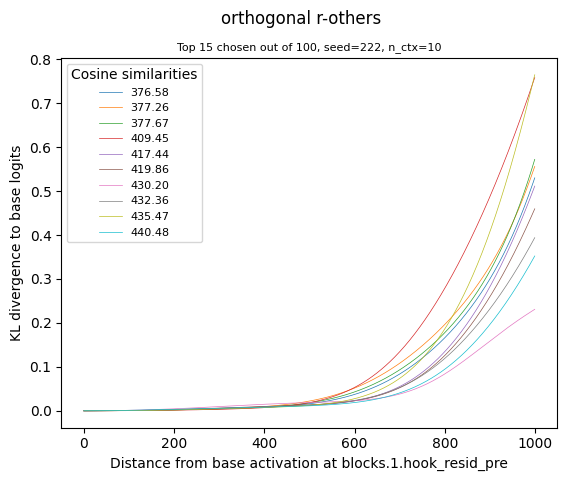

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.90 GB
batch data shape: torch.Size([100, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 15
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 15

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.90 GB


100%|██████████| 15/15 [00:03<00:00,  4.78it/s]


In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14


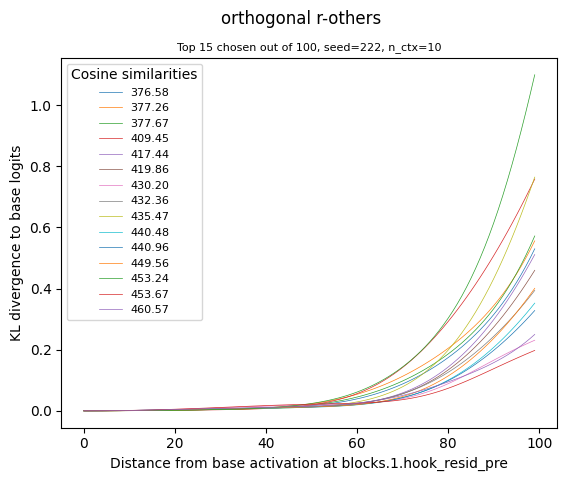

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([100, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 10
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:02<00:00,  4.53it/s]


In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


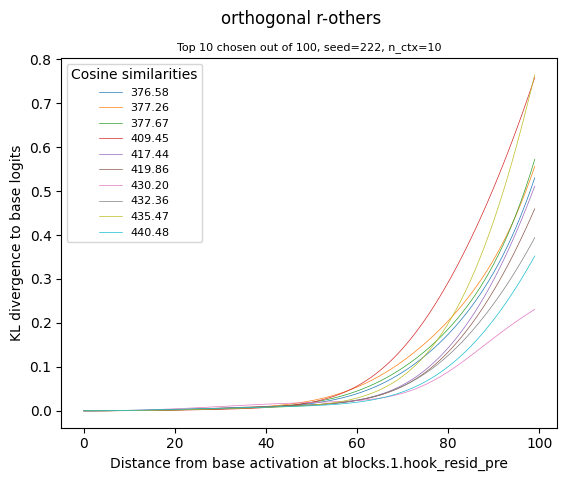

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 300
mean_batch_size = 100
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([100, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 10
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:04<00:00,  2.09it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


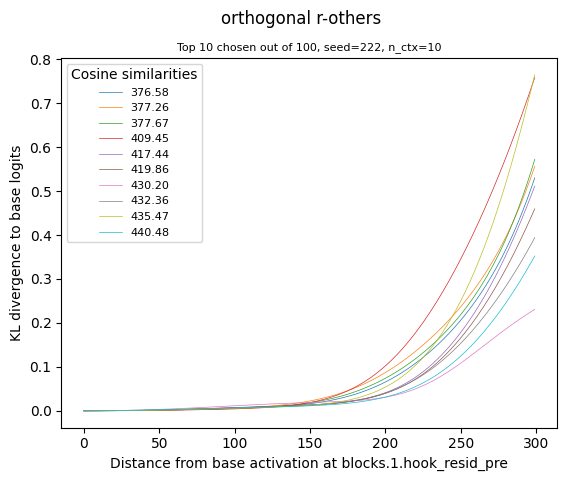

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 10
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:02<00:00,  4.66it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


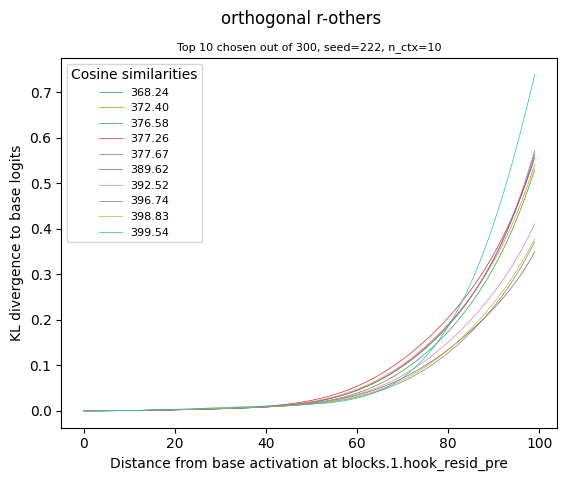

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = False
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 10
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:02<00:00,  4.79it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


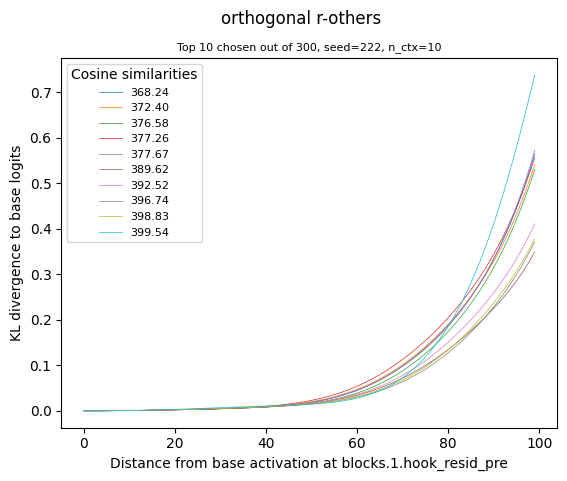

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
metrics

[590.77490234375,
 564.8268432617188,
 543.4180908203125,
 494.81146240234375,
 597.3656005859375,
 642.458251953125,
 556.4952392578125,
 435.4674377441406,
 487.0037536621094,
 485.43487548828125,
 491.4623718261719,
 511.93072509765625,
 803.8597412109375,
 594.2857055664062,
 539.96337890625,
 560.373779296875,
 625.610595703125,
 453.6737060546875,
 546.90673828125,
 714.2820434570312,
 474.66827392578125,
 665.6761474609375,
 824.3251953125,
 674.8753051757812,
 660.929443359375,
 519.1502685546875,
 794.1053466796875,
 478.4845886230469,
 580.496337890625,
 670.1543579101562,
 545.0401611328125,
 505.31268310546875,
 627.32373046875,
 515.914794921875,
 660.08740234375,
 548.5204467773438,
 553.26806640625,
 475.5513916015625,
 453.2398681640625,
 531.3997192382812,
 741.6484985351562,
 478.7013854980469,
 625.1300048828125,
 705.1438598632812,
 706.4011840820312,
 653.0510864257812,
 613.513671875,
 759.9647827148438,
 697.9406127929688,
 700.0582275390625,
 468.4662170410156,


In [ ]:
max(metrics)

916.146484375

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 10
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[
        :number_of_prompts_pe
    ]  # batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 10/10 [00:01<00:00,  5.25it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9


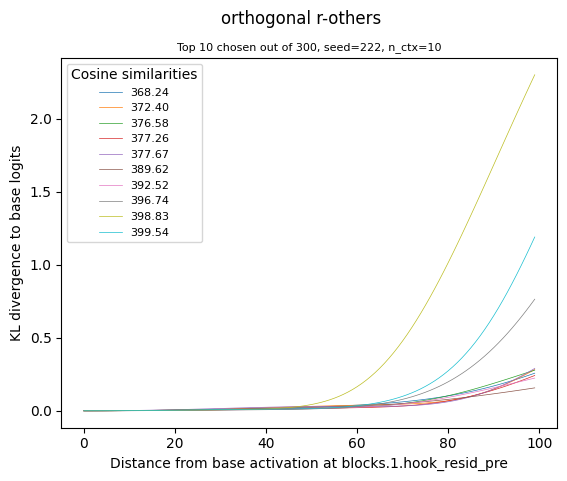

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
model.to_str_tokens(base_prompt)

['http', '://', 'www', '.', 'then', 'ational', '.', 'ae', '/', 'world']

In [ ]:
sae.cfg

SAEConfig(architecture='standard', d_in=768, d_sae=24576, activation_fn_str='relu', apply_b_dec_to_input=True, finetuning_scaling_factor=False, context_size=128, model_name='gpt2-small', hook_name='blocks.1.hook_resid_pre', hook_layer=1, hook_head_index=None, prepend_bos=True, dataset_path='Skylion007/openwebtext', dataset_trust_remote_code=True, normalize_activations='none', dtype='float32', device='cpu', sae_lens_training_version=None, activation_fn_kwargs={})

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 50
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 50/50 [00:10<00:00,  4.93it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


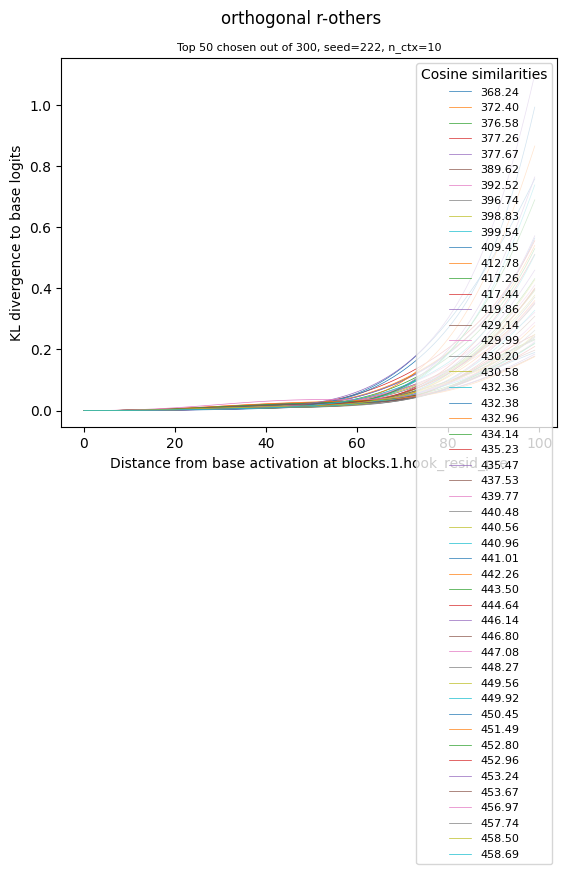

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 50
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            # metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 50/50 [00:09<00:00,  5.30it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 5
    second_5_colors = ["green"] * 5
    last_5_colors = ["blue"] * 5

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            print(i)
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


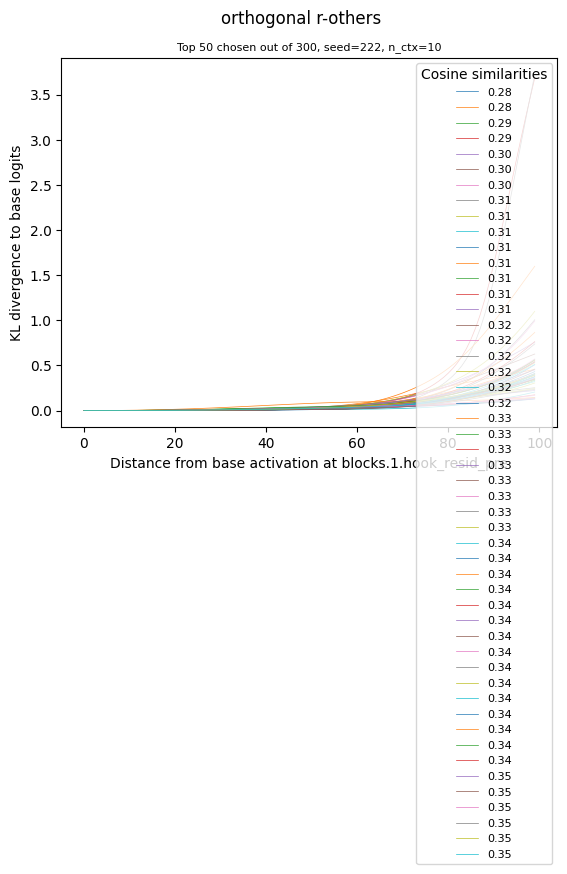

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 50
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
            # metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 50/50 [00:11<00:00,  4.53it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

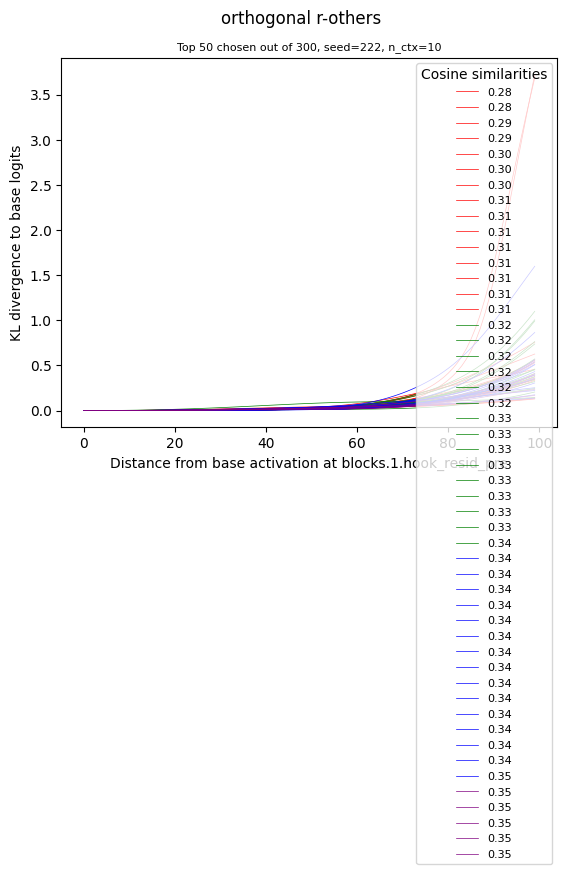

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    #label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    #label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    if predefined_other_metric == "dot product":
        #plt.legend(title="Dot products", fontsize=8)
    elif predefined_other_metric == "cosine similarity":
        #plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

IndentationError: expected an indented block after 'if' statement on line 39 (<ipython-input-448-573768f35b20>, line 41)

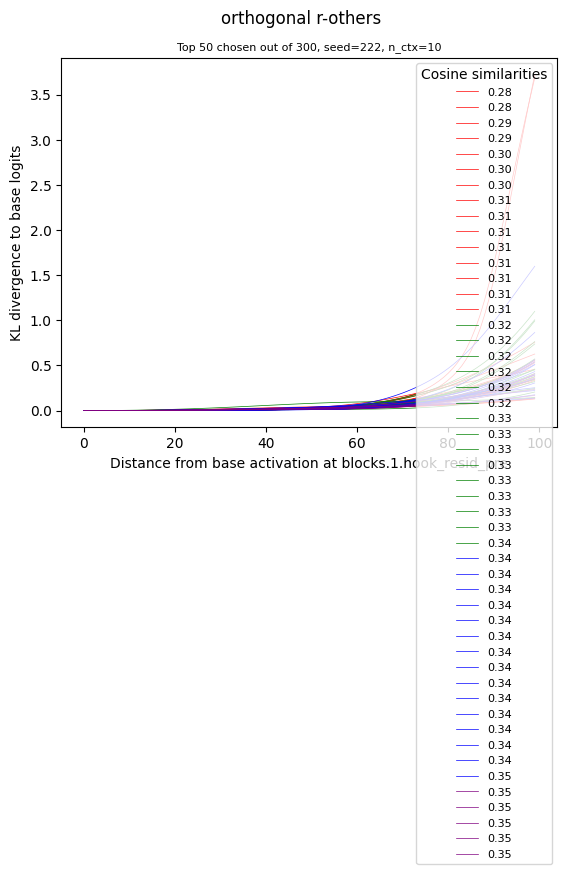

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    #label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    #label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

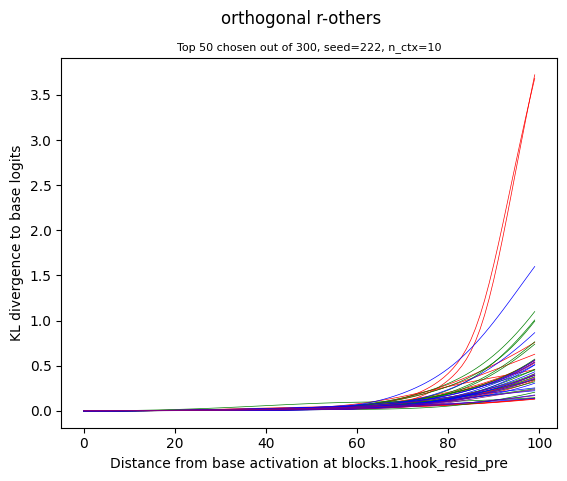

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 50
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            #metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 2.52 GB


100%|██████████| 50/50 [00:09<00:00,  5.32it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    #label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    #label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

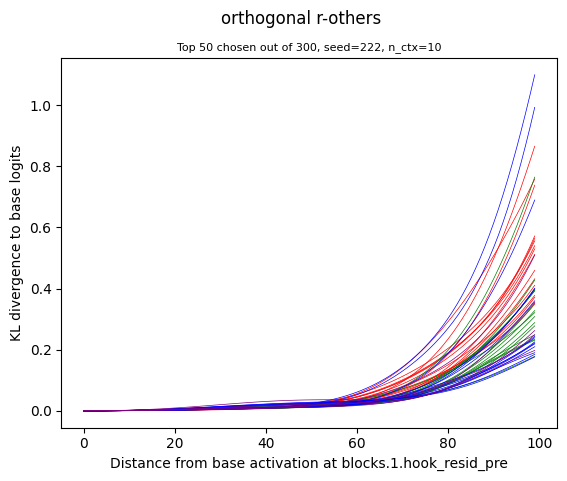

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 2.52 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 50
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics, order="descending")
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

ValueError: Cannot specify order when the array has no fields.

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

: 

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

: 

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

: 

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.90 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 50
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)[::-1]
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

ValueError: At least one stride in the given numpy array is negative, and tensors with negative strides are not currently supported. (You can probably work around this by making a copy of your array  with array.copy().) 

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

: 

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

: 

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

: 

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)[::-1]
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

ValueError: At least one stride in the given numpy array is negative, and tensors with negative strides are not currently supported. (You can probably work around this by making a copy of your array  with array.copy().) 

In [ ]:
metrics

[590.77490234375,
 564.8268432617188,
 543.4180908203125,
 494.81146240234375,
 597.3656005859375,
 642.458251953125,
 556.4952392578125,
 435.4674377441406,
 487.0037536621094,
 485.43487548828125,
 491.4623718261719,
 511.93072509765625,
 803.8597412109375,
 594.2857055664062,
 539.96337890625,
 560.373779296875,
 625.610595703125,
 453.6737060546875,
 546.90673828125,
 714.2820434570312,
 474.66827392578125,
 665.6761474609375,
 824.3251953125,
 674.8753051757812,
 660.929443359375,
 519.1502685546875,
 794.1053466796875,
 478.4845886230469,
 580.496337890625,
 670.1543579101562,
 545.0401611328125,
 505.31268310546875,
 627.32373046875,
 515.914794921875,
 660.08740234375,
 548.5204467773438,
 553.26806640625,
 475.5513916015625,
 453.2398681640625,
 531.3997192382812,
 741.6484985351562,
 478.7013854980469,
 625.1300048828125,
 705.1438598632812,
 706.4011840820312,
 653.0510864257812,
 613.513671875,
 759.9647827148438,
 697.9406127929688,
 700.0582275390625,
 468.4662170410156,


In [ ]:
sorted_indices

array([224, 248, 190,  22, 107,  51,  12, 295,  26,  57, 273, 214,  74,
       151, 113, 207, 165,  55,  47,  82,  97, 108, 166,  40, 120, 240,
       148,  59,  81, 160, 126,  66, 187,  85,  89,  19, 105, 171, 141,
       242,  44, 249,  43, 288, 286,  49,  48, 227,  99, 255, 175,  90,
       272, 181, 185, 256, 283, 275, 109, 162, 188, 112, 259, 186,  23,
       133,  29,  80, 176,  58,  21, 266,  24,  64,  34, 246,  45, 130,
       172, 243, 180, 297, 106, 182, 155, 191, 281,   5, 134, 239, 213,
       211, 196,  75, 290, 177,  32,  16,  42, 276, 254,  79,  46, 294,
       164, 204, 131, 282, 118, 278, 168, 218, 217, 147,   4, 150, 212,
        13, 293, 123, 193,   0, 114, 121, 104, 206, 173, 124,  28,  61,
       265, 101,  69, 250, 116, 170, 138, 280,   1,  15,  87, 279, 219,
         6, 245, 233,  36, 237, 149,  35, 232, 230,  18,  94, 236, 253,
       225,  92,  30, 292, 209,   2, 194, 210, 146, 252,  14, 220, 189,
       103, 287, 226, 234, 142,  39, 274, 145, 132,  56, 144, 28

In [ ]:
ret_indices

array([224, 248, 190,  22, 107,  51,  12, 295,  26,  57, 273, 214,  74,
       151, 113, 207, 165,  55,  47,  82,  97, 108, 166,  40, 120, 240,
       148,  59,  81, 160, 126,  66, 187,  85,  89,  19, 105, 171, 141,
       242,  44, 249,  43, 288, 286])

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)[::-1]
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

ValueError: At least one stride in the given numpy array is negative, and tensors with negative strides are not currently supported. (You can probably work around this by making a copy of your array  with array.copy().) 

In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae=None,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)

    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.90 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        if CACHE:
            kl_div = run_perturbation(base_ref, perturbation, sae)
        else:
            kl_div = run_perturbation(base_ref, perturbation)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 45/45 [00:10<00:00,  4.30it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

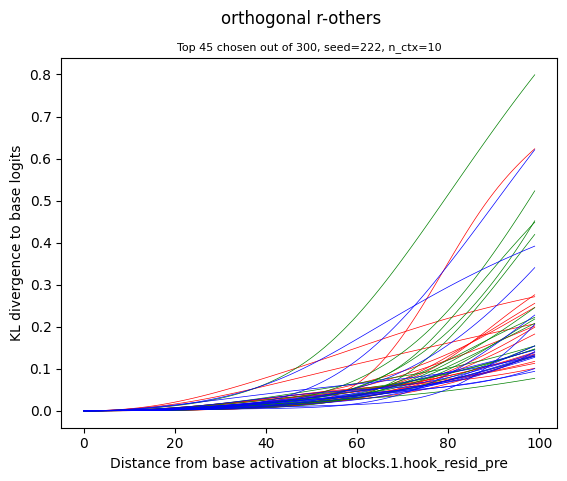

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["yellow"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

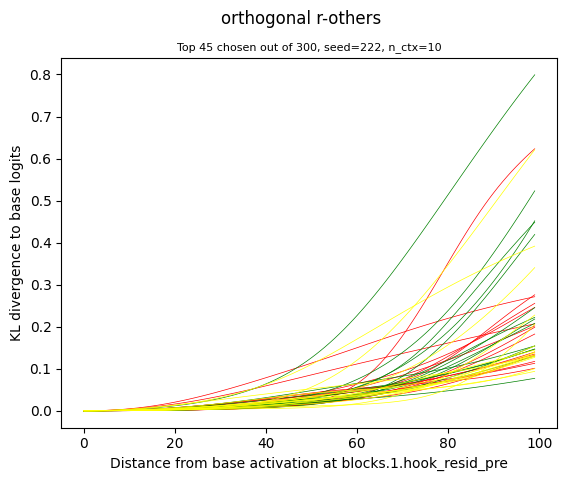

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["orange"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

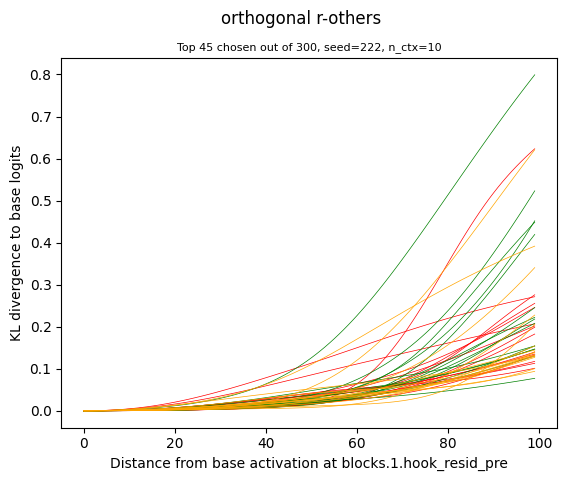

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

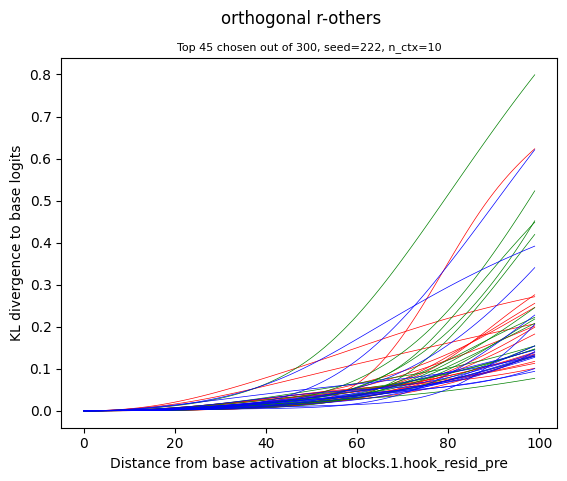

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 45/45 [00:09<00:00,  4.64it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

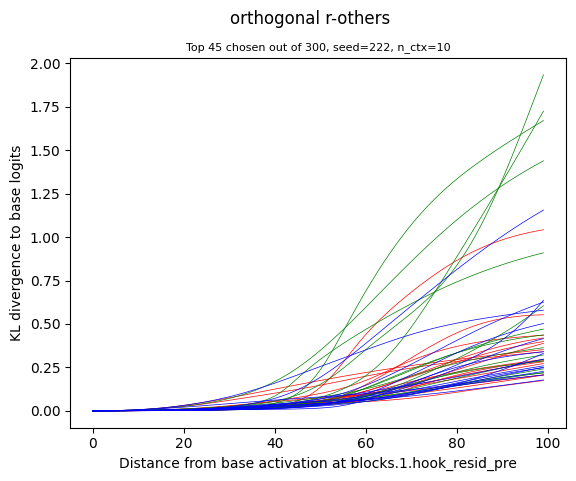

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 45/45 [00:10<00:00,  4.14it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

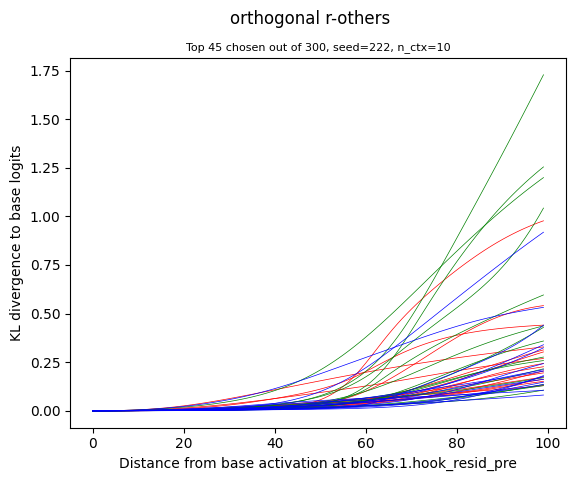

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)  # [::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

AssertionError: 

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

: 

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

: 

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

: 

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.89 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = False
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)  # [::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[:number_of_prompts_pe]#batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 45/45 [00:09<00:00,  4.88it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

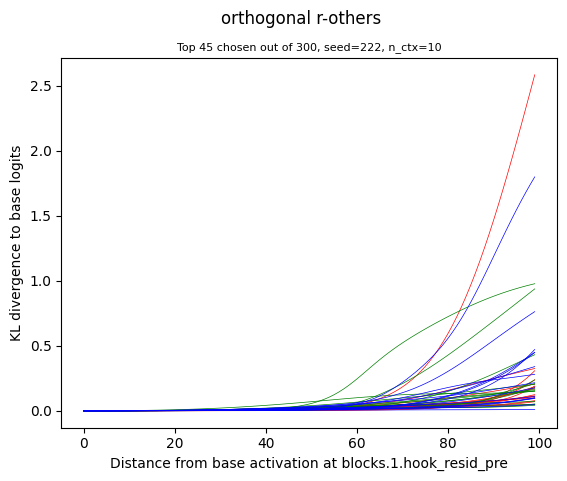

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

Connected to .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 0.63 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)  # [::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[
        :number_of_prompts_pe
    ]  # batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 45/45 [00:23<00:00,  1.94it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

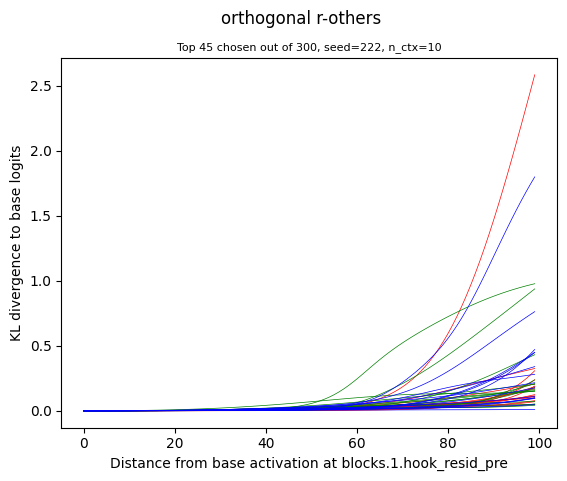

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
len(results[predefined_other_key])

45

In [ ]:
for i in range(45):
    print(f"{i} {results[predefined_other_key][i]}")

0 tensor([5.9805e-08, 6.3572e-06, 2.0482e-05, 4.4815e-05, 8.0934e-05, 1.2668e-04,
        1.8280e-04, 2.5307e-04, 3.3261e-04, 4.2563e-04, 5.3230e-04, 6.4977e-04,
        7.8252e-04, 9.2988e-04, 1.0909e-03, 1.2677e-03, 1.4577e-03, 1.6657e-03,
        1.8902e-03, 2.1294e-03, 2.3881e-03, 2.6631e-03, 2.9562e-03, 3.2675e-03,
        3.5984e-03, 3.9489e-03, 4.3172e-03, 4.7051e-03, 5.1132e-03, 5.5396e-03,
        5.9849e-03, 6.4497e-03, 6.9321e-03, 7.4343e-03, 7.9533e-03, 8.4881e-03,
        9.0409e-03, 9.6089e-03, 1.0192e-02, 1.0791e-02, 1.1403e-02, 1.2028e-02,
        1.2662e-02, 1.3310e-02, 1.3968e-02, 1.4635e-02, 1.5310e-02, 1.5994e-02,
        1.6684e-02, 1.7382e-02, 1.8088e-02, 1.8800e-02, 1.9520e-02, 2.0248e-02,
        2.0984e-02, 2.1730e-02, 2.2489e-02, 2.3261e-02, 2.4048e-02, 2.4854e-02,
        2.5682e-02, 2.6536e-02, 2.7418e-02, 2.8339e-02, 2.9296e-02, 3.0303e-02,
        3.1364e-02, 3.2484e-02, 3.3672e-02, 3.4942e-02, 3.6297e-02, 3.7749e-02,
        3.9314e-02, 4.0999e-02, 4.2815

In [ ]:
for i in range(45):
    print(f"{i} {results[predefined_other_key][i][60]}")

0 0.02568233758211136
1 0.029836513102054596
2 0.009968798607587814
3 0.013481635600328445
4 0.03460747003555298
5 0.018229441717267036
6 0.008222009055316448
7 0.0040895892307162285
8 0.045928243547677994
9 0.012762200087308884
10 0.023437760770320892
11 0.02178792469203472
12 0.0349159874022007
13 0.034381091594696045
14 0.03794940561056137
15 0.036149974912405014
16 0.029049700126051903
17 0.0170288123190403
18 0.01282985508441925
19 0.06678777933120728
20 0.016884135082364082
21 0.10044404119253159
22 0.042323991656303406
23 0.06329269707202911
24 0.04621836543083191
25 0.01171688549220562
26 0.24600447714328766
27 0.0334354005753994
28 0.030996304005384445
29 0.026448354125022888
30 0.06275428086519241
31 0.025450631976127625
32 0.0191093347966671
33 0.05279943719506264
34 0.02063610777258873
35 0.04924286901950836
36 0.013165365904569626
37 0.005530986003577709
38 0.017951494082808495
39 0.012537449598312378
40 0.05471835285425186
41 0.012461438775062561
42 0.027919786050915718
4

In [ ]:
batch_of_prompts[21]

tensor([ 9706,   373, 33922,    13,   554,  3095,    12, 15749,   607,  6853])

In [ ]:
model.to_str_tokens(batch_of_prompts[21])

[' execution',
 ' was',
 ' postponed',
 '.',
 ' In',
 ' mid',
 '-',
 'June',
 ' her',
 ' lawyer']

In [ ]:
results[predefined_other_key][21][-1]

tensor(0.1509)

In [ ]:
results[predefined_other_key][21][50]

tensor(0.0700)

In [ ]:
results[predefined_other_key][21]

tensor([5.9805e-08, 1.5874e-05, 5.9933e-05, 1.3678e-04, 2.4629e-04, 3.8857e-04,
        5.7142e-04, 7.9112e-04, 1.0532e-03, 1.3577e-03, 1.7053e-03, 2.0999e-03,
        2.5431e-03, 3.0373e-03, 3.5818e-03, 4.1825e-03, 4.8416e-03, 5.5575e-03,
        6.3333e-03, 7.1715e-03, 8.0763e-03, 9.0449e-03, 1.0085e-02, 1.1194e-02,
        1.2374e-02, 1.3628e-02, 1.4957e-02, 1.6361e-02, 1.7842e-02, 1.9404e-02,
        2.1045e-02, 2.2768e-02, 2.4570e-02, 2.6456e-02, 2.8422e-02, 3.0470e-02,
        3.2597e-02, 3.4809e-02, 3.7102e-02, 3.9477e-02, 4.1925e-02, 4.4450e-02,
        4.7049e-02, 4.9718e-02, 5.2456e-02, 5.5256e-02, 5.8116e-02, 6.1032e-02,
        6.3995e-02, 6.7002e-02, 7.0045e-02, 7.3115e-02, 7.6204e-02, 7.9304e-02,
        8.2406e-02, 8.5499e-02, 8.8574e-02, 9.1616e-02, 9.4617e-02, 9.7564e-02,
        1.0044e-01, 1.0325e-01, 1.0597e-01, 1.0858e-01, 1.1108e-01, 1.1347e-01,
        1.1573e-01, 1.1784e-01, 1.1982e-01, 1.2165e-01, 1.2333e-01, 1.2485e-01,
        1.2623e-01, 1.2745e-01, 1.2853e-

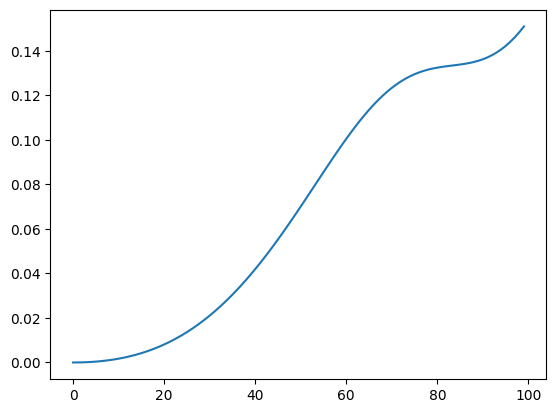

In [ ]:
plt.plot(results[predefined_other_key][21])

In [ ]:
base_prompt

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
    metrics = []
    number_of_prompts_pe = 45
    pe_cos_sim_thres = 0.05

    if ADDITIVE_PERTURBATION:
        predefined_other_metric = "cosine similarity"
    else:
        predefined_other_metric = "cosine similarity"

    temp_metrics = []
    if ADDITIVE_PERTURBATION:
        topN = True
        ret_indices = []
        for i, t in enumerate(data):
            t_origin = t - sae.b_dec
            # metrics.append(cosine_similarity(A_origin, t_origin))
            metrics.append(t_origin.dot(A_origin).abs().item())
            temp_metrics.append(
                cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
            )
            if len(ret_indices) < number_of_prompts_pe and not topN:
                if np.abs(metrics[i]) < pe_cos_sim_thres:
                    ret_indices.append(len(metrics) - 1)
        if topN:
            sorted_indices = np.argsort(metrics)  # [::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = sorted_indices[:number_of_prompts_pe]
    else:
        for t in data:
            t_origin = t - sae.b_dec
            metrics.append(cosine_similarity(A_origin, t_origin))
        sorted_indices = np.argsort(metrics)[::-1]
        sorted_indices = sorted_indices.copy()
        ret_indices = np.concatenate(
            (
                sorted_indices[:5],  # first 5
                sorted_indices[
                    len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                ],  # middle 5
                sorted_indices[-5:],  # last 5
            )
        )
    predefined_other_prompts = batch_of_prompts[
        :number_of_prompts_pe
    ]  # batch_of_prompts[ret_indices]
    chosen_metric = [metrics[i] for i in ret_indices]

    assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 45/45 [00:18<00:00,  2.40it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

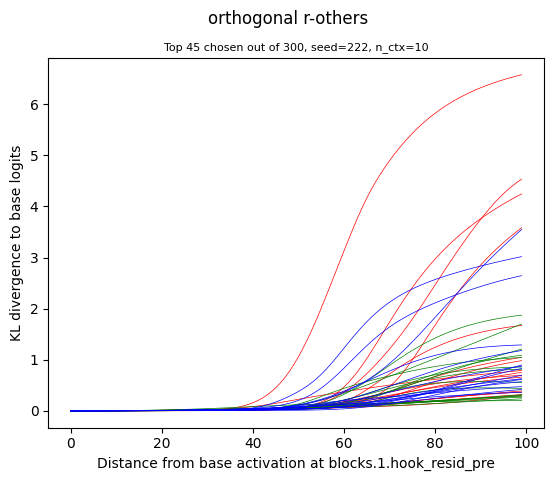

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

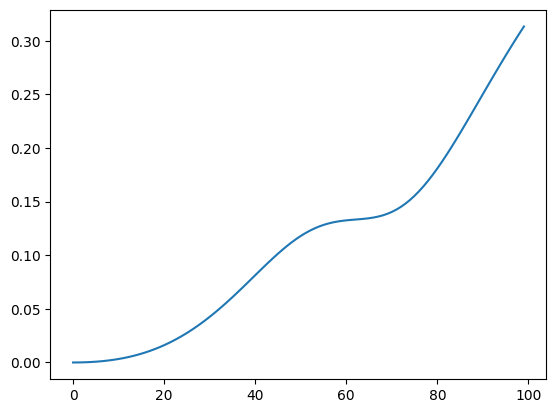

In [ ]:
plt.plot(results[predefined_other_key][21])

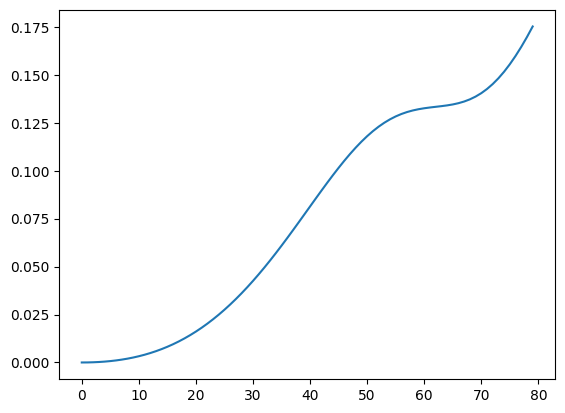

In [ ]:
plt.plot(results[predefined_other_key][21][:80])

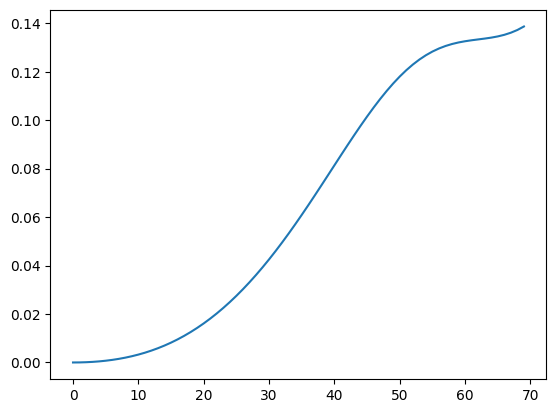

In [ ]:
plt.plot(results[predefined_other_key][21][:70])

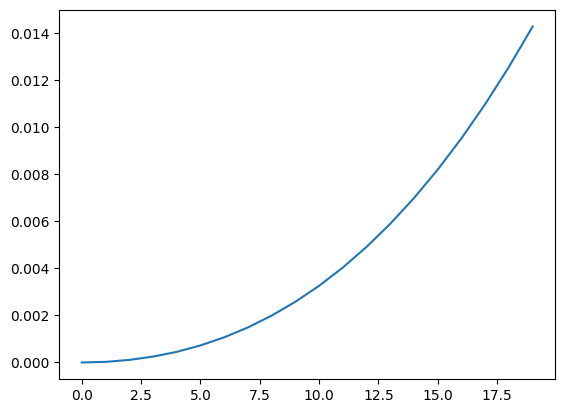

In [ ]:
plt.plot(results[predefined_other_key][21][:20])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        batch_of_prompts = []
        batch_of_prompts.append(torch.Tensor([ 9706,   373, 33922,    13,   554,  3095,    12, 15749,   607,  6853]).long())
        number_of_prompts_pe = 1
    else:
        
        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.27 GB


  7%|▋         | 3/45 [00:16<03:49,  5.47s/it]


KeyboardInterrupt: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

Restarted .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 0.63 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        batch_of_prompts = []
        batch_of_prompts.append(torch.Tensor([ 9706,   373, 33922,    13,   554,  3095,    12, 15749,   607,  6853]).long())
        number_of_prompts_pe = 1
    else:
        
        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

NameError: name 'predefined_other_prompts' is not defined

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(torch.Tensor([ 9706,   373, 33922,    13,   554,  3095,    12, 15749,   607,  6853]).long())
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 1/1 [00:06<00:00,  6.38s/it]


In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

NameError: name 'plot_predefined_other' is not defined

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

NameError: name 'plot_predefined_other' is not defined

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

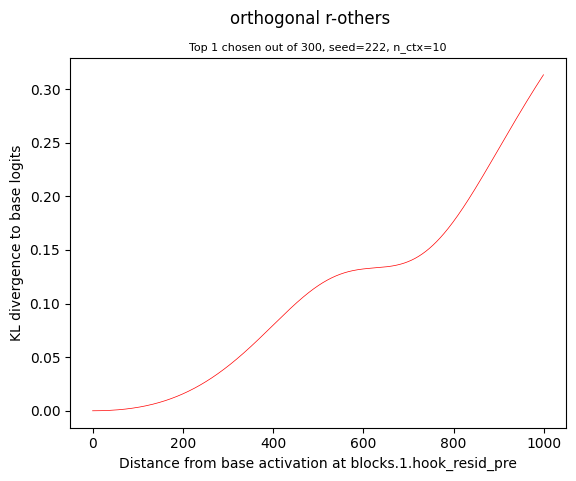

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
plt.plot(results[predefined_other_key][21][:200])

IndexError: list index out of range

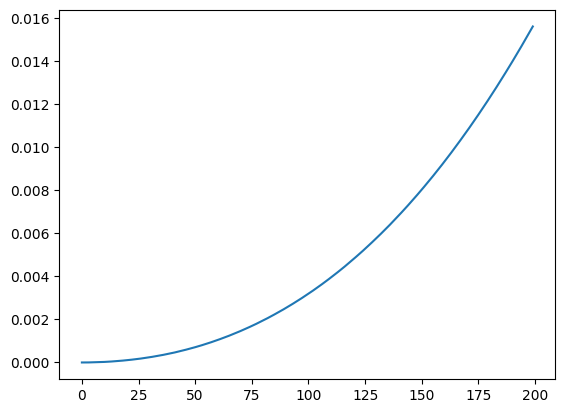

In [ ]:
plt.plot(results[predefined_other_key][0][:200])

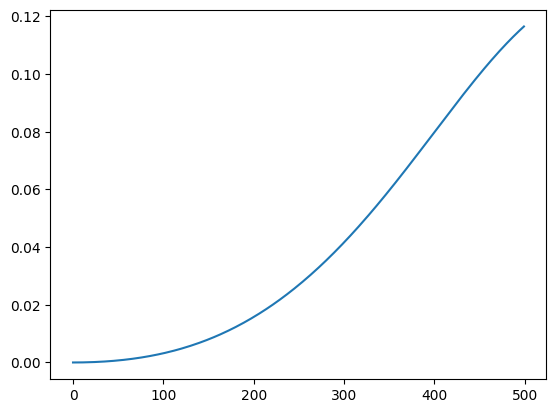

In [ ]:
plt.plot(results[predefined_other_key][0][:500])

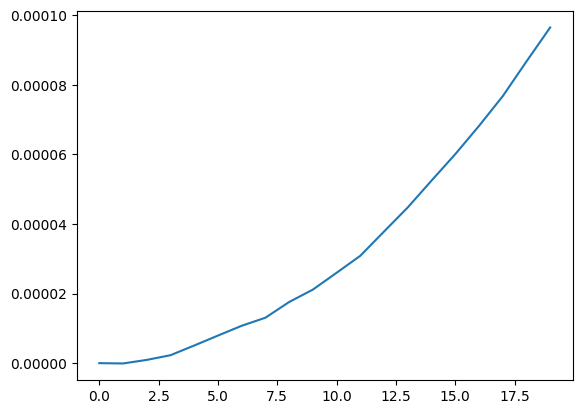

In [ ]:
plt.plot(results[predefined_other_key][0][:20])

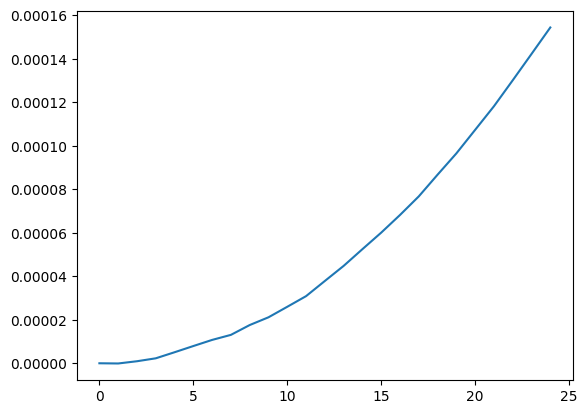

In [ ]:
plt.plot(results[predefined_other_key][0][:25])

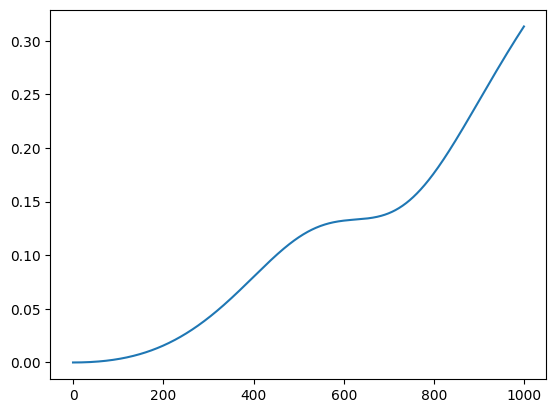

In [ ]:
plt.plot(results[predefined_other_key][0])

In [ ]:
model.to_str_tokens(base_ref.prompt)

['http', '://', 'www', '.', 'then', 'ational', '.', 'ae', '/', 'world']

In [ ]:
model.to_str_tokens(predefined_other_prompts[0])

[' execution',
 ' was',
 ' postponed',
 '.',
 ' In',
 ' mid',
 '-',
 'June',
 ' her',
 ' lawyer']

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = False

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.26 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(torch.Tensor([ 9706,   373, 33922,    13,   554,  3095,    12, 15749,   607,  6853]).long())
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

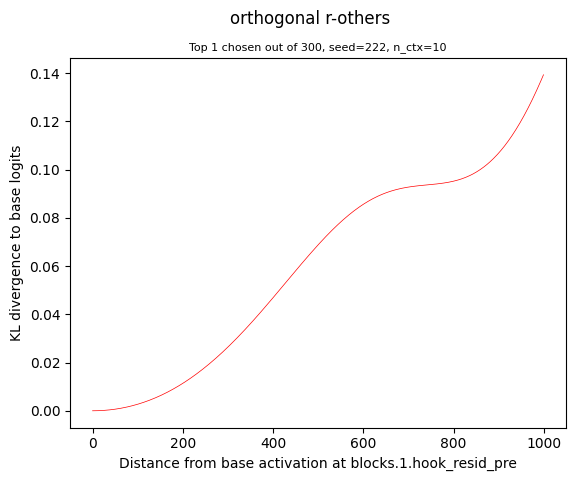

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 222
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[4023, 1378, 2503,   13, 8524,  864,   13, 3609,   14, 6894]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.26 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(torch.Tensor([ 9706,   373, 33922,    13,   554,  3095,    12, 15749,   607,  6853]).long())
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:06<00:00,  6.28s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

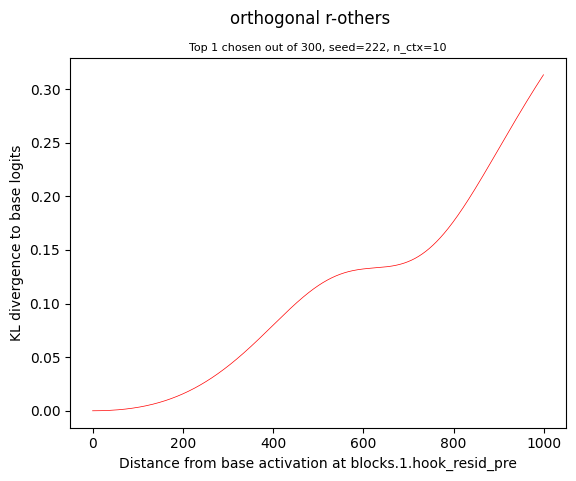

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

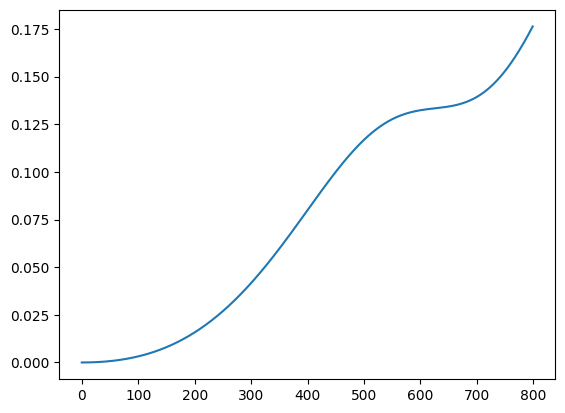

In [ ]:
plt.plot(results[predefined_other_key][0][:800])

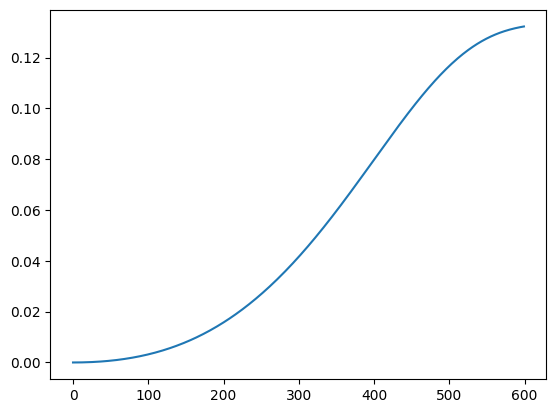

In [ ]:
plt.plot(results[predefined_other_key][0][:600])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.25 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = False
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([9706, 373, 33922, 13, 554, 3095, 12, 15749, 607, 6853]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.25 GB


  4%|▍         | 2/45 [00:12<04:26,  6.19s/it]


KeyboardInterrupt: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 9.57 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = False
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([9706, 373, 33922, 13, 554, 3095, 12, 15749, 607, 6853]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 9.57 GB


100%|██████████| 45/45 [00:08<00:00,  5.09it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

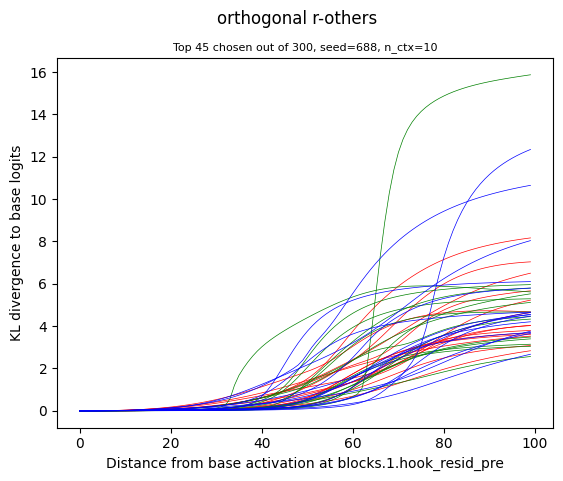

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
for i in range(45):
    print(f"{i} {results[predefined_other_key][i][40]}")

0 0.7178851962089539
1 0.4693509340286255
2 0.16965551674365997
3 0.3653588593006134
4 0.13604003190994263
5 0.352477103471756
6 0.8458060026168823
7 0.6287566423416138
8 0.1124347373843193
9 1.1332499980926514
10 0.14329266548156738
11 0.22846107184886932
12 0.6124265193939209
13 0.2003422975540161
14 0.6129656434059143
15 0.6233175992965698
16 0.06460998952388763
17 0.14437557756900787
18 0.17417480051517487
19 0.11839503794908524
20 0.1273852437734604
21 0.4173498749732971
22 0.09907244890928268
23 0.5002475380897522
24 0.061590466648340225
25 0.5984759330749512
26 0.26867806911468506
27 0.14164385199546814
28 0.04998041316866875
29 3.01759672164917
30 0.32471764087677
31 1.1739964485168457
32 1.2487034797668457
33 0.10658939927816391
34 0.05915382131934166
35 0.0977412536740303
36 0.7384678721427917
37 0.344316303730011
38 0.1577274054288864
39 0.6787534356117249
40 0.5017540454864502
41 0.034200046211481094
42 0.0912707969546318
43 0.31583184003829956
44 0.1048436239361763


In [ ]:
z =  []
for i in range(45):
    z.append(results[predefined_other_key][i][40])

In [ ]:
z_s = np.argsort(z)

In [ ]:
z_s

array([41, 28, 34, 24, 16, 42, 35, 22, 44, 33,  8, 19, 20,  4, 27, 10, 17,
       38,  2, 18, 13, 11, 26, 43, 30, 37,  5,  3, 21,  1, 23, 40, 25, 12,
       14, 15,  7, 39,  0, 36,  6,  9, 31, 32, 29])

In [ ]:
z[41]

tensor(0.0342)

In [ ]:
z[29]

tensor(3.0176)

In [ ]:
z[32]

tensor(1.2487)

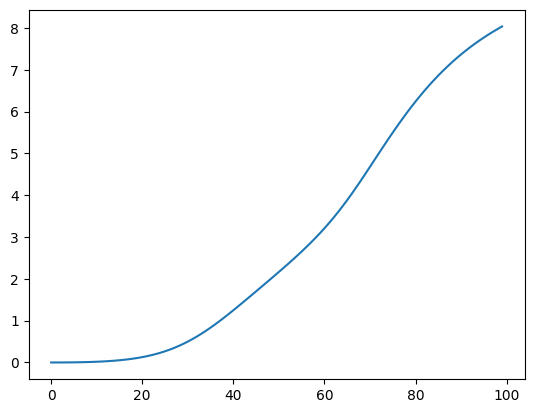

In [ ]:
plt.plot(results[predefined_other_key][32])

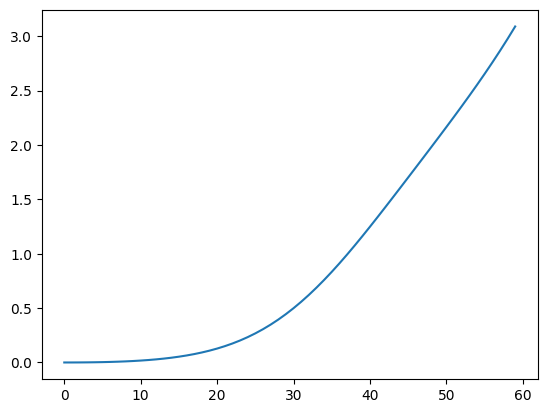

In [ ]:
plt.plot(results[predefined_other_key][32][:60])

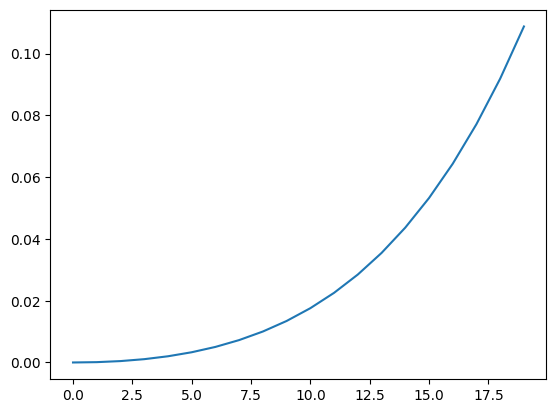

In [ ]:
plt.plot(results[predefined_other_key][32][:20])

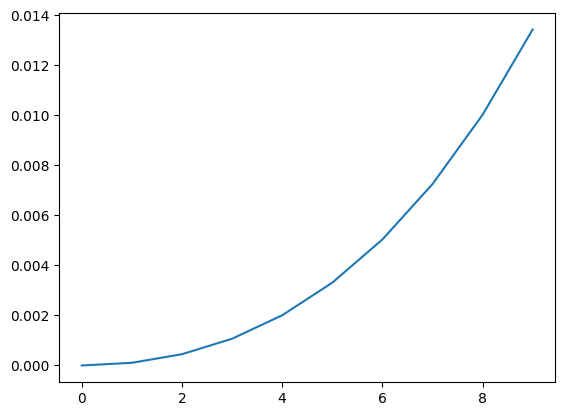

In [ ]:
plt.plot(results[predefined_other_key][32][:10])

In [ ]:
model.to_str_tokens(base_ref.prompt)

[' her',
 ' as',
 ' the',
 ' kid',
 ' about',
 ' whom',
 ' parents',
 ' complain',
 ' with',
 ' barely']

In [ ]:
model.to_str_tokens(predefined_other_prompts[32])

[' Weinstein',
 ' of',
 ' being',
 ' a',
 ' demon',
 ' but',
 ' is',
 ' is',
 ' your',
 ' imp']

In [ ]:
poi_id = 32

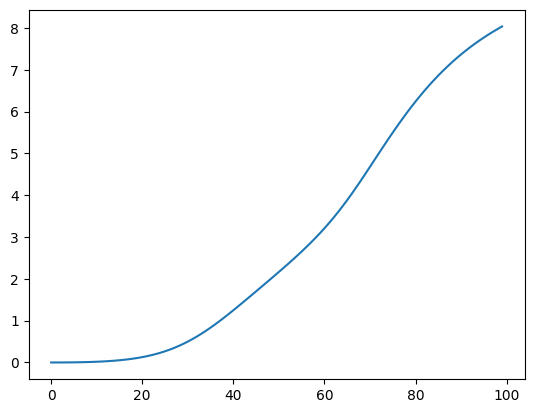

In [ ]:
plt.plot(results[predefined_other_key][poi_id])

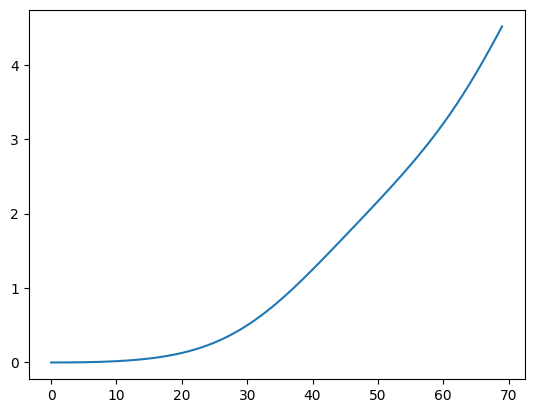

In [ ]:
plt.plot(results[predefined_other_key][poi_id][:70])

In [ ]:
predefined_other_prompts[poi_id]

tensor([22473,   286,   852,   257,  3222,   475,   318,   318,   534,   848])

In [ ]:
base_ref.prompt

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])

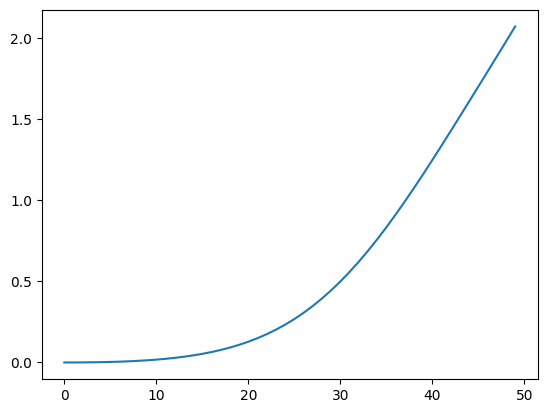

In [ ]:
plt.plot(results[predefined_other_key][poi_id][:50])

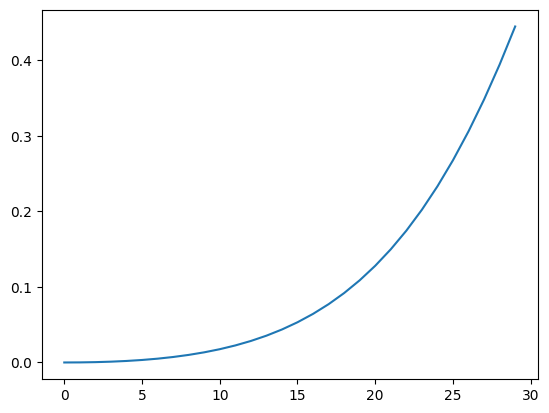

In [ ]:
plt.plot(results[predefined_other_key][poi_id][:30])

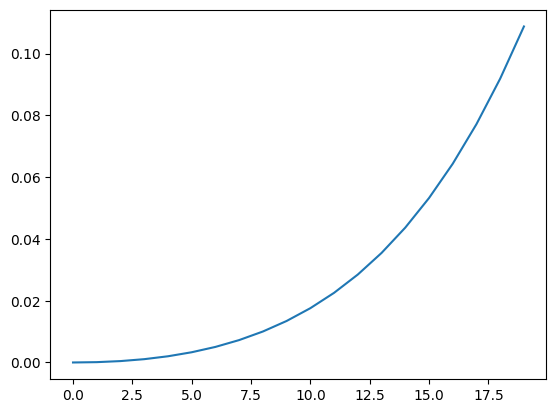

In [ ]:
plt.plot(results[predefined_other_key][poi_id][:20])

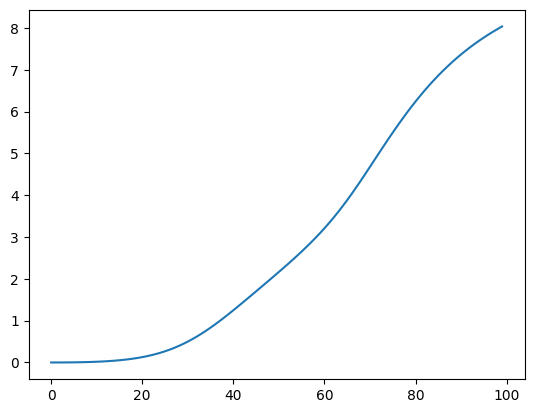

In [ ]:
plt.plot(results[predefined_other_key][poi_id])

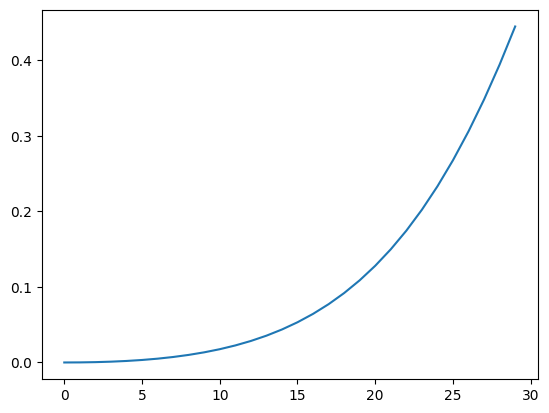

In [ ]:
plt.plot(results[predefined_other_key][poi_id][:30])

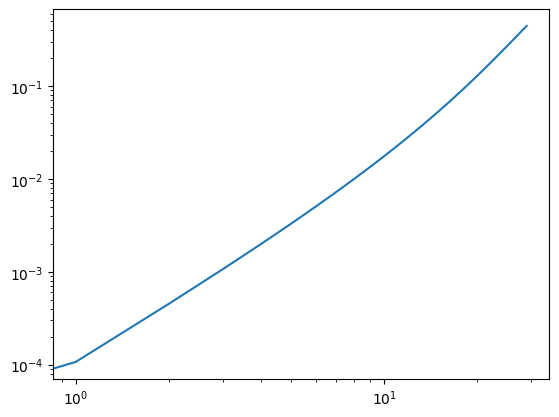

In [ ]:
plt.loglog(results[predefined_other_key][poi_id][:30])

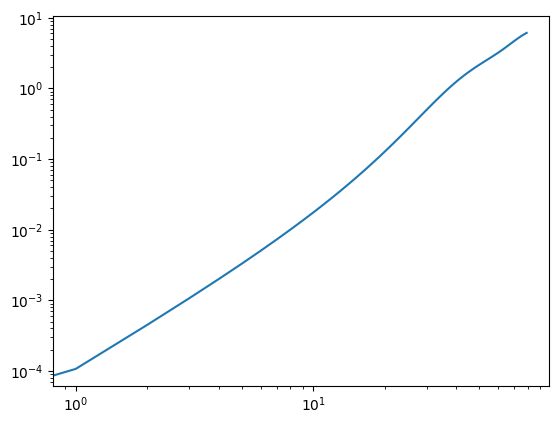

In [ ]:
plt.loglog(results[predefined_other_key][poi_id][:80])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 10.21 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 10.21 GB


  0%|          | 0/1 [00:00<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 118.00 MiB. GPU 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

Restarted .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = True
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 0.63 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[
            :number_of_prompts_pe
        ]  # batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 1/1 [00:06<00:00,  6.57s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

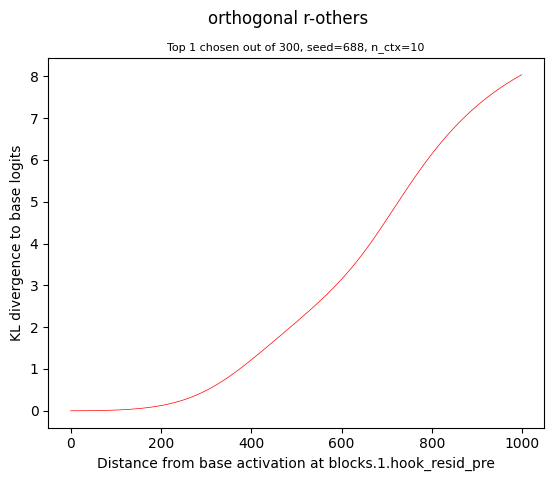

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

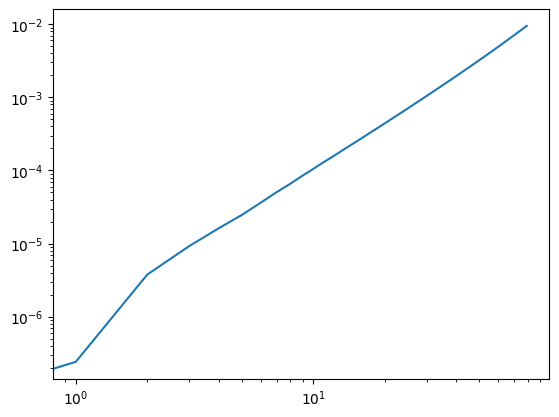

In [ ]:
plt.loglog(results[predefined_other_key][0][:80])

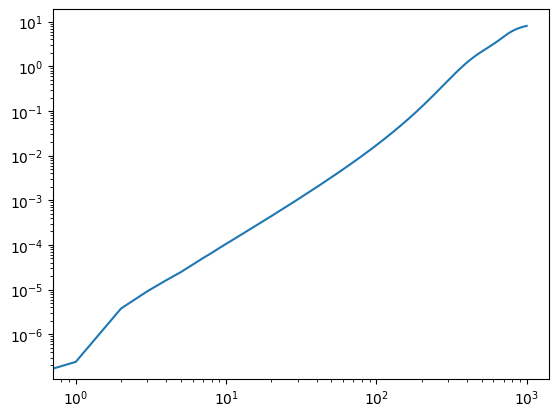

In [ ]:
plt.loglog(results[predefined_other_key][0][:-1])

/home/paperspace/teren/.venv/lib/python3.10/site-packages/IPython/core/events.py:82: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  func(*args, **kwargs)


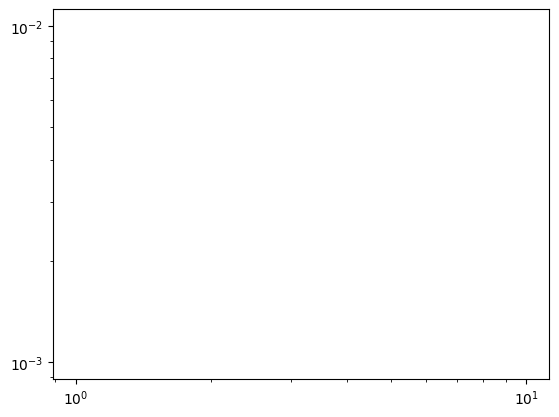

In [ ]:
plt.loglog(results[predefined_other_key][0][70])

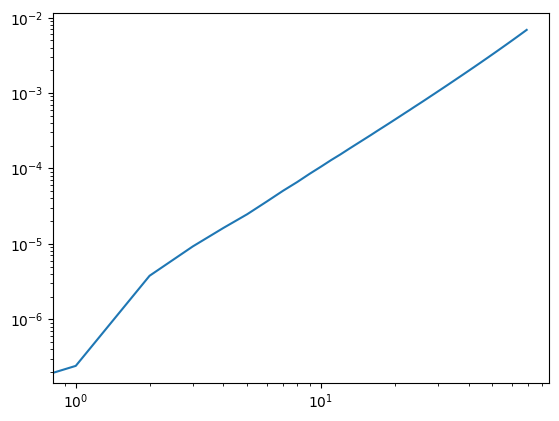

In [ ]:
plt.loglog(results[predefined_other_key][0][:70])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.26 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:06<00:00,  6.11s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

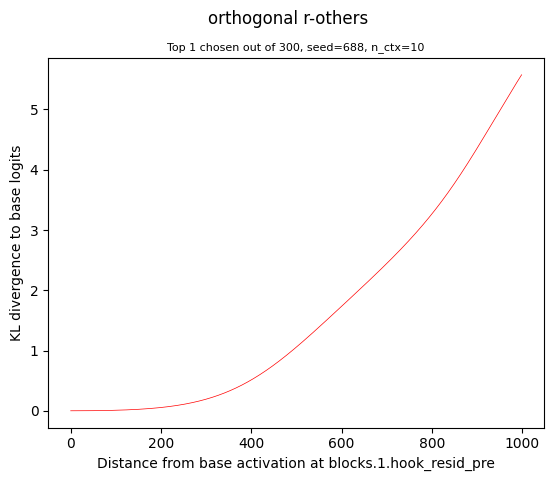

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

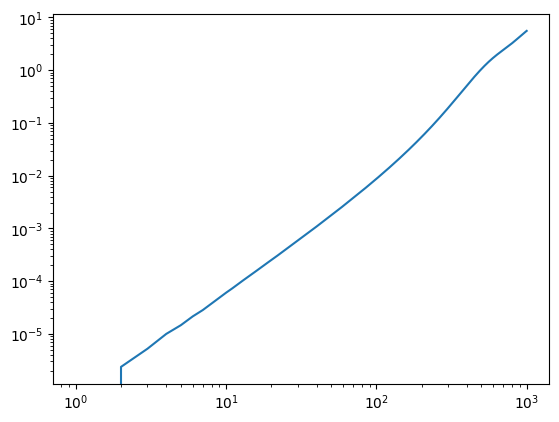

In [ ]:
plt.loglog(results[predefined_other_key][0])

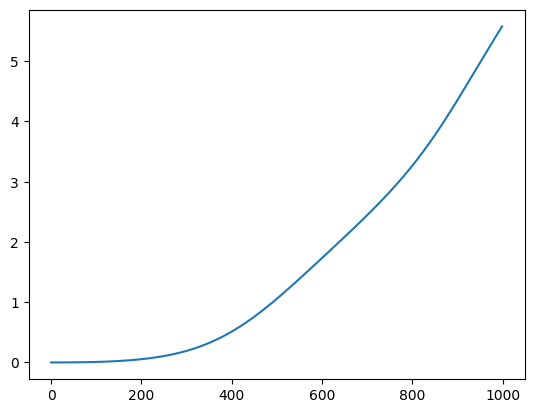

In [ ]:
plt.plot(results[predefined_other_key][0])

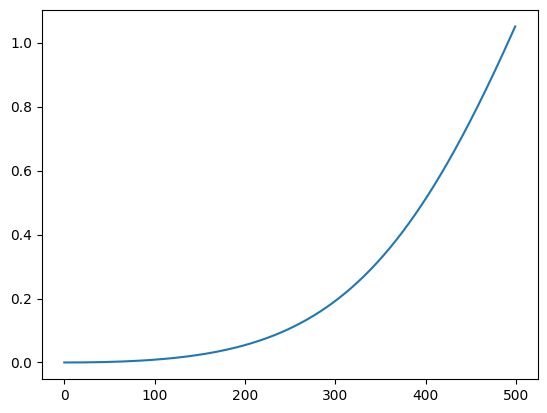

In [ ]:
plt.plot(results[predefined_other_key][0][:500])

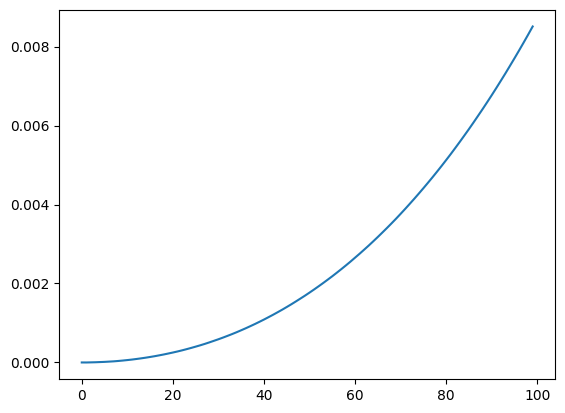

In [ ]:
plt.plot(results[predefined_other_key][0][:100])

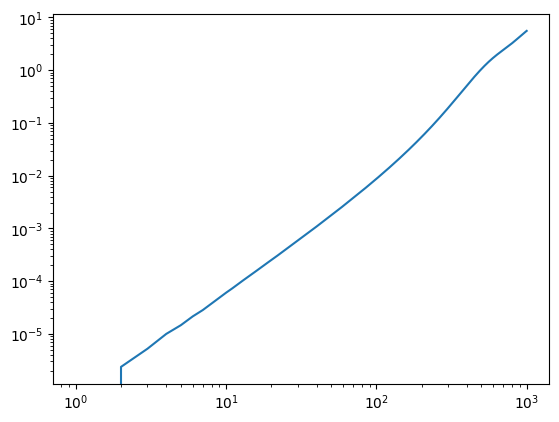

In [ ]:
plt.loglog(results[predefined_other_key][0])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 10/10 [00:33<00:00,  3.30s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

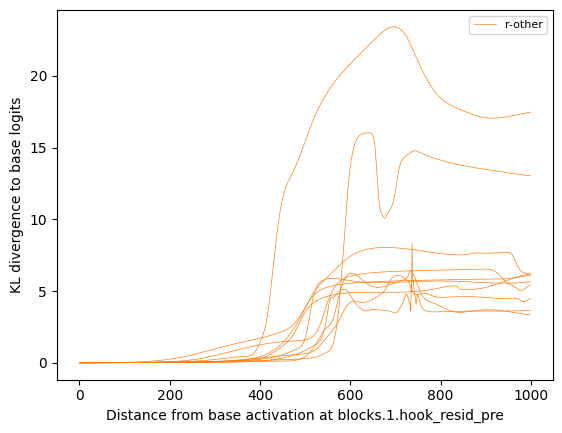

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.88 GB


100%|██████████| 10/10 [00:06<00:00,  1.52it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

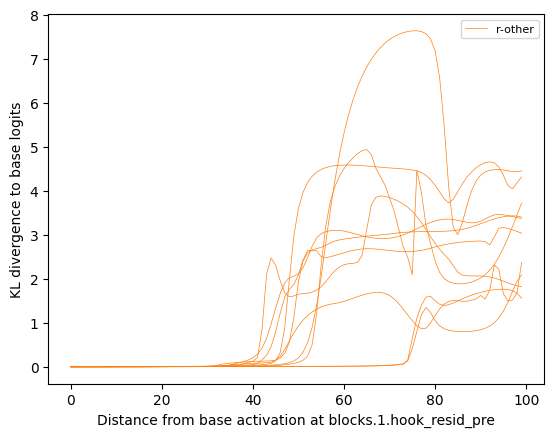

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
for i in range(10):
    results[r_other_key][i][70]

In [ ]:
for i in range(10):
    print(results[r_other_key][i][70])

tensor(4.5189)
tensor(1.6219)
tensor(7.4363)
tensor(2.6428)
tensor(3.0176)
tensor(3.8454)
tensor(0.0357)
tensor(0.0308)
tensor(2.9220)
tensor(3.8430)


In [ ]:
results[r_other_key][2]

tensor([-9.2248e-08,  7.6317e-06,  2.5410e-05,  5.4951e-05,  9.5882e-05,
         1.4779e-04,  2.0907e-04,  2.8137e-04,  3.6251e-04,  4.5172e-04,
         5.4781e-04,  6.5155e-04,  7.6471e-04,  8.8334e-04,  1.0097e-03,
         1.1433e-03,  1.2869e-03,  1.4400e-03,  1.6034e-03,  1.7818e-03,
         1.9717e-03,  2.1773e-03,  2.4035e-03,  2.6484e-03,  2.9157e-03,
         3.2083e-03,  3.5305e-03,  3.8881e-03,  4.2873e-03,  4.7353e-03,
         5.2398e-03,  5.8127e-03,  6.4710e-03,  7.2298e-03,  8.1191e-03,
         9.1713e-03,  1.0428e-02,  1.1939e-02,  1.3772e-02,  1.6000e-02,
         1.8713e-02,  2.2013e-02,  2.6028e-02,  3.0933e-02,  3.7019e-02,
         4.4804e-02,  5.5289e-02,  7.0415e-02,  9.3991e-02,  1.3345e-01,
         2.0301e-01,  3.2806e-01,  5.4544e-01,  8.9171e-01,  1.3939e+00,
         2.0577e+00,  2.8157e+00,  3.5611e+00,  4.2326e+00,  4.8143e+00,
         5.3089e+00,  5.7249e+00,  6.0733e+00,  6.3648e+00,  6.6091e+00,
         6.8143e+00,  6.9867e+00,  7.1316e+00,  7.2

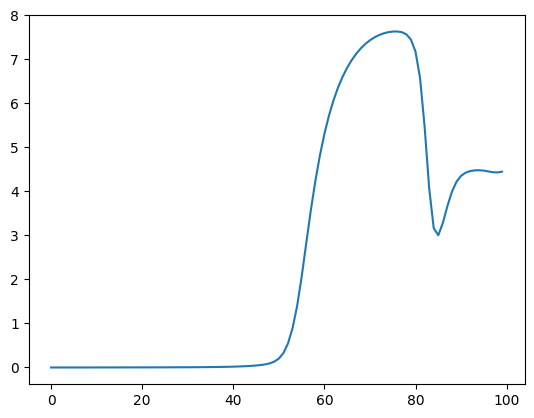

In [ ]:
plt.plot(results[r_other_key][2])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.88 GB


100%|██████████| 10/10 [00:06<00:00,  1.46it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

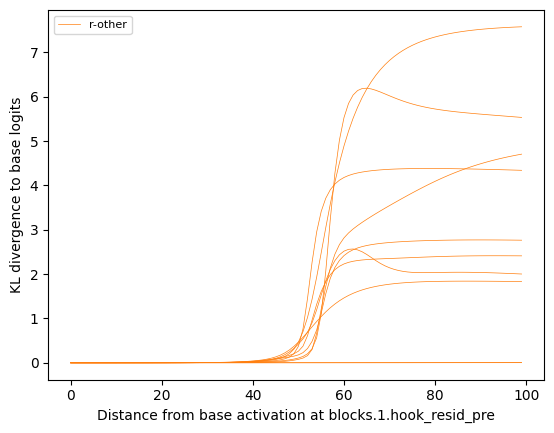

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

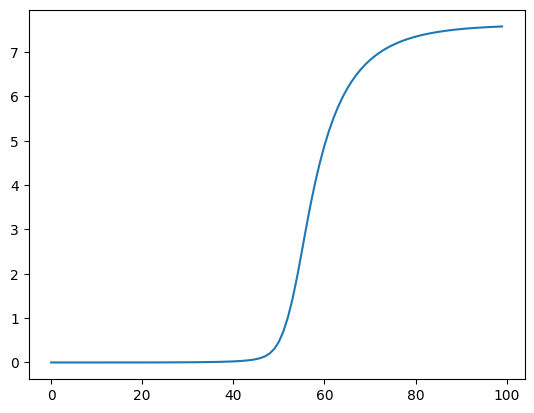

In [ ]:
plt.plot(results[r_other_key][2])

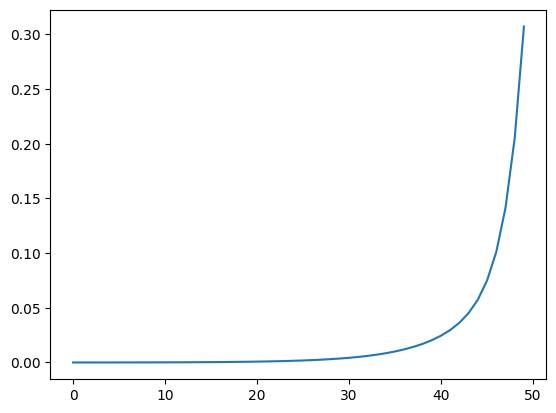

In [ ]:
plt.plot(results[r_other_key][2][:50])

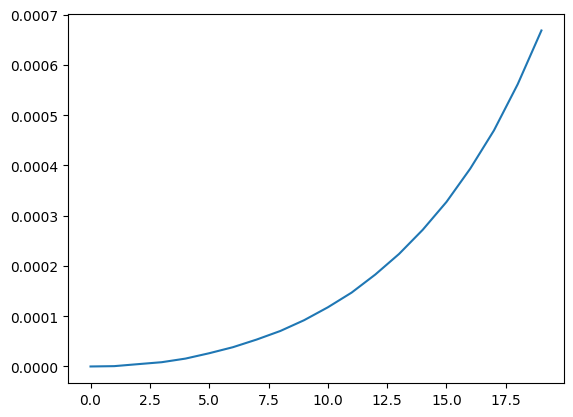

In [ ]:
plt.plot(results[r_other_key][2][:20])

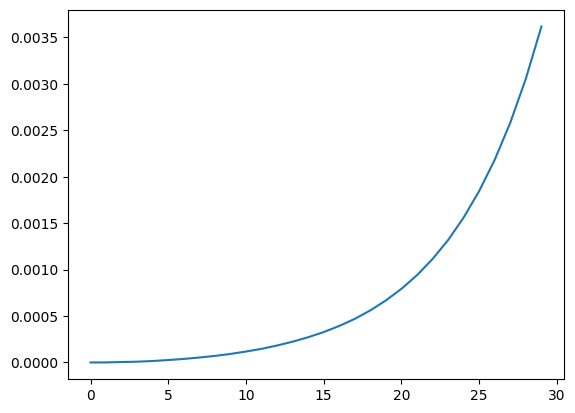

In [ ]:
plt.plot(results[r_other_key][2][:30])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.88 GB


100%|██████████| 3/3 [00:07<00:00,  2.62s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

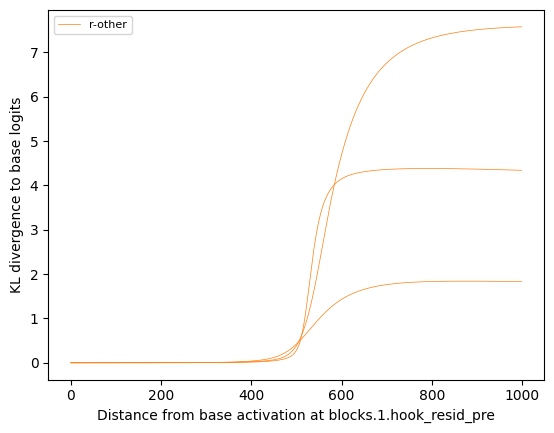

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

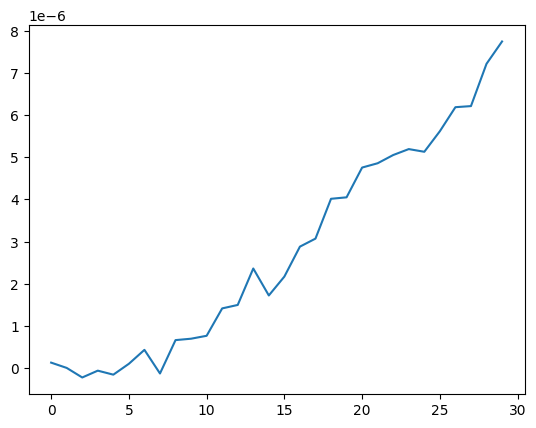

In [ ]:
plt.plot(results[r_other_key][2][:30])

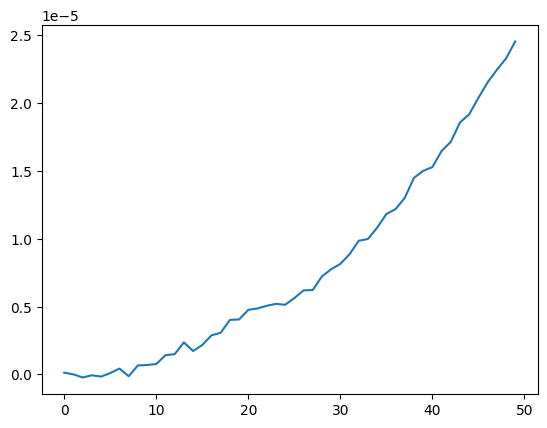

In [ ]:
plt.plot(results[r_other_key][2][:50])

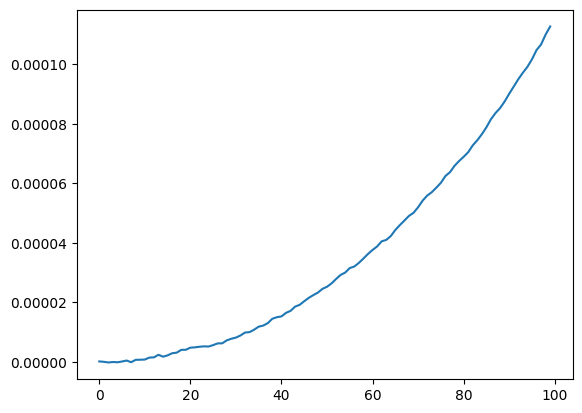

In [ ]:
plt.plot(results[r_other_key][2][:100])

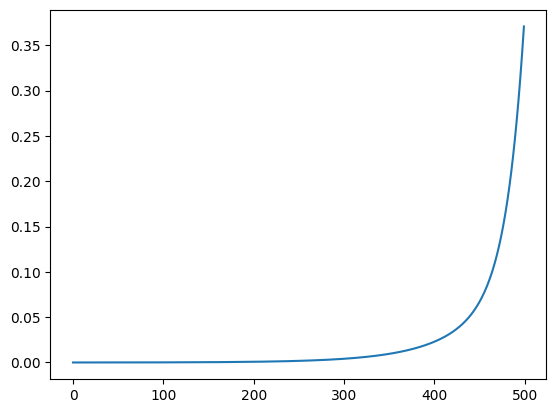

In [ ]:
plt.plot(results[r_other_key][2][:500])

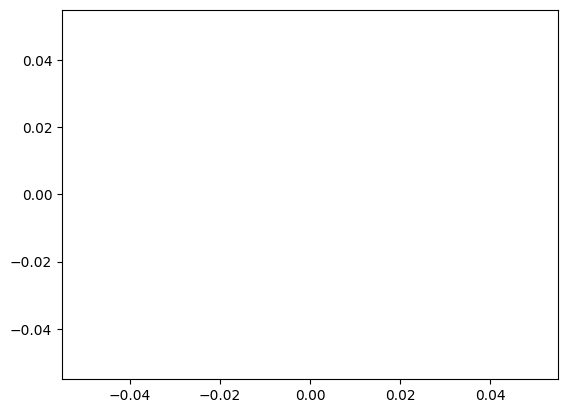

In [ ]:
plt.plot(results[r_other_key][2][:0])

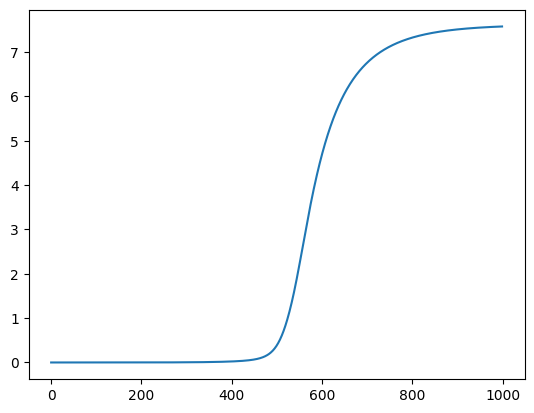

In [ ]:
plt.plot(results[r_other_key][2])

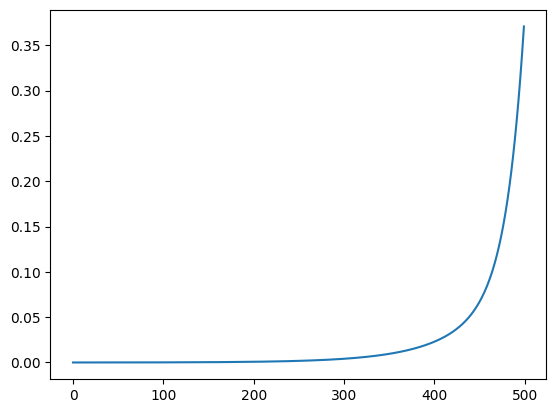

In [ ]:
plt.plot(results[r_other_key][2][:500])

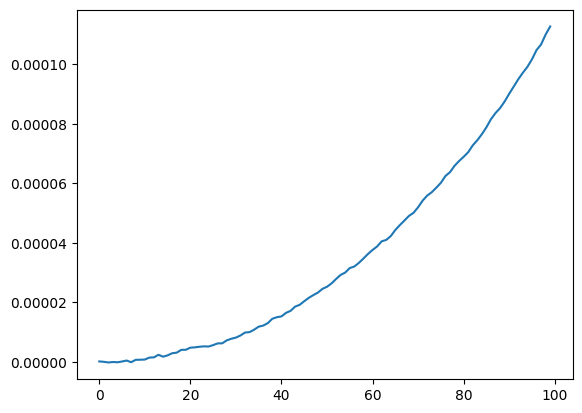

In [ ]:
plt.plot(results[r_other_key][2][:100])

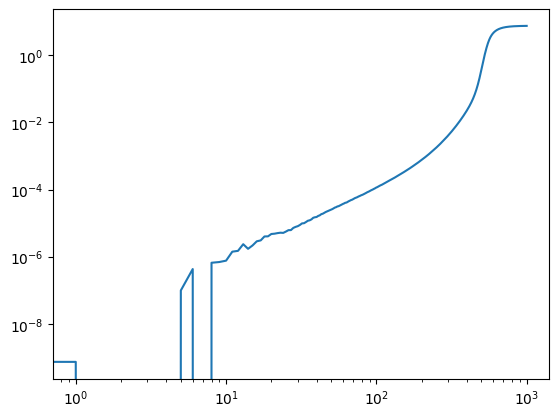

In [ ]:
plt.loglog(results[r_other_key][2])

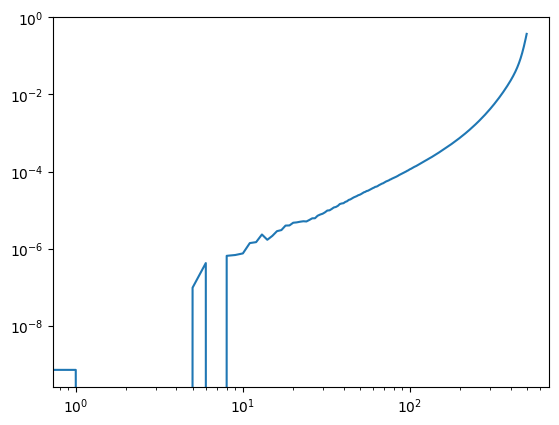

In [ ]:
plt.loglog(results[r_other_key][2][:500])

In [ ]:
plt.loglog(results[r_other_key][3][:500])

IndexError: list index out of range

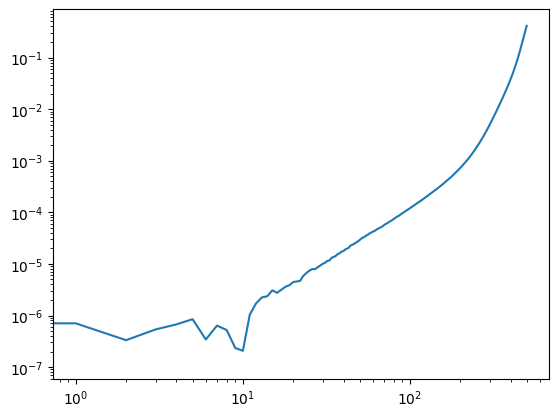

In [ ]:
plt.loglog(results[r_other_key][1][:500])

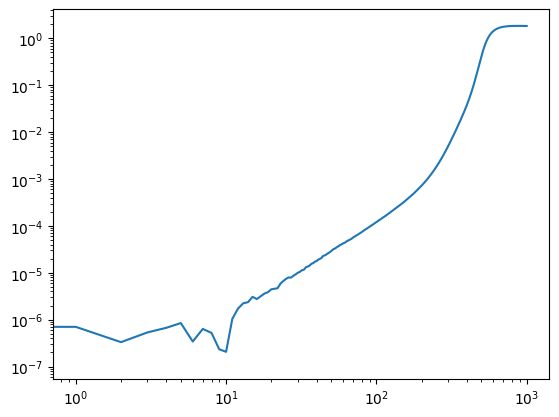

In [ ]:
plt.loglog(results[r_other_key][1])

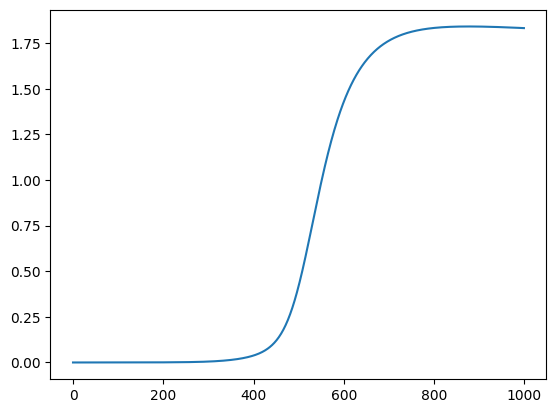

In [ ]:
plt.plot(results[r_other_key][1])

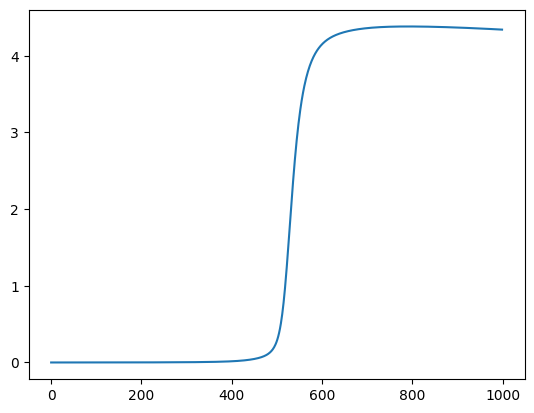

In [ ]:
plt.plot(results[r_other_key][0])

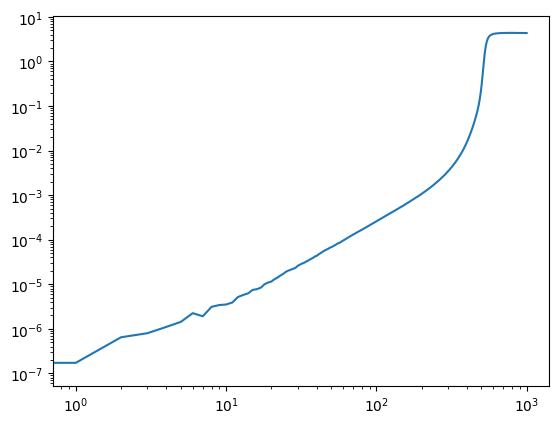

In [ ]:
plt.loglog(results[r_other_key][0])

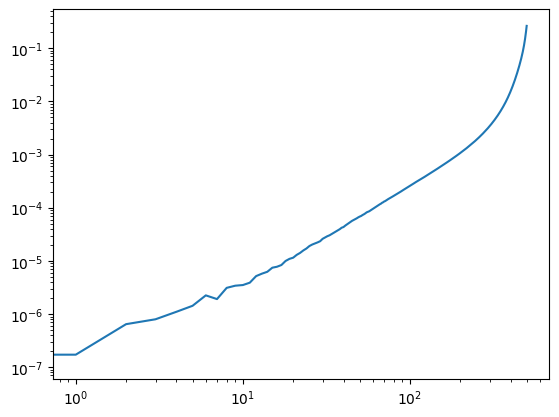

In [ ]:
plt.loglog(results[r_other_key][0][:500])

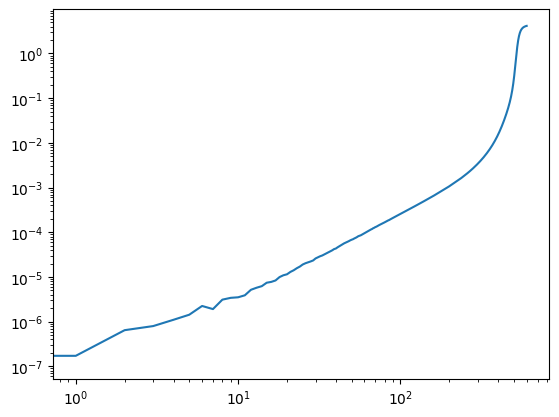

In [ ]:
plt.loglog(results[r_other_key][0][:600])

Connected to .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 3/3 [00:02<00:00,  1.06it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

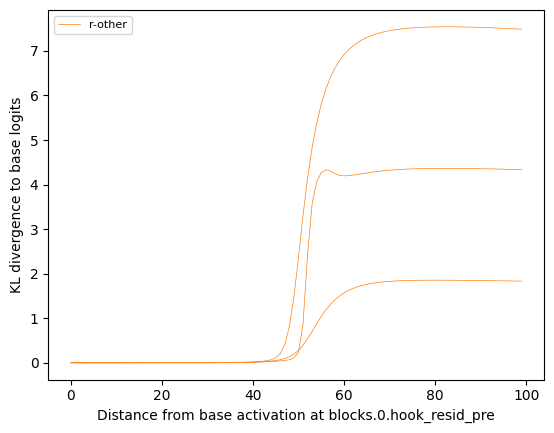

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 10/10 [00:10<00:00,  1.04s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

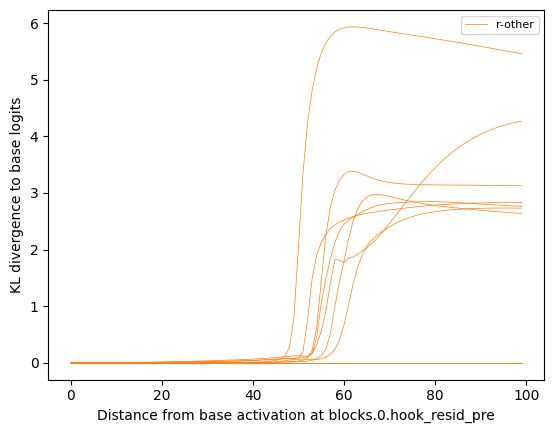

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
results[r_other_key][0][60]

tensor(2.5229)

In [ ]:
results[r_other_key][1][60]


tensor(0.6673)

In [ ]:
results[r_other_key][3][60]


tensor(5.0383e-08)

In [ ]:
results[r_other_key][4][60]


tensor(5.0383e-08)

In [ ]:
results[r_other_key][5][60]


tensor(1.7932)

In [ ]:
results[r_other_key][6][60]


tensor(5.9187)

In [ ]:
poi_id = 6

In [ ]:
for i in range(100):
    results[r_other_key][poi_id][i]


In [ ]:
for i in range(100):
    print(i,results[r_other_key][poi_id][i])


0 tensor(5.0383e-08)
1 tensor(3.6082e-06)
2 tensor(1.1042e-05)
3 tensor(2.5560e-05)
4 tensor(4.5852e-05)
5 tensor(7.1544e-05)
6 tensor(0.0001)
7 tensor(0.0001)
8 tensor(0.0002)
9 tensor(0.0002)
10 tensor(0.0003)
11 tensor(0.0003)
12 tensor(0.0004)
13 tensor(0.0005)
14 tensor(0.0005)
15 tensor(0.0006)
16 tensor(0.0007)
17 tensor(0.0008)
18 tensor(0.0009)
19 tensor(0.0010)
20 tensor(0.0011)
21 tensor(0.0012)
22 tensor(0.0013)
23 tensor(0.0014)
24 tensor(0.0015)
25 tensor(0.0017)
26 tensor(0.0018)
27 tensor(0.0020)
28 tensor(0.0021)
29 tensor(0.0023)
30 tensor(0.0025)
31 tensor(0.0027)
32 tensor(0.0029)
33 tensor(0.0032)
34 tensor(0.0035)
35 tensor(0.0038)
36 tensor(0.0043)
37 tensor(0.0049)
38 tensor(0.0057)
39 tensor(0.0069)
40 tensor(0.0087)
41 tensor(0.0112)
42 tensor(0.0151)
43 tensor(0.0209)
44 tensor(0.0300)
45 tensor(0.0445)
46 tensor(0.0697)
47 tensor(0.1212)
48 tensor(0.2665)
49 tensor(0.7857)
50 tensor(2.0328)
51 tensor(3.3436)
52 tensor(4.2321)
53 tensor(4.8098)
54 tensor(5.20

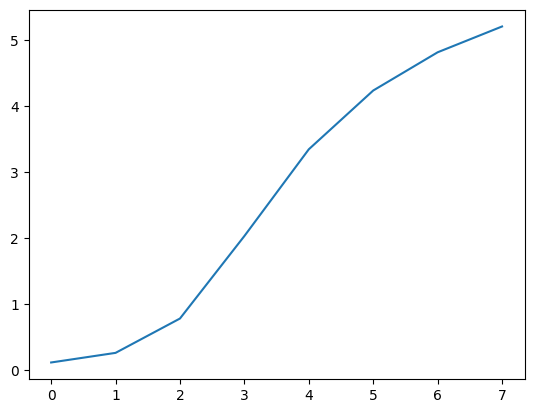

In [ ]:
plt.plot(results[r_other_key][poi_id][47:55])

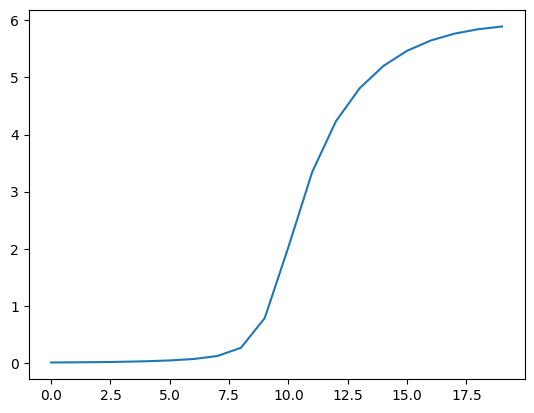

In [ ]:
plt.plot(results[r_other_key][poi_id][40:60])

In [ ]:
results[r_other_key][poi_id]

tensor([5.0383e-08, 3.6082e-06, 1.1042e-05, 2.5560e-05, 4.5852e-05, 7.1544e-05,
        1.0187e-04, 1.3854e-04, 1.8033e-04, 2.2643e-04, 2.7781e-04, 3.3482e-04,
        3.9548e-04, 4.6192e-04, 5.3227e-04, 6.0908e-04, 6.9004e-04, 7.7740e-04,
        8.6665e-04, 9.6340e-04, 1.0640e-03, 1.1719e-03, 1.2861e-03, 1.4059e-03,
        1.5323e-03, 1.6664e-03, 1.8109e-03, 1.9642e-03, 2.1270e-03, 2.3025e-03,
        2.4919e-03, 2.6971e-03, 2.9234e-03, 3.1776e-03, 3.4717e-03, 3.8279e-03,
        4.2807e-03, 4.8849e-03, 5.7231e-03, 6.9216e-03, 8.6710e-03, 1.1248e-02,
        1.5096e-02, 2.0927e-02, 2.9967e-02, 4.4517e-02, 6.9668e-02, 1.2124e-01,
        2.6647e-01, 7.8572e-01, 2.0328e+00, 3.3436e+00, 4.2321e+00, 4.8098e+00,
        5.2000e+00, 5.4665e+00, 5.6465e+00, 5.7660e+00, 5.8434e+00, 5.8913e+00,
        5.9187e+00, 5.9317e+00, 5.9350e+00, 5.9316e+00, 5.9239e+00, 5.9135e+00,
        5.9015e+00, 5.8887e+00, 5.8756e+00, 5.8624e+00, 5.8493e+00, 5.8364e+00,
        5.8237e+00, 5.8112e+00, 5.7988e+

In [ ]:
np.array(results[r_other_key][poi_id])

array([5.03827806e-08, 3.60818376e-06, 1.10423716e-05, 2.55603809e-05,
       4.58518189e-05, 7.15440256e-05, 1.01872138e-04, 1.38543721e-04,
       1.80326577e-04, 2.26427743e-04, 2.77812243e-04, 3.34816228e-04,
       3.95479961e-04, 4.61921212e-04, 5.32268896e-04, 6.09082868e-04,
       6.90040062e-04, 7.77396606e-04, 8.66652583e-04, 9.63396276e-04,
       1.06396980e-03, 1.17192976e-03, 1.28607033e-03, 1.40590826e-03,
       1.53233646e-03, 1.66638673e-03, 1.81085384e-03, 1.96415326e-03,
       2.12698849e-03, 2.30252929e-03, 2.49185902e-03, 2.69710156e-03,
       2.92337546e-03, 3.17763374e-03, 3.47171002e-03, 3.82792321e-03,
       4.28071246e-03, 4.88494989e-03, 5.72306523e-03, 6.92158751e-03,
       8.67100433e-03, 1.12479199e-02, 1.50961615e-02, 2.09274739e-02,
       2.99670435e-02, 4.45166752e-02, 6.96678981e-02, 1.21243343e-01,
       2.66471148e-01, 7.85718024e-01, 2.03279543e+00, 3.34361935e+00,
       4.23213196e+00, 4.80984974e+00, 5.20004511e+00, 5.46647120e+00,
      

In [ ]:
arr = np.array(results[r_other_key][poi_id])

In [ ]:
dy = np.diff(arr)

In [ ]:
dx = 1

In [ ]:
slopes  = dy/dx

In [ ]:
print(slopes)

[ 3.55780094e-06  7.43418786e-06  1.45180093e-05  2.02914380e-05
  2.56922067e-05  3.03281122e-05  3.66715831e-05  4.17828560e-05
  4.61011659e-05  5.13845007e-05  5.70039847e-05  6.06637332e-05
  6.64412510e-05  7.03476835e-05  7.68139726e-05  8.09571939e-05
  8.73565441e-05  8.92559765e-05  9.67436936e-05  1.00573525e-04
  1.07959961e-04  1.14140566e-04  1.19837932e-04  1.26428204e-04
  1.34050264e-04  1.44467107e-04  1.53299421e-04  1.62835233e-04
  1.75540801e-04  1.89329730e-04  2.05242541e-04  2.26273900e-04
  2.54258281e-04  2.94076279e-04  3.56213190e-04  4.52789245e-04
  6.04237430e-04  8.38115346e-04  1.19852228e-03  1.74941681e-03
  2.57691555e-03  3.84824164e-03  5.83131239e-03  9.03956965e-03
  1.45496316e-02  2.51512229e-02  5.15754446e-02  1.45227805e-01
  5.19246876e-01  1.24707747e+00  1.31082392e+00  8.88512611e-01
  5.77717781e-01  3.90195370e-01  2.66426086e-01  1.80024147e-01
  1.19536400e-01  7.73682594e-02  4.79016304e-02  2.73990631e-02
  1.30391121e-02  3.23009

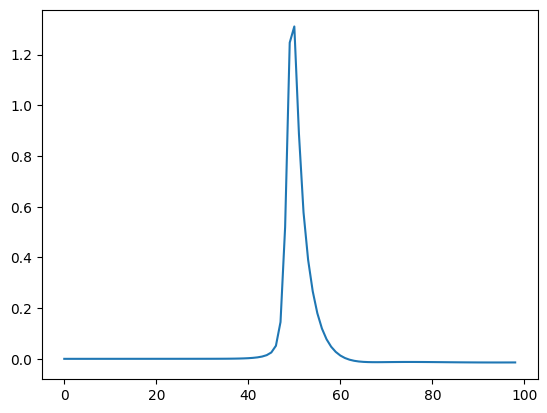

In [ ]:
plt.plot(slopes)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.27 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 10
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

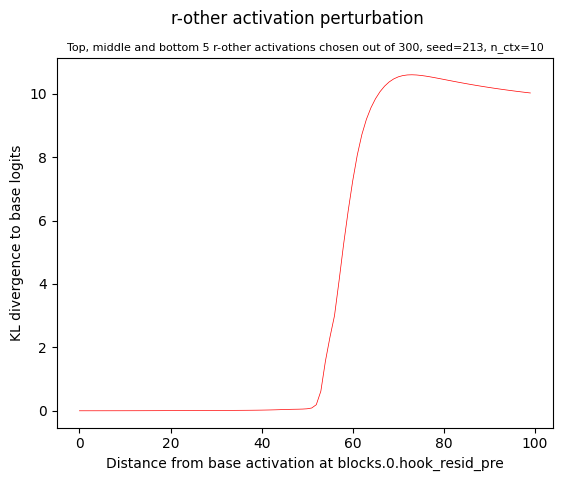

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

KeyboardInterrupt: 

In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

: 

In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

: 

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

: 

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

: 

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

: 

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

: 

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

: 

In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

: 

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

: 

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

: 

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

: 

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

: 

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

: 

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

: 

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

: 

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.28 GB


100%|██████████| 3/3 [00:20<00:00,  6.74s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

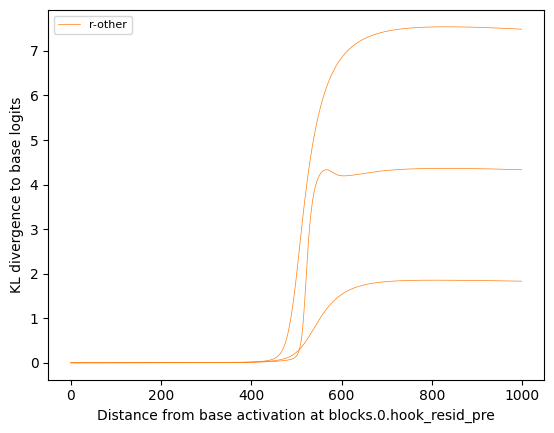

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

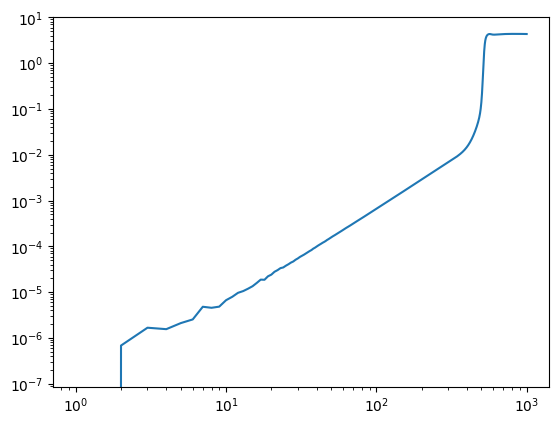

In [ ]:
plt.loglog(results[r_other_key][0])

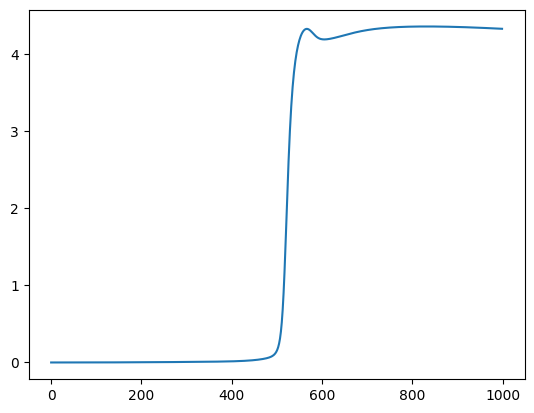

In [ ]:
plt.plot(results[r_other_key][0])

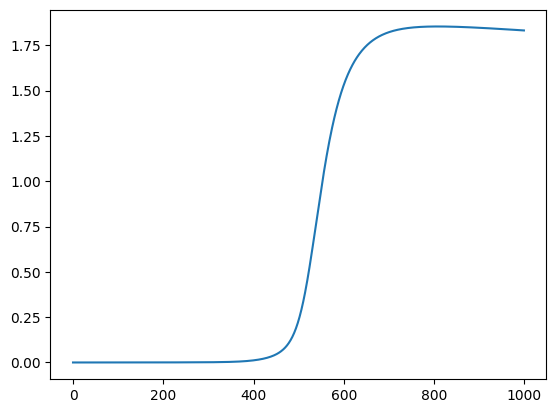

In [ ]:
plt.plot(results[r_other_key][1])

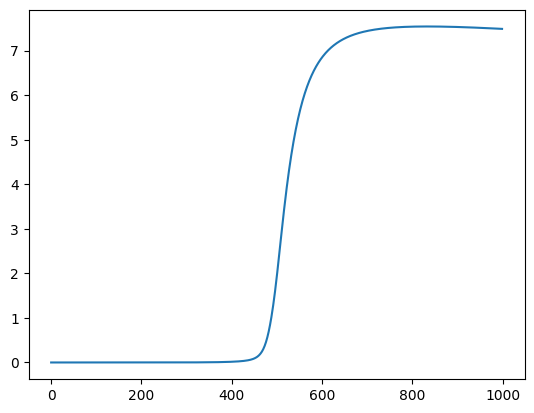

In [ ]:
plt.plot(results[r_other_key][2])

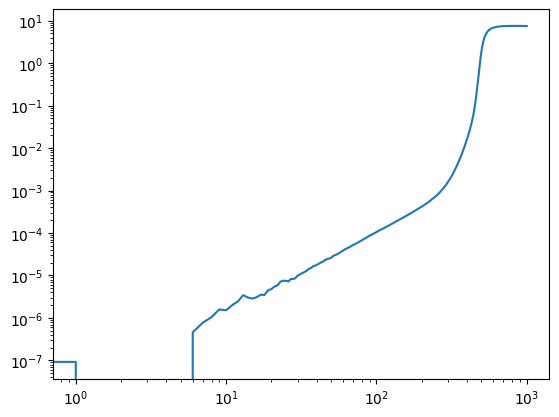

In [ ]:
plt.loglog(results[r_other_key][2])

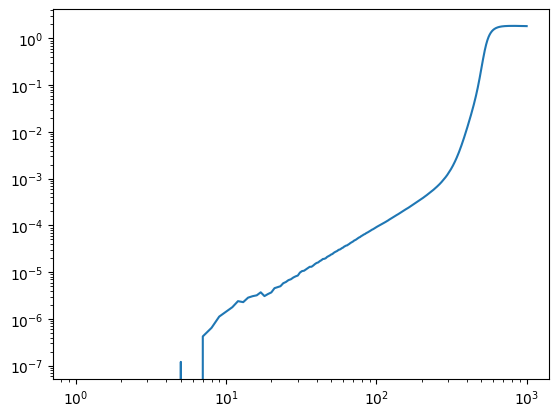

In [ ]:
plt.loglog(results[r_other_key][1])

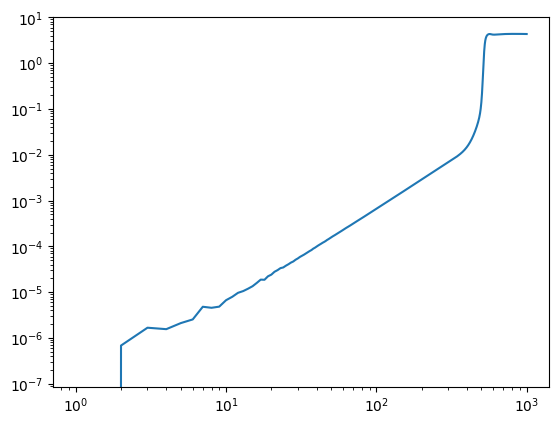

In [ ]:
plt.loglog(results[r_other_key][0])

In [ ]:
def plot_slopes(res):
    arr = np.array(res)
    dy = np.diff(arr)
    dx = 1
    slopes = dy/dx
    plt.plot(slopes)

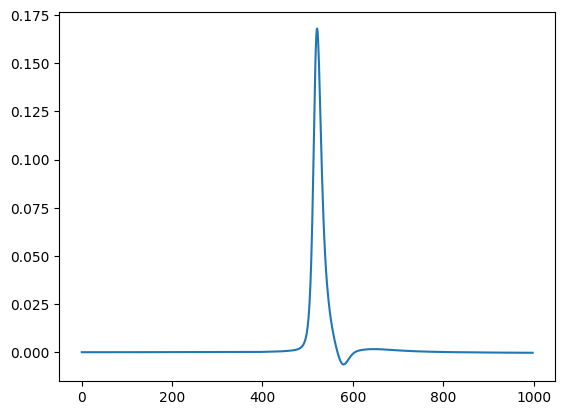

In [ ]:
plot_slopes(results[r_other_key][0])

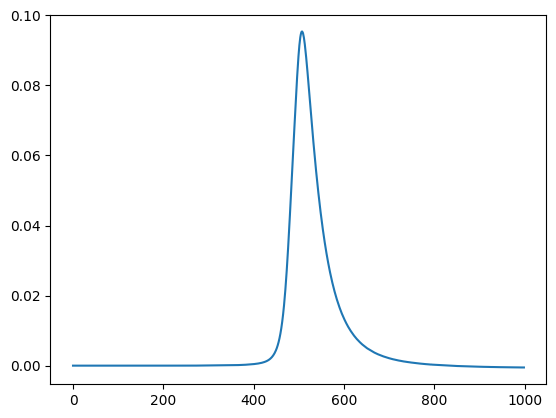

In [ ]:
plot_slopes(results[r_other_key][2])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.90 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:06<00:00,  6.23s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

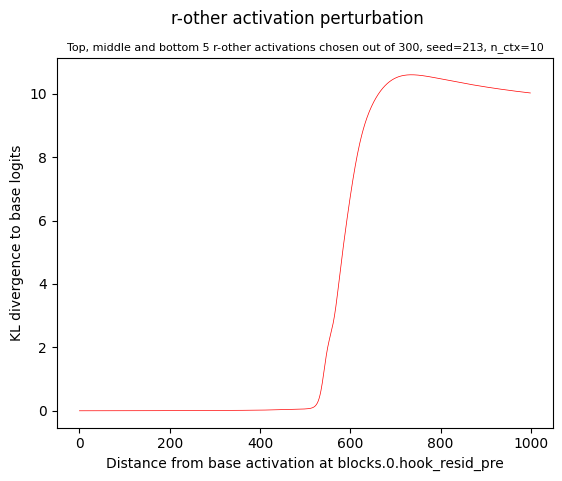

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.89 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.89 GB


100%|██████████| 1/1 [00:06<00:00,  6.09s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

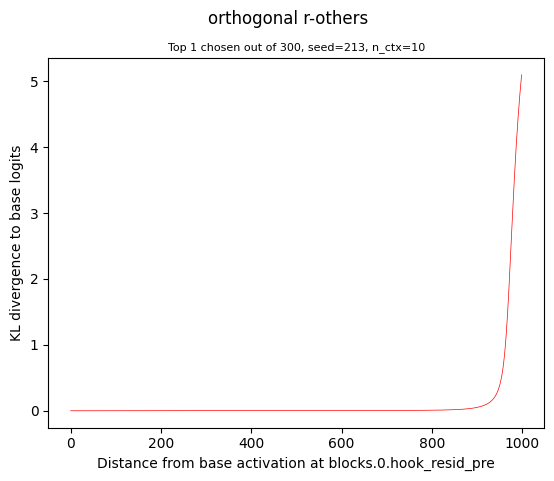

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
def plot_slopes(res):
    arr = np.array(res)
    dy = np.diff(arr)
    dx = 1
    slopes = dy/dx
    plt.plot(slopes)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = True
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.89 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.89 GB


100%|██████████| 1/1 [00:05<00:00,  5.86s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

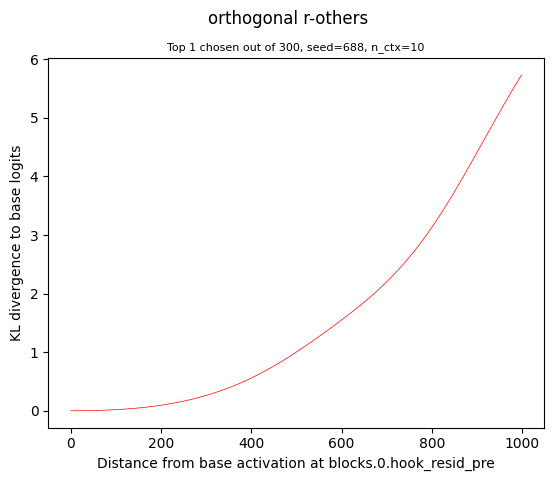

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
def plot_slopes(res):
    arr = np.array(res)
    dy = np.diff(arr)
    dx = 1
    slopes = dy/dx
    plt.plot(slopes)

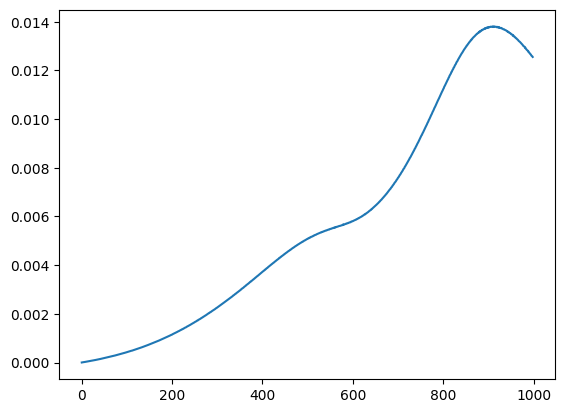

In [ ]:
plot_slopes(results[predefined_other_key][0])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 3/3 [00:11<00:00,  3.83s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

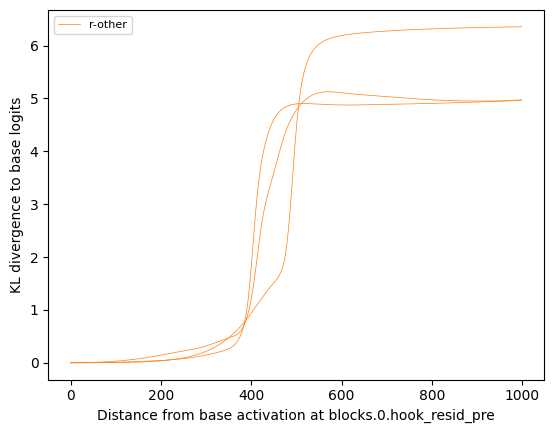

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 213
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  565,  3458,   284,   766, 10713,   810,   612,   318,  4844,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 3
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.89 GB


100%|██████████| 3/3 [00:10<00:00,  3.50s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

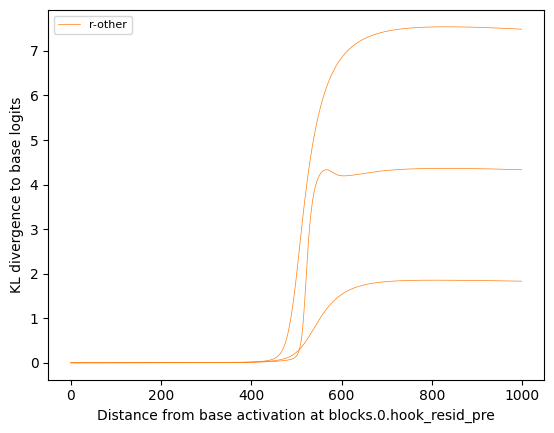

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

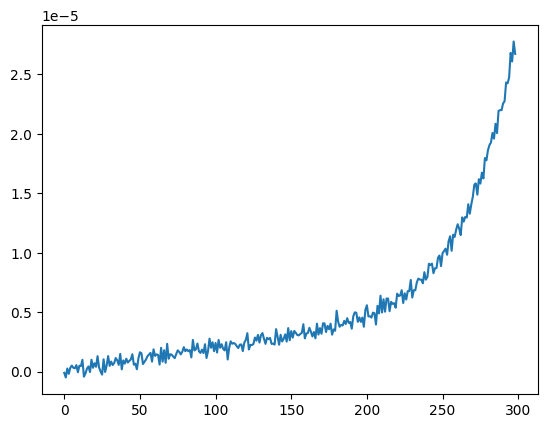

In [ ]:
plot_slopes(results[r_other_key][2][:300])

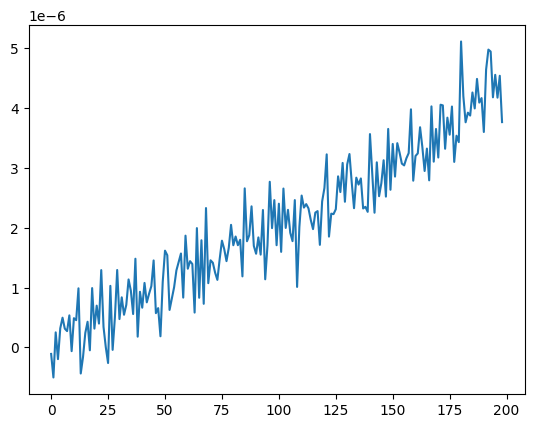

In [ ]:
plot_slopes(results[r_other_key][2][:200])

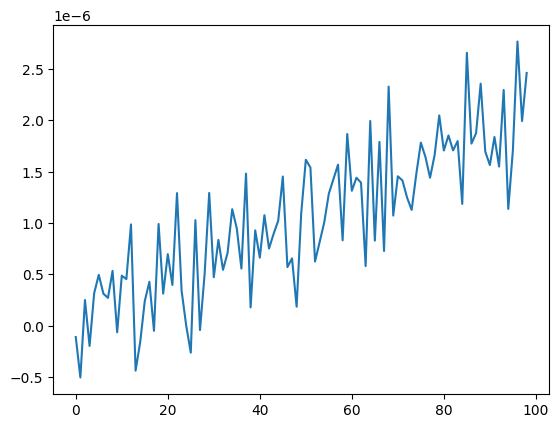

In [ ]:
plot_slopes(results[r_other_key][2][:100])

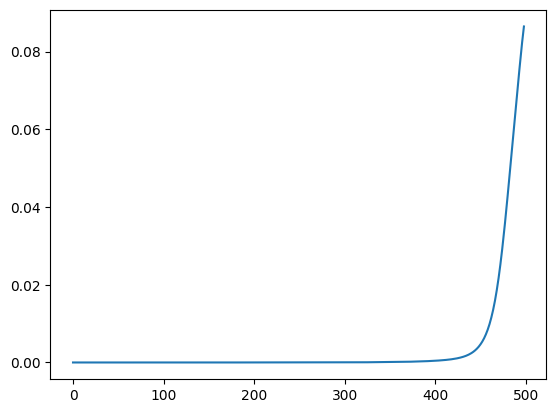

In [ ]:
plot_slopes(results[r_other_key][2][:500])

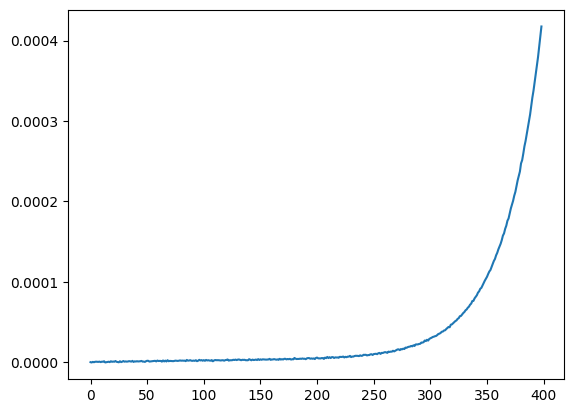

In [ ]:
plot_slopes(results[r_other_key][2][:400])

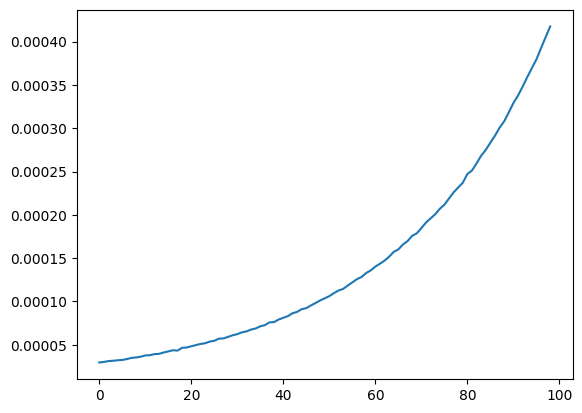

In [ ]:
plot_slopes(results[r_other_key][2][300:400])

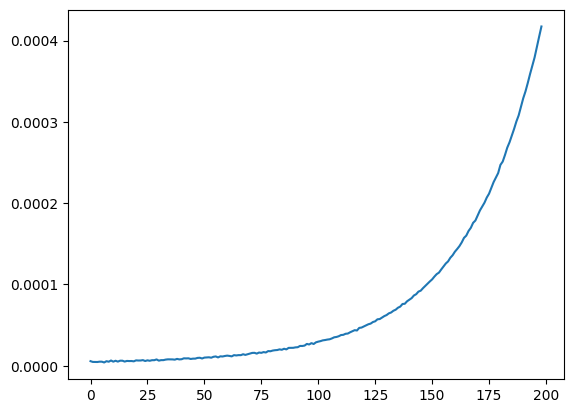

In [ ]:
plot_slopes(results[r_other_key][2][200:400])

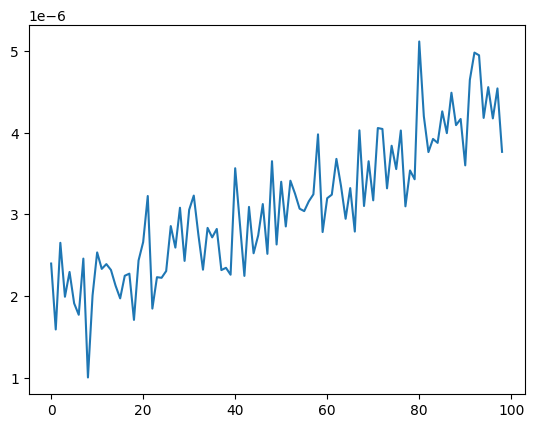

In [ ]:
plot_slopes(results[r_other_key][2][100:200])

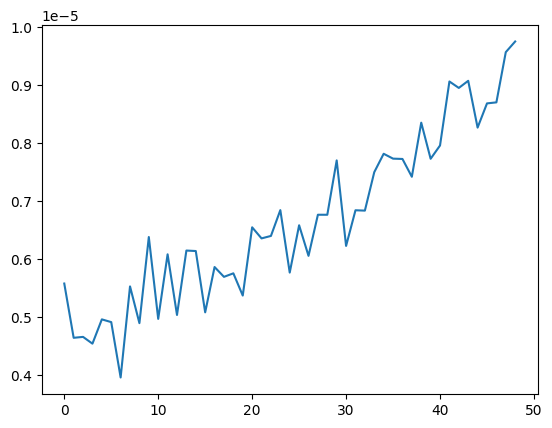

In [ ]:
plot_slopes(results[r_other_key][2][200:250])

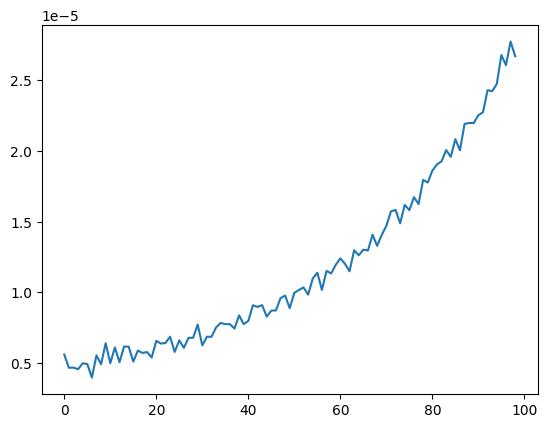

In [ ]:
plot_slopes(results[r_other_key][2][200:300])

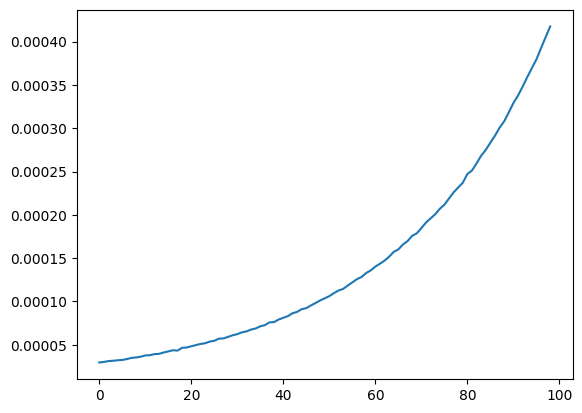

In [ ]:
plot_slopes(results[r_other_key][2][300:400])

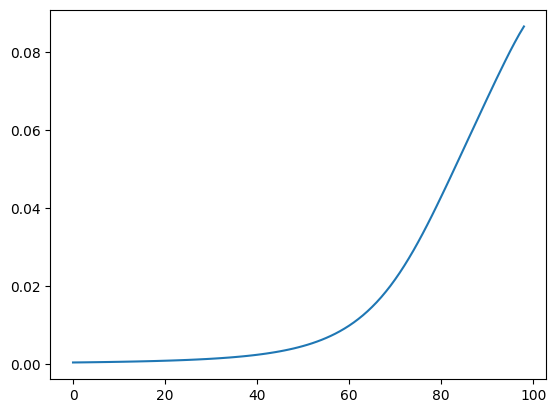

In [ ]:
plot_slopes(results[r_other_key][2][400:500])

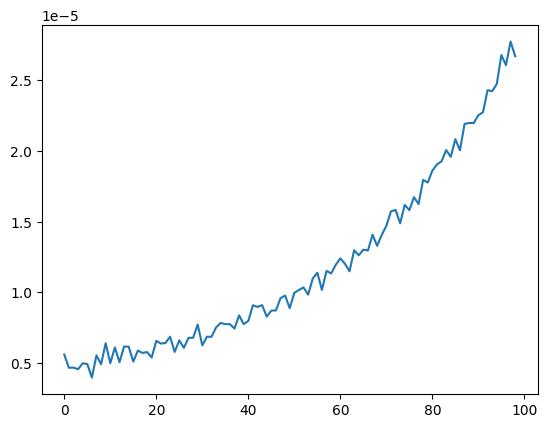

In [ ]:
plot_slopes(results[r_other_key][2][200:300])

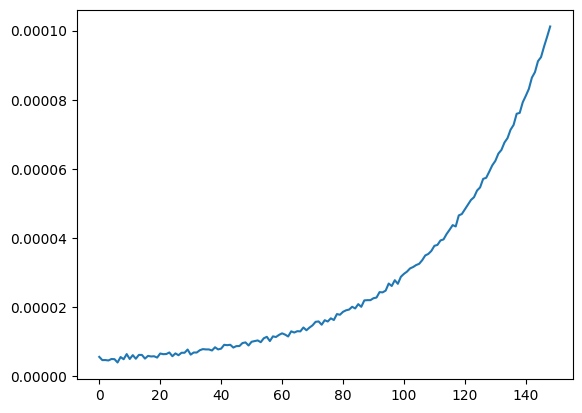

In [ ]:
plot_slopes(results[r_other_key][2][200:350])

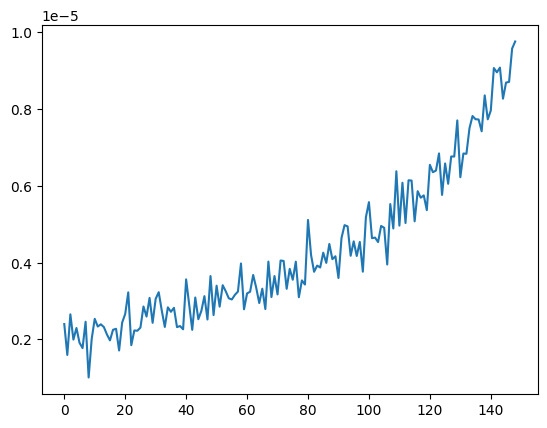

In [ ]:
plot_slopes(results[r_other_key][2][100:250])

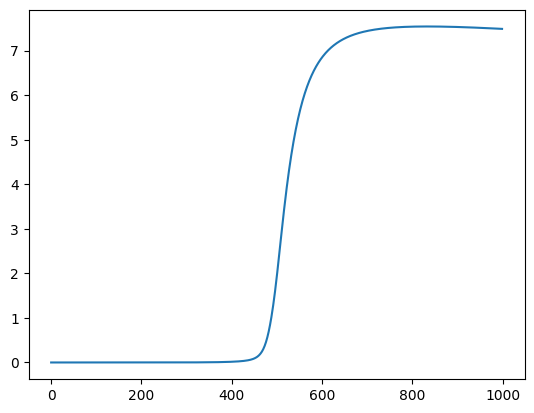

In [ ]:
plt.plot(results[r_other_key][2])

No kernel connected

Connected to .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 416
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
ADDITIVE_PERTURBATION = False
if ADDITIVE_PERTURBATION:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if ADDITIVE_PERTURBATION:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if ADDITIVE_PERTURBATION:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if ADDITIVE_PERTURBATION and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 1064,   257, 11080,  6143,  9290,    11,  1309,  3436,   530,   326]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if ADDITIVE_PERTURBATION:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if ADDITIVE_PERTURBATION:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if ADDITIVE_PERTURBATION:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if ADDITIVE_PERTURBATION:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if ADDITIVE_PERTURBATION:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 1/1 [00:06<00:00,  6.86s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if ADDITIVE_PERTURBATION:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not ADDITIVE_PERTURBATION:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

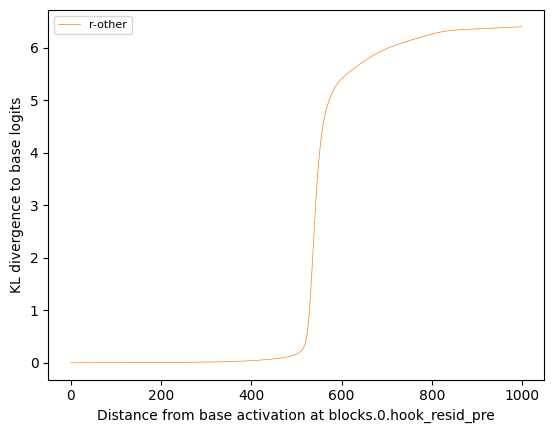

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 416
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False
additive_perturbation = False
if additive_perturbation:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 1064,   257, 11080,  6143,  9290,    11,  1309,  3436,   530,   326]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:06<00:00,  6.61s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

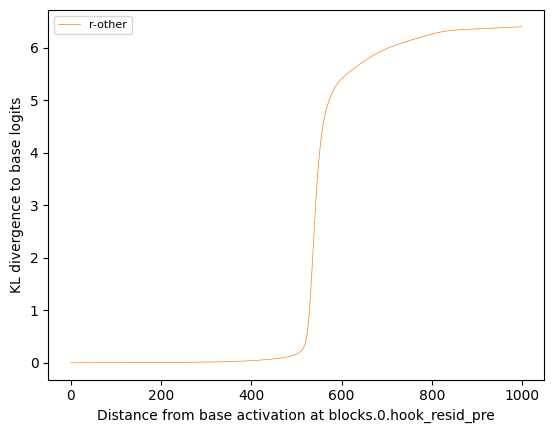

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 416
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False
additive_perturbation = False
if additive_perturbation:
    ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 1064,   257, 11080,  6143,  9290,    11,  1309,  3436,   530,   326]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:06<00:00,  6.84s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

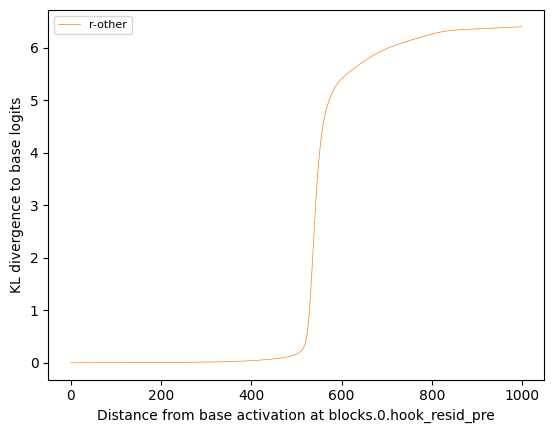

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
additive_perturbation = True

# predefined_other_prompts

In [ ]:
r_other_prompt

[tensor([[ 1438,  2458,    11,   523, 31333,   290,  2444,   477,  3538,  5911]])]

In [ ]:
additive_perturbation = True

predefined_other_prompts = r_other_prompt

predefined_other_perturbation = PredefinedActivationPerturbation(
    base_ref, dataset, predefined_other_prompts
)

kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

NameError: name 'ADDITIVE_ORIGIN' is not defined

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 416
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
#if additive_perturbation:
ADDITIVE_ORIGIN = True #TODO: change back

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[ 1064,   257, 11080,  6143,  9290,    11,  1309,  3436,   530,   326]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.25 GB


100%|██████████| 1/1 [00:06<00:00,  6.78s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

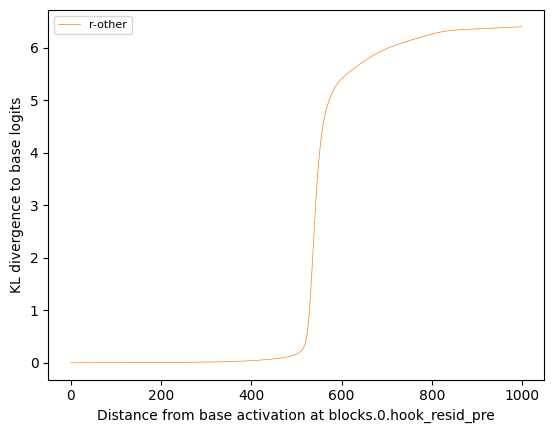

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
additive_perturbation = True

predefined_other_prompts = r_other_prompt

predefined_other_perturbation = PredefinedActivationPerturbation(
    base_ref, dataset, predefined_other_prompts
)

kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
kl_div

tensor([-1.9990e-07, -3.5101e-07, -2.0052e-07, -2.8137e-07, -4.1416e-07,
        -6.4132e-07, -2.0837e-07, -4.5131e-07,  8.9720e-08,  5.1721e-07,
         1.2352e-06,  2.0685e-06,  2.1568e-06,  2.8441e-06,  3.3874e-06,
         3.9823e-06,  4.3731e-06,  6.0796e-06,  5.9271e-06,  6.8957e-06,
         7.9059e-06,  8.3300e-06,  9.4366e-06,  9.7566e-06,  1.1568e-05,
         1.2795e-05,  1.3973e-05,  1.5704e-05,  1.6229e-05,  1.6792e-05,
         1.8481e-05,  1.9578e-05,  2.1318e-05,  2.2435e-05,  2.3802e-05,
         2.5898e-05,  2.7841e-05,  2.9563e-05,  3.0947e-05,  3.2434e-05,
         3.4896e-05,  3.6786e-05,  3.8987e-05,  4.0986e-05,  4.3341e-05,
         4.5586e-05,  4.7464e-05,  4.9733e-05,  5.1899e-05,  5.4707e-05,
         5.7417e-05,  5.9863e-05,  6.2029e-05,  6.4428e-05,  6.7378e-05,
         6.9900e-05,  7.2617e-05,  7.5323e-05,  7.8544e-05,  8.1616e-05,
         8.4631e-05,  8.8287e-05,  9.1479e-05,  9.4730e-05,  9.7811e-05,
         1.0113e-04,  1.0465e-04,  1.0870e-04,  1.1

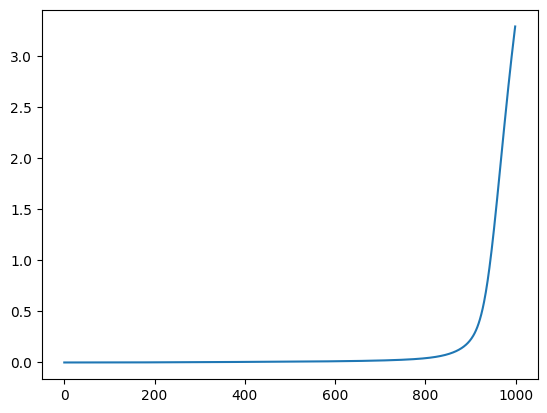

In [ ]:
plt.plot(kl_div)

In [ ]:
r1 = results[r_other_key][0]

In [ ]:
r2 = kl_div

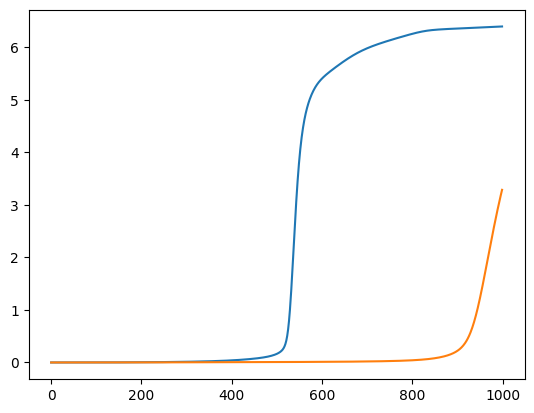

In [ ]:
plt.plot(r1)
plt.plot(r2)

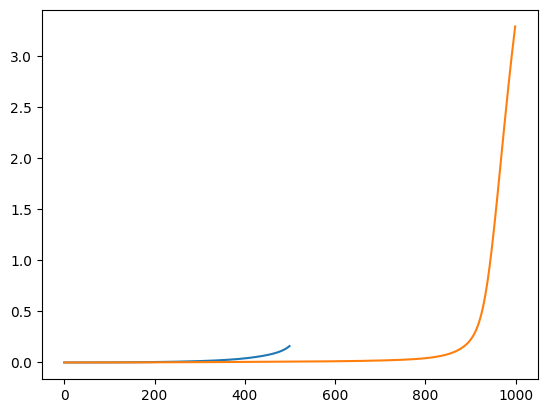

In [ ]:
plt.plot(r1[:500])
plt.plot(r2)

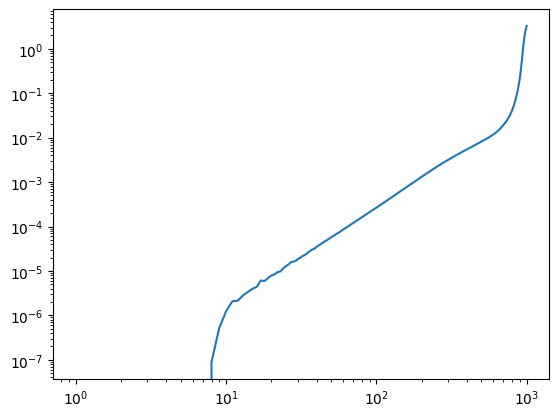

In [ ]:
plt.loglog(r2)

In [ ]:
ys = []
for i in range(1, n_steps/2):
    x = 1 * 1.0 / (n_steps/2)
    y = x / (1 - x)
    yi = round(y)
    ys.append(yi)
plt.plot(ys)



TypeError: 'float' object cannot be interpreted as an integer

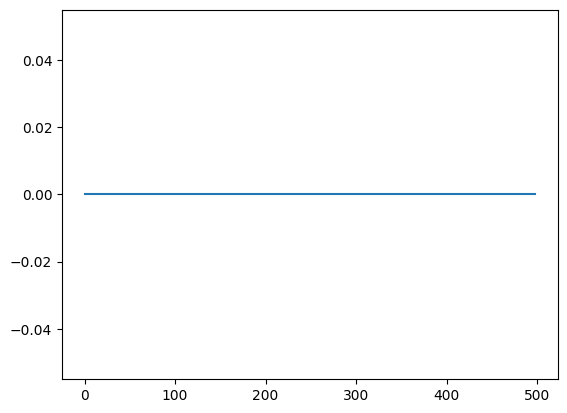

In [ ]:
ys = []
for i in range(1, 500):
    x = 1 * 1.0 / 500
    y = x / (1 - x)
    yi = round(y)
    ys.append(yi)
plt.plot(ys)

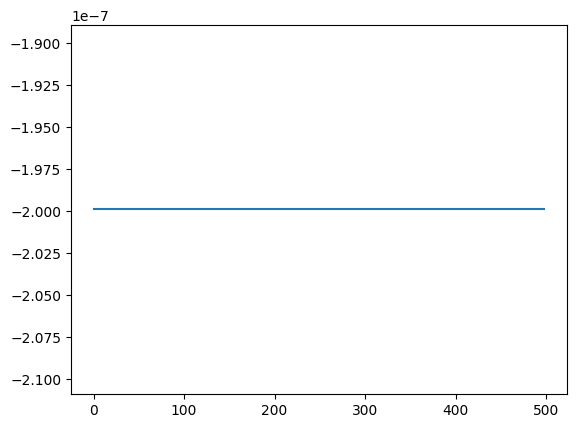

In [ ]:
ys = []
for i in range(1, 500):
    x = 1 * 1.0 / 500
    y = x / (1 - x)
    yi = round(y)
    ys.append(r1[yi])
plt.plot(ys)

0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004008016032064 0
0.002 0.002004

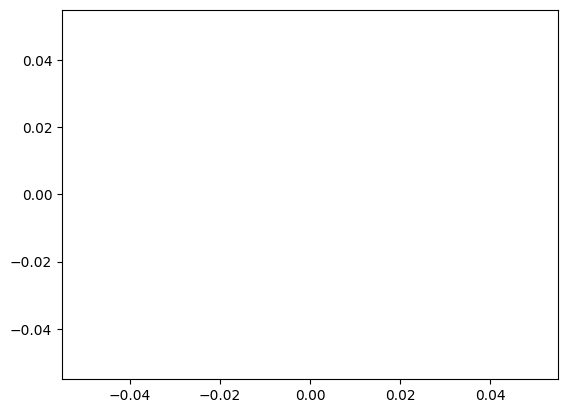

In [ ]:
ys = []
for i in range(1, 500):
    x = 1 * 1.0 / 500
    y = x / (1 - x)
    yi = round(y)
    print(x, y, yi)
    #ys.append(yi)
plt.plot(ys)

0.002 0.002004008016032064 0
0.004 0.004016064257028113 0
0.006 0.006036217303822938 0
0.008 0.008064516129032258 0
0.01 0.010101010101010102 0
0.012 0.012145748987854251 0
0.014 0.014198782961460446 0
0.016 0.016260162601626018 0
0.018 0.018329938900203666 0
0.02 0.020408163265306124 0
0.022 0.022494887525562373 0
0.024 0.02459016393442623 0
0.026 0.026694045174537988 0
0.028 0.02880658436213992 0
0.03 0.030927835051546393 0
0.032 0.03305785123966942 0
0.034 0.035196687370600416 0
0.036 0.03734439834024896 0
0.038 0.0395010395010395 0
0.04 0.04166666666666667 0
0.042 0.04384133611691023 0
0.044 0.04602510460251046 0
0.046 0.04821802935010482 0
0.048 0.05042016806722689 0
0.05 0.052631578947368425 0
0.052 0.05485232067510549 0
0.054 0.05708245243128964 0
0.056 0.059322033898305086 0
0.058 0.06157112526539279 0
0.06 0.06382978723404255 0
0.062 0.06609808102345416 0
0.064 0.06837606837606838 0
0.066 0.07066381156316917 0
0.068 0.07296137339055794 0
0.07 0.07526881720430109 0
0.072 0.0775

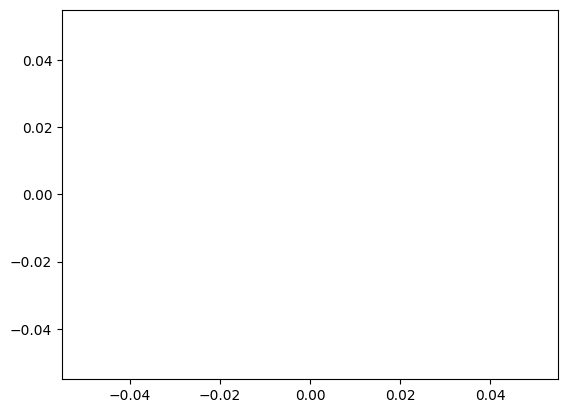

In [ ]:
ys = []
for i in range(1, 500):
    x = i * 1.0 / 500
    y = x / (1 - x)
    yi = round(y)
    print(x, y, yi)
    #ys.append(yi)
plt.plot(ys)

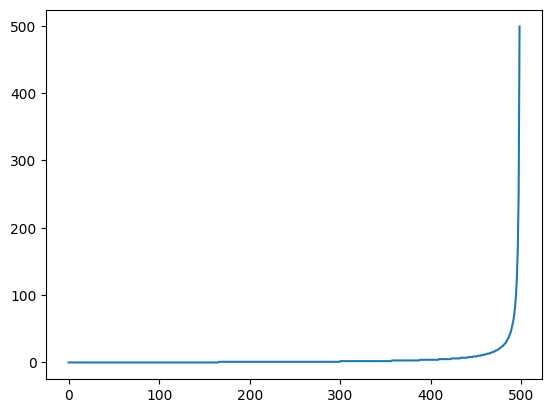

In [ ]:
ys = []
for i in range(1, 500):
    x = i * 1.0 / 500
    y = x / (1 - x)
    yi = round(y)
    #print(x, y, yi)
    ys.append(yi)
plt.plot(ys)

0.0 0.0 0
0.002 0.002004008016032064 0
0.004 0.004016064257028113 0
0.006 0.006036217303822938 0
0.008 0.008064516129032258 0
0.01 0.010101010101010102 0
0.012 0.012145748987854251 0
0.014 0.014198782961460446 0
0.016 0.016260162601626018 0
0.018 0.018329938900203666 0
0.02 0.020408163265306124 0
0.022 0.022494887525562373 0
0.024 0.02459016393442623 0
0.026 0.026694045174537988 0
0.028 0.02880658436213992 0
0.03 0.030927835051546393 0
0.032 0.03305785123966942 0
0.034 0.035196687370600416 0
0.036 0.03734439834024896 0
0.038 0.0395010395010395 0
0.04 0.04166666666666667 0
0.042 0.04384133611691023 0
0.044 0.04602510460251046 0
0.046 0.04821802935010482 0
0.048 0.05042016806722689 0
0.05 0.052631578947368425 0
0.052 0.05485232067510549 0
0.054 0.05708245243128964 0
0.056 0.059322033898305086 0
0.058 0.06157112526539279 0
0.06 0.06382978723404255 0
0.062 0.06609808102345416 0
0.064 0.06837606837606838 0
0.066 0.07066381156316917 0
0.068 0.07296137339055794 0
0.07 0.07526881720430109 0
0.

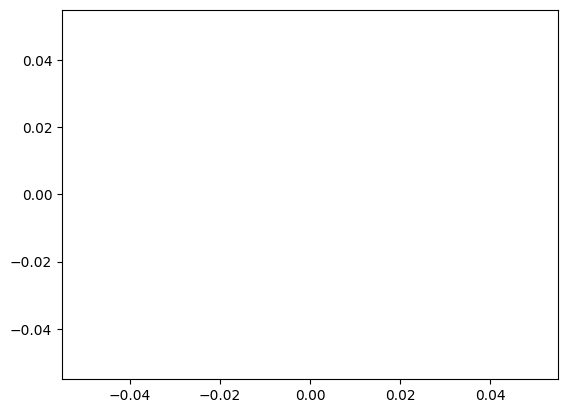

In [ ]:
ys = []
for i in range(0, 500):
    x = i * 1.0 / 500
    y = x / (1 - x)
    yi = round(y)
    print(x, y, yi)
    #ys.append(yi)
plt.plot(r2[ys])

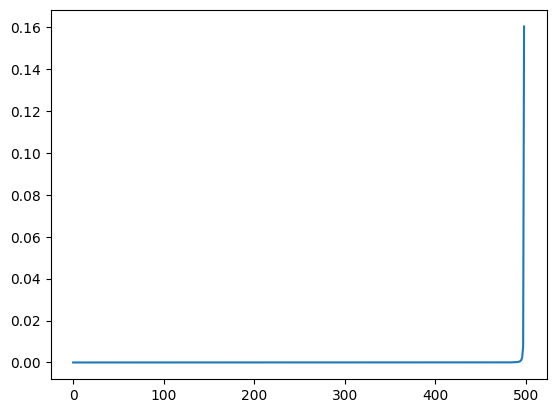

In [ ]:
ys = []
for i in range(1, 500):
    x = i * 1.0 / 500
    y = x / (1 - x)
    yi = round(y)
    #print(x, y, yi)
    ys.append(r1[yi])
plt.plot(ys)

In [ ]:
ys = []
for i in range(1, 500):
    x = i * 1.0 / 500
    y = x / (1 - x) * 1000
    yi = round(y)
    #print(x, y, yi)
    ys.append(r1[yi])
plt.plot(ys)

IndexError: index 1000 is out of bounds for dimension 0 with size 1000

0.002 2.004008016032064 2
0.004 4.016064257028113 4
0.006 6.036217303822938 6
0.008 8.064516129032258 8
0.01 10.101010101010102 10
0.012 12.145748987854251 12
0.014 14.198782961460447 14
0.016 16.260162601626018 16
0.018 18.329938900203665 18
0.02 20.408163265306126 20
0.022 22.494887525562373 22
0.024 24.59016393442623 25
0.026 26.694045174537987 27
0.028 28.80658436213992 29
0.03 30.927835051546392 31
0.032 33.057851239669425 33
0.034 35.196687370600415 35
0.036 37.344398340248965 37
0.038 39.5010395010395 40
0.04 41.66666666666667 42
0.042 43.841336116910234 44
0.044 46.02510460251046 46
0.046 48.21802935010482 48
0.048 50.42016806722689 50
0.05 52.631578947368425 53
0.052 54.85232067510549 55
0.054 57.08245243128964 57
0.056 59.32203389830509 59
0.058 61.57112526539279 62
0.06 63.82978723404255 64
0.062 66.09808102345416 66
0.064 68.37606837606839 68
0.066 70.66381156316918 71
0.068 72.96137339055794 73
0.07 75.26881720430109 75
0.072 77.58620689655172 78
0.074 79.91360691144708 80

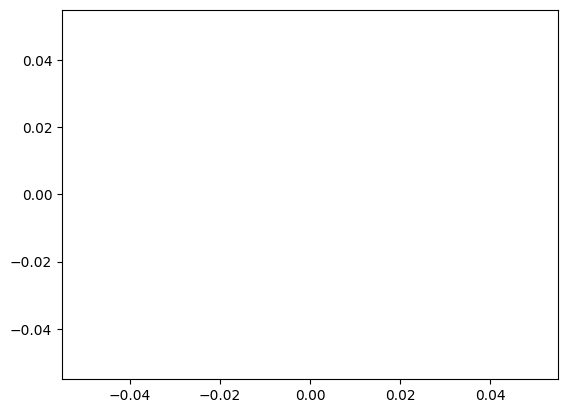

In [ ]:
ys = []
for i in range(1, 500):
    x = i * 1.0 / 500
    y = x / (1 - x) * 1000
    yi = round(y)
    print(x, y, yi)
    #ys.append(r1[yi])
plt.plot(ys)

0.001 1.001001001001001 1
0.002 2.004008016032064 2
0.003 3.0090270812437314 3
0.004 4.016064257028113 4
0.005 5.025125628140704 5
0.006 6.036217303822938 6
0.007 7.049345417925478 7
0.008 8.064516129032258 8
0.009 9.081735620585267 9
0.01 10.101010101010102 10
0.011 11.122345803842265 11
0.012 12.145748987854251 12
0.013 13.171225937183383 13
0.014 14.198782961460447 14
0.015 15.228426395939085 15
0.016 16.260162601626018 16
0.017 17.293997965412007 17
0.018 18.329938900203665 18
0.019 19.367991845056064 19
0.02 20.408163265306126 20
0.021 21.450459652706844 21
0.022 22.494887525562373 22
0.023 23.541453428863868 24
0.024 24.59016393442623 25
0.025 25.641025641025642 26
0.026 26.694045174537987 27
0.027 27.749229188078107 28
0.028 28.80658436213992 29
0.029 29.866117404737388 30
0.03 30.927835051546392 31
0.031 31.991744066047474 32
0.032 33.057851239669425 33
0.033 34.12616339193382 34
0.034 35.196687370600415 35
0.035 36.26943005181347 36
0.036 37.344398340248965 37
0.037 38.4215991

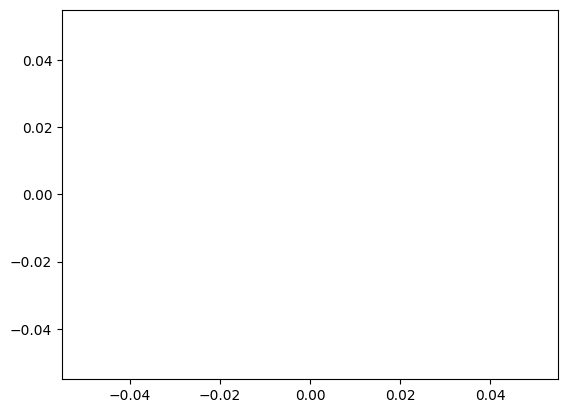

In [ ]:
ys = []
for i in range(1, 500):
    x = i * 1.0 / 1000
    y = x / (1 - x) * 1000
    yi = round(y)
    print(x, y, yi)
    #ys.append(r1[yi])
plt.plot(ys)

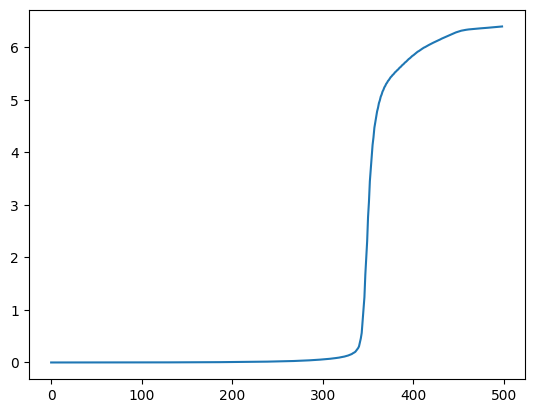

In [ ]:
ys = []
for i in range(1, 500):
    x = i * 1.0 / 1000
    y = x / (1 - x) * 1000
    yi = round(y)
    #print(x, y, yi)
    ys.append(r1[yi])
plt.plot(ys)

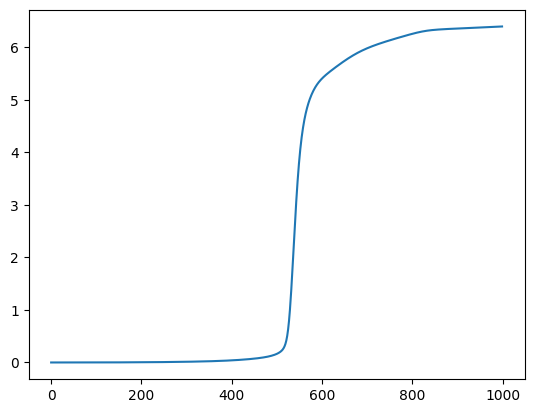

In [ ]:
plt.plot(r1)


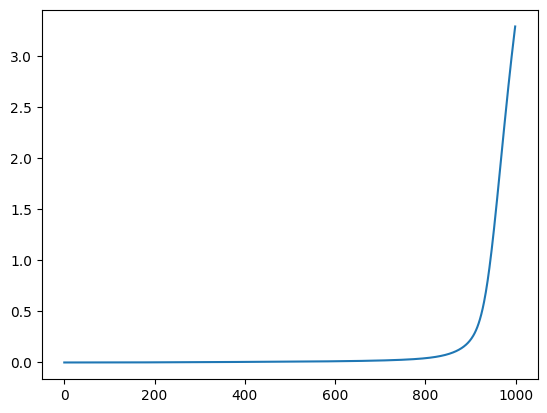

In [ ]:
plt.plot(r2)

In [ ]:
dy = np.diff(r1)

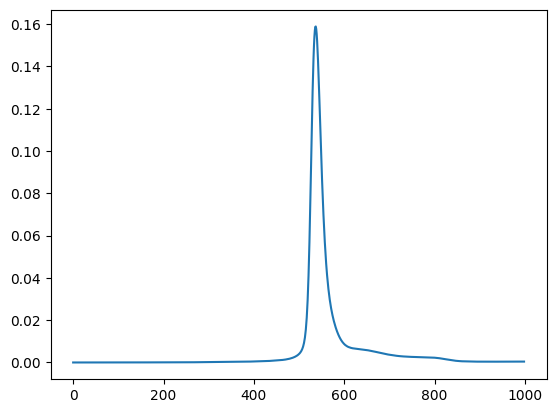

In [ ]:
plt.plot(dy)

In [ ]:
dy = np.diff(r1[:500])

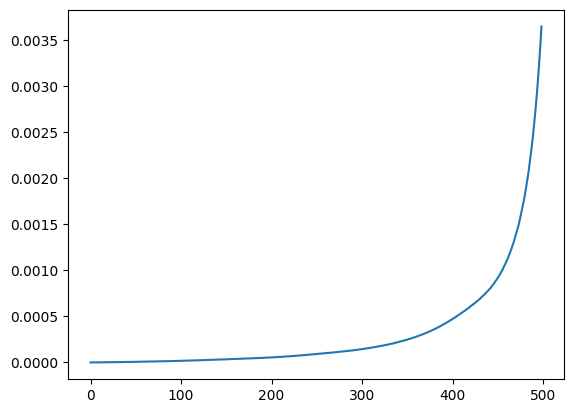

In [ ]:
plt.plot(dy)

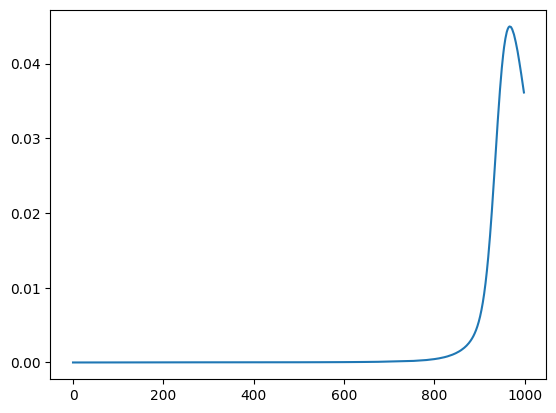

In [ ]:
plt.plot(np.diff(r2))

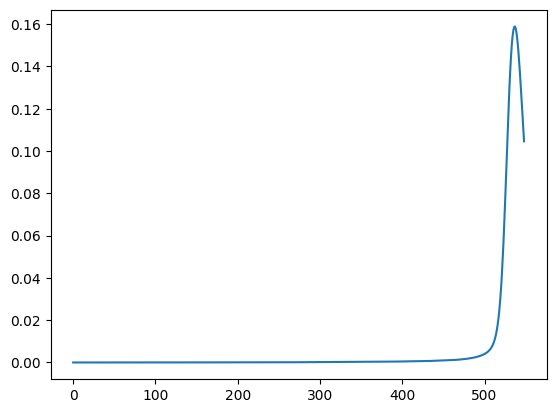

In [ ]:
plt.plot(np.diff(r1[:550]))

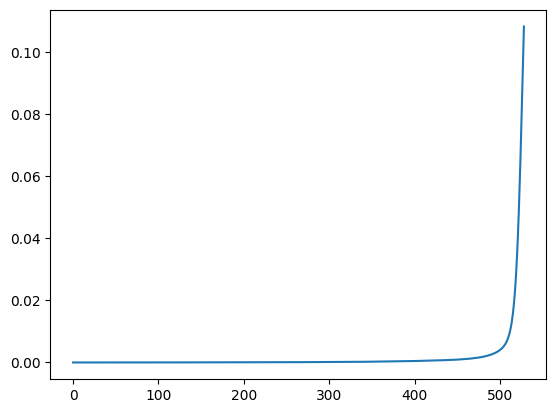

In [ ]:
plt.plot(np.diff(r1[:530]))

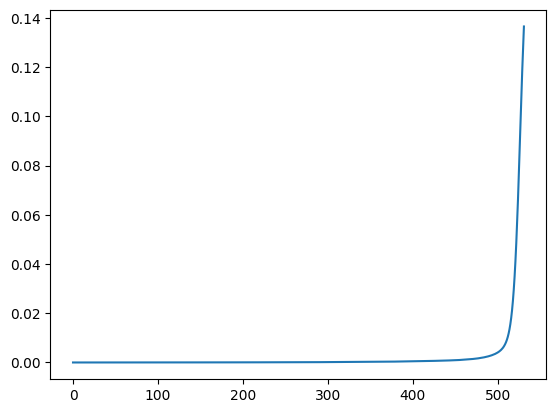

In [ ]:
plt.plot(np.diff(r1[:533]))

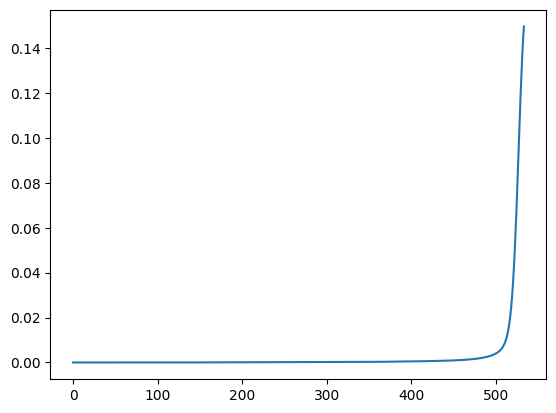

In [ ]:
plt.plot(np.diff(r1[:535]))

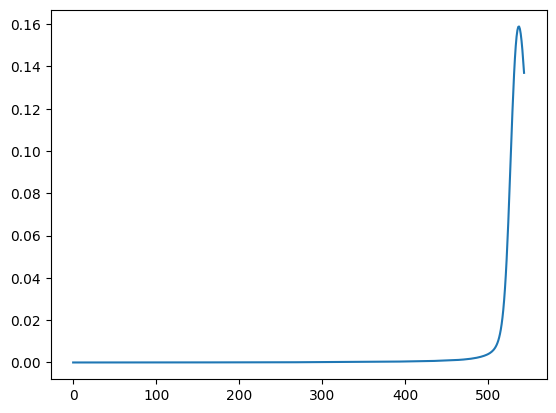

In [ ]:
plt.plot(np.diff(r1[:545]))

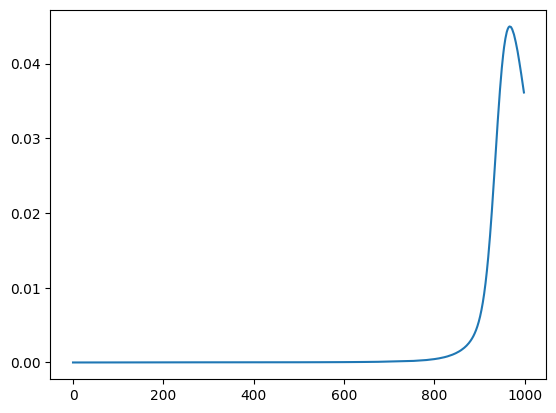

In [ ]:
plt.plot(np.diff(r2))

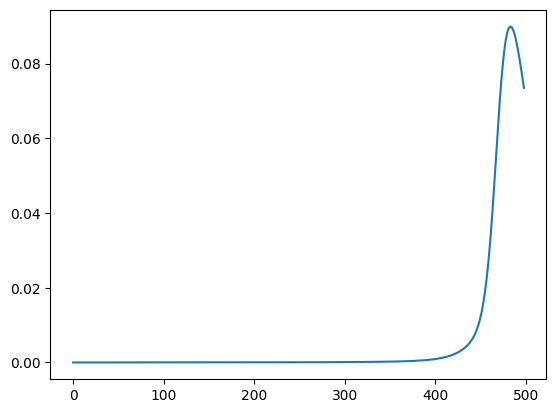

In [ ]:
plt.plot(np.diff(r2[::2]))

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:05<00:00,  5.42s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

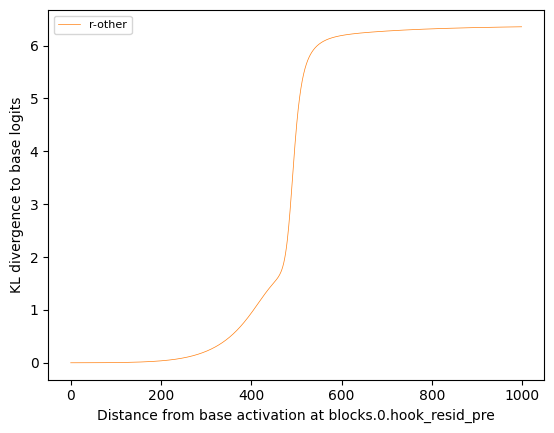

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
r1 = results[r_other_key][0]

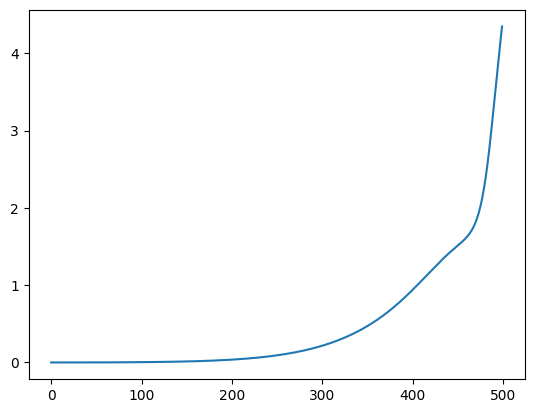

In [ ]:
plt.plot(r1[:500])

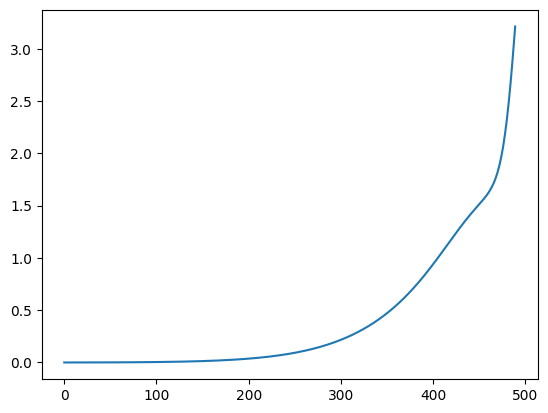

In [ ]:
plt.plot(r1[:490])

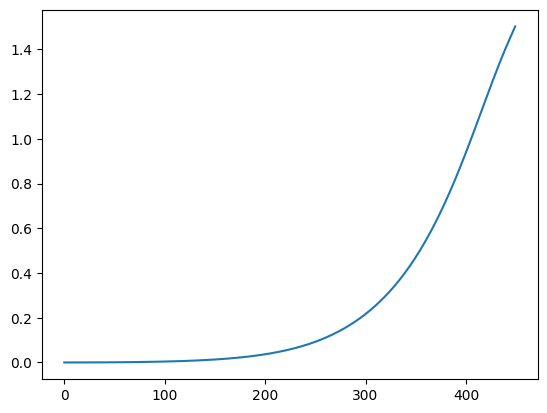

In [ ]:
plt.plot(r1[:450])

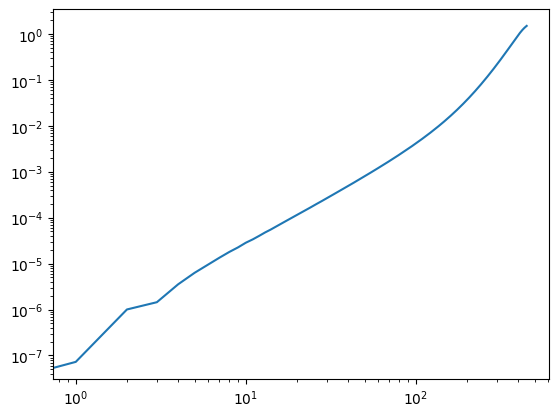

In [ ]:
plt.loglog(r1[:450])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.88 GB


100%|██████████| 1/1 [00:06<00:00,  6.57s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

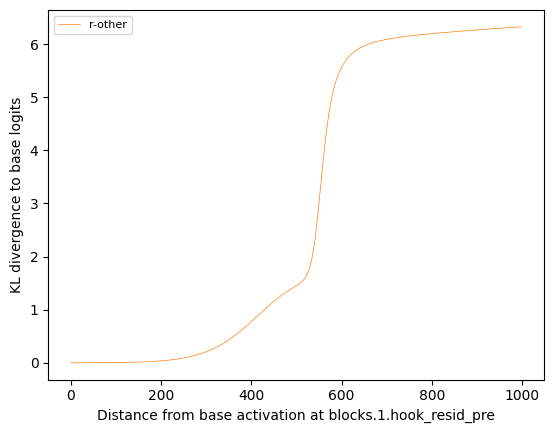

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

Connected to .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2")
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 1/1 [00:07<00:00,  7.05s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

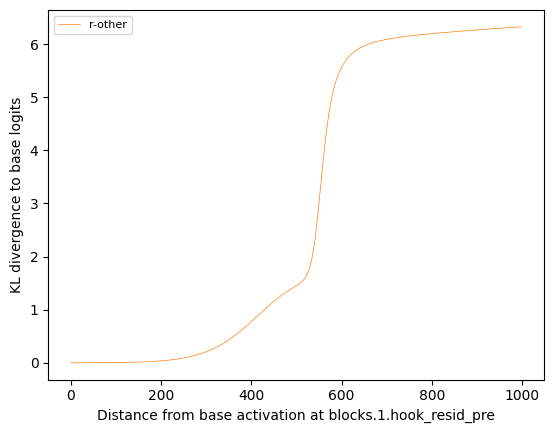

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))

tensor([[-2.4835e-09]])
tensor([ 0.0009,  0.0014, -0.0004,  ...,  0.0010,  0.0009, -0.0005])
tensor(-0.0545)


In [ ]:
model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  262,  1204,   286,   257,   582,    11,   355,   287, 28440,    11]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))

tensor([[0.0056]])
tensor([ 0.0009,  0.0014, -0.0004,  ...,  0.0010,  0.0009, -0.0005])
tensor(-0.0545)


In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 1000
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = True
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

Allocated: 1.26 GB
batch data shape: torch.Size([300, 768])


In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:06<00:00,  6.19s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

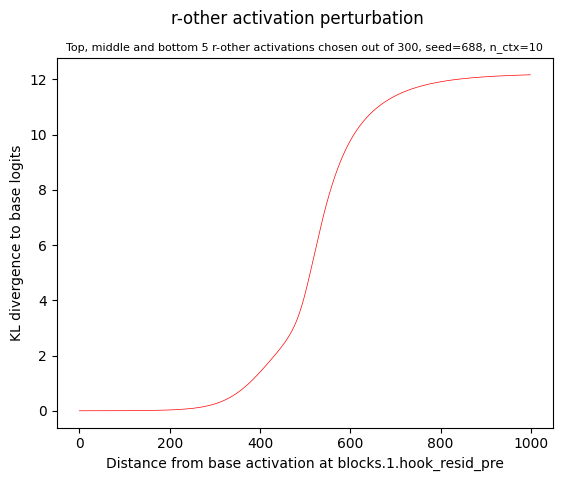

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))
sae.encode(base_ref.act)

tensor([[0.0017]])
tensor([ 0.0009,  0.0014, -0.0004,  ...,  0.0010,  0.0009, -0.0005])
tensor(-0.0545)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
len(data)

300

In [ ]:
torch.mean(data, dim-1)

NameError: name 'dim' is not defined

In [ ]:
torch.mean(data, dim=-1)

tensor([ 1.0983e-02,  1.7124e-02,  1.9656e-02, -1.3183e-03,  1.7086e-02,
         2.4851e-04, -2.0993e-02,  2.6987e-02,  2.8286e-02,  8.9052e-03,
         4.1082e-03,  3.1750e-02,  1.6692e-02,  3.8601e-02,  1.3915e-02,
        -5.7824e-03,  2.0477e-02,  2.3277e-02,  2.4922e-02,  2.3309e-02,
         2.6367e-02,  2.0227e-02,  1.7450e-02,  3.8282e-02,  1.3596e-02,
        -3.4878e-03,  3.6620e-02,  3.4036e-02,  2.9460e-02,  1.8460e-02,
         2.1125e-02,  2.9265e-02, -3.8231e-03,  2.4721e-02, -9.5907e-03,
        -1.4782e-02,  2.2984e-02,  4.0672e-03,  1.0502e-02,  3.6256e-02,
        -3.3379e-04,  1.4109e-02,  1.2510e-02,  2.5152e-02,  1.6856e-02,
         1.4737e-02,  2.7018e-03,  2.7152e-02,  2.1733e-02,  1.3063e-02,
         6.8310e-03,  3.3282e-02,  4.3684e-02,  9.0648e-03,  2.8895e-02,
         5.2389e-03,  3.5588e-02, -4.2973e-03,  1.3562e-02,  1.9224e-02,
         1.6688e-03, -2.1862e-03,  2.7108e-02,  1.7128e-03,  1.1187e-02,
         1.6302e-02,  1.8534e-03,  4.1427e-03,  3.5

In [ ]:
torch.mean(data[0], dim=-1)

tensor(0.0110)

In [ ]:
data_origin = [t - sae.b_dec for t in data]

In [ ]:
torch.mean([torch.norm(t) for t in data])

TypeError: mean(): argument 'input' (position 1) must be Tensor, not list

In [ ]:
np.mean([torch.norm(t) for t in data])

55.81471

In [ ]:
np.mean(data_origin)

0.07082532

In [ ]:
np.mean(torch.norm(data_origin))

AttributeError: 'list' object has no attribute 'layout'

In [ ]:
np.mean([torch.norm(d_o) for d_o in data_origin])

36.072624

In [ ]:
print([cosine_similarity(d_o, data_origin[0] for d_o in data_origin])

SyntaxError: closing parenthesis ']' does not match opening parenthesis '(' (<ipython-input-70-bb1b4543a065>, line 1)

In [ ]:
print([cosine_similarity(d_o, data_origin[0]) for d_o in data_origin])

[1.0, 0.41019999980926514, 0.34995919466018677, 0.369686096906662, 0.34198448061943054, 0.4273361563682556, 0.39788854122161865, 0.3654676675796509, 0.3233189284801483, 0.3606255054473877, 0.331024169921875, 0.31021252274513245, 0.32831406593322754, 0.34212052822113037, 0.2866661548614502, 0.39360952377319336, 0.34329766035079956, 0.3840092420578003, 0.3304927945137024, 0.3698263168334961, 0.3577006757259369, 0.4134184718132019, 0.35793745517730713, 0.2999347448348999, 0.2852378487586975, 0.33589690923690796, 0.33501943945884705, 0.3139623701572418, 0.24844954907894135, 0.31907927989959717, 0.3445417284965515, 0.3415999412536621, 0.4042297303676605, 0.34136223793029785, 0.3744085431098938, 0.39684557914733887, 0.3312235474586487, 0.4434112310409546, 0.41729989647865295, 0.3055017292499542, 0.5260423421859741, 0.2970345616340637, 0.32623291015625, 0.4276394546031952, 0.31739482283592224, 0.3648345470428467, 0.3968028426170349, 0.33178067207336426, 0.3748151361942291, 0.38077542185783386

In [ ]:
cos_sims = [cosine_similarity(d_o, data_origin[0]) for d_o in data_origin]

In [ ]:
np.mean(cos_sims)

0.3477119883398215

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = False

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.26 GB


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

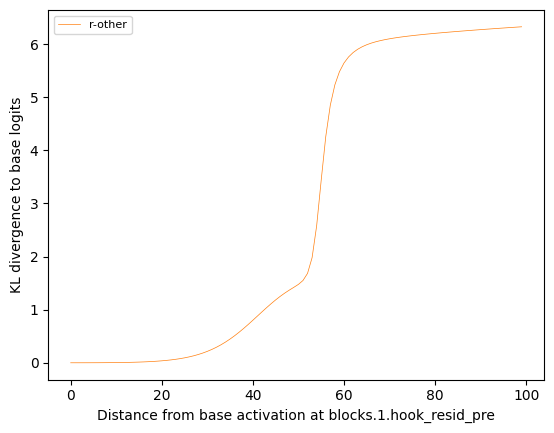

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))
sae.encode(base_ref.act)

tensor([[0.0017]])
tensor([ 0.0009,  0.0014, -0.0004,  ...,  0.0010,  0.0009, -0.0005])
tensor(-0.0545)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.88 GB


100%|██████████| 1/1 [00:01<00:00,  1.61s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

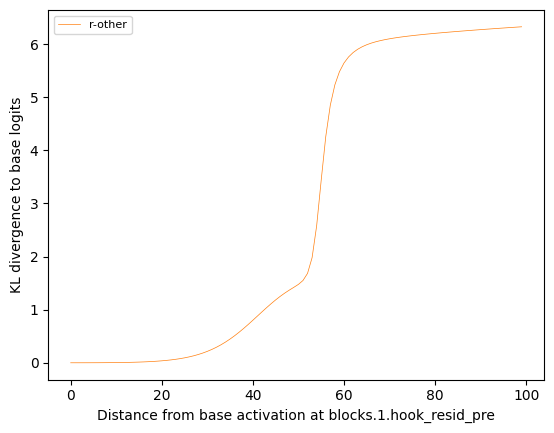

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))
sae.encode(base_ref.act)

tensor([[0.0017]])
tensor([ 0.0009,  0.0014, -0.0004,  ...,  0.0010,  0.0009, -0.0005])
tensor(-0.0545)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
# model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
model = HookedTransformer.from_pretrained("gpt2")

device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.88 GB


100%|██████████| 1/1 [00:01<00:00,  1.52s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

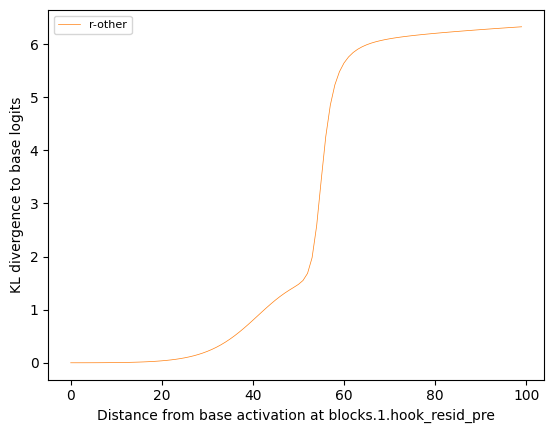

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))
sae.encode(base_ref.act)

tensor([[-2.4835e-09]])
tensor([ 0.0009,  0.0014, -0.0004,  ...,  0.0010,  0.0009, -0.0005])
tensor(-0.0545)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
perturbations_cache[r_other_key]

[tensor([[[ 1.6068,  0.6614, -1.9859,  ...,  1.3990,  2.0707,  0.7816]],
 
         [[ 1.6150,  0.6569, -1.9801,  ...,  1.4022,  2.0569,  0.7745]],
 
         [[ 1.6231,  0.6524, -1.9743,  ...,  1.4054,  2.0432,  0.7674]],
 
         ...,
 
         [[ 2.3936,  0.2278, -1.4255,  ...,  1.7075,  0.7371,  0.0951]],
 
         [[ 2.4017,  0.2233, -1.4197,  ...,  1.7107,  0.7233,  0.0880]],
 
         [[ 2.4098,  0.2189, -1.4139,  ...,  1.7139,  0.7096,  0.0809]]])]

In [ ]:
len(perturbations_cache[r_other_key])

1

In [ ]:
len(perturbations_cache[r_other_key][0])

100

In [ ]:
norms = [torch.norm(perturbations_cache[r_other_key][0][i]) for i in range(100)]

In [ ]:
norms


[tensor(59.5372),
 tensor(59.3515),
 tensor(59.1689),
 tensor(58.9895),
 tensor(58.8134),
 tensor(58.6406),
 tensor(58.4710),
 tensor(58.3048),
 tensor(58.1419),
 tensor(57.9824),
 tensor(57.8264),
 tensor(57.6737),
 tensor(57.5246),
 tensor(57.3789),
 tensor(57.2367),
 tensor(57.0981),
 tensor(56.9631),
 tensor(56.8316),
 tensor(56.7038),
 tensor(56.5797),
 tensor(56.4592),
 tensor(56.3424),
 tensor(56.2293),
 tensor(56.1200),
 tensor(56.0144),
 tensor(55.9126),
 tensor(55.8146),
 tensor(55.7205),
 tensor(55.6301),
 tensor(55.5437),
 tensor(55.4611),
 tensor(55.3825),
 tensor(55.3077),
 tensor(55.2369),
 tensor(55.1700),
 tensor(55.1071),
 tensor(55.0481),
 tensor(54.9932),
 tensor(54.9422),
 tensor(54.8953),
 tensor(54.8523),
 tensor(54.8134),
 tensor(54.7786),
 tensor(54.7478),
 tensor(54.7210),
 tensor(54.6983),
 tensor(54.6797),
 tensor(54.6651),
 tensor(54.6546),
 tensor(54.6482),
 tensor(54.6458),
 tensor(54.6476),
 tensor(54.6534),
 tensor(54.6633),
 tensor(54.6772),
 tensor(54

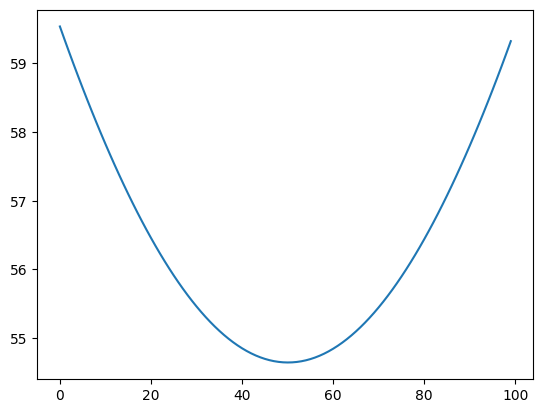

In [ ]:
plt.plot(norms)

In [ ]:
plt.ylimit(0)
plt.plot(norms)

AttributeError: module 'matplotlib.pyplot' has no attribute 'ylimit'

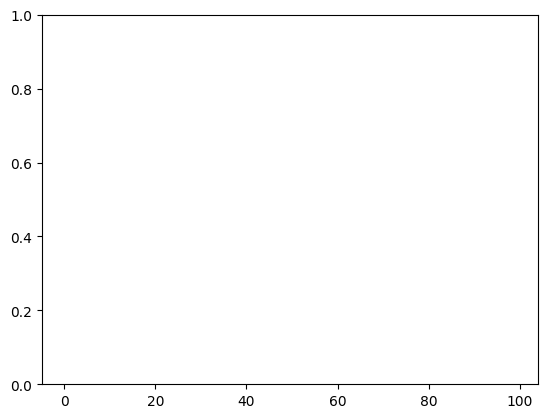

In [ ]:
plt.ylim(0)
plt.plot(norms)

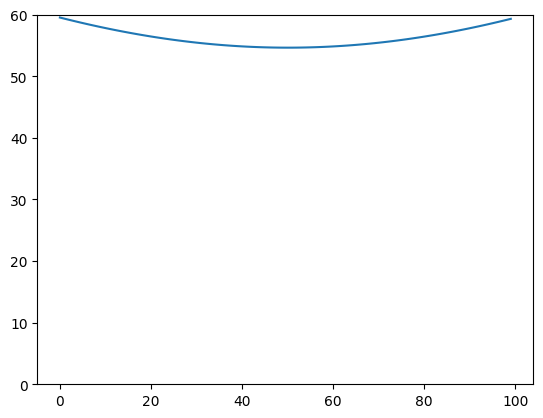

In [ ]:
plt.ylim(0,60)
plt.plot(norms)

Connected to .venv (Python 3.10.14)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 1
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys} 

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
# model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
model = HookedTransformer.from_pretrained("gpt2")

device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 0.63 GB


100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

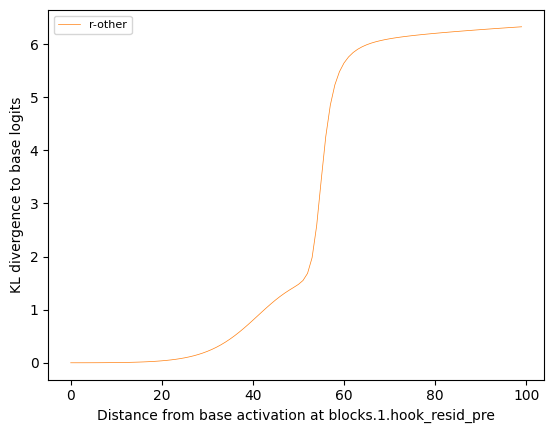

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))
sae.encode(base_ref.act)

tensor([[-2.4835e-09]])
tensor([ 0.0009,  0.0014, -0.0004,  ...,  0.0010,  0.0009, -0.0005])
tensor(-0.0545)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
r_other_prompt[0]

tensor([[   13,   402,  1453,    11,   326,   447,   247,    82,   257, 10195]])

In [ ]:
target_prompt = r_other_prompt[0]

target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

In [ ]:
base_ref.cache.keys

<bound method ActivationCache.keys of ActivationCache with keys ['hook_embed', 'hook_pos_embed', 'blocks.0.hook_resid_pre', 'blocks.0.ln1.hook_scale', 'blocks.0.ln1.hook_normalized', 'blocks.0.attn.hook_q', 'blocks.0.attn.hook_k', 'blocks.0.attn.hook_v', 'blocks.0.attn.hook_attn_scores', 'blocks.0.attn.hook_pattern', 'blocks.0.attn.hook_z', 'blocks.0.hook_attn_out', 'blocks.0.hook_resid_mid', 'blocks.0.ln2.hook_scale', 'blocks.0.ln2.hook_normalized', 'blocks.0.mlp.hook_pre', 'blocks.0.mlp.hook_post', 'blocks.0.hook_mlp_out', 'blocks.0.hook_resid_post', 'blocks.1.hook_resid_pre', 'blocks.1.ln1.hook_scale', 'blocks.1.ln1.hook_normalized', 'blocks.1.attn.hook_q', 'blocks.1.attn.hook_k', 'blocks.1.attn.hook_v', 'blocks.1.attn.hook_attn_scores', 'blocks.1.attn.hook_pattern', 'blocks.1.attn.hook_z', 'blocks.1.hook_attn_out', 'blocks.1.hook_resid_mid', 'blocks.1.ln2.hook_scale', 'blocks.1.ln2.hook_normalized', 'blocks.1.mlp.hook_pre', 'blocks.1.mlp.hook_post', 'blocks.1.hook_mlp_out', 'blocks

In [ ]:
blocks.1.mlp.hook_pre', 'blocks.1.mlp.hook_post', 'blocks.1.hook_mlp_out

SyntaxError: invalid syntax (<ipython-input-31-2f3b332044dc>, line 1)

In [ ]:
base_ref.cache["blocks.1.mlp.hook_pre"]

tensor([[[ 0.3670, -1.1152,  0.5264,  ..., -1.7742, -0.5415,  0.0683],
         [ 0.7238, -2.5923, -0.3158,  ..., -1.5708, -1.4572, -4.1221],
         [ 0.4139, -2.0213, -0.3480,  ..., -1.7399, -1.4271, -3.9030],
         ...,
         [-0.7754, -2.7256, -0.5919,  ..., -1.2393, -1.4342, -3.5965],
         [-0.5853, -2.7710, -0.0667,  ..., -1.7130,  2.5284, -3.5633],
         [ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366]]])

In [ ]:
base_ref.cache["blocks.1.mlp.hook_pre"].shape


torch.Size([1, 10, 3072])

In [ ]:
base_ref.cache["blocks.1.mlp.hook_post"].shape


torch.Size([1, 10, 3072])

In [ ]:
base_ref.cache["blocks.1.hook_mlp_out"].shape


torch.Size([1, 10, 768])

In [ ]:
base_ref.cache["blocks.1.hook_resid_post"].shape


torch.Size([1, 10, 768])

In [ ]:
base_ref.cache["blocks.1.hook_resid_post"] == base_ref.cache["blocks.1.hook_mlp_out"]

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]])

In [ ]:
base_ref.cache["blocks.1.hook_mlp_out"]

tensor([[[-0.5335, -1.1065, -0.6843,  ..., -0.6854, -0.8154, -0.3377],
         [ 0.2492,  0.1955, -0.1107,  ..., -0.5950,  0.3094,  0.0275],
         [-0.0908,  0.3049, -0.0392,  ...,  0.0319,  0.4252,  0.0982],
         ...,
         [ 0.1108,  0.6361, -0.4098,  ...,  0.1451,  0.6485,  0.1229],
         [-0.2077, -0.1751, -0.0892,  ...,  0.1994,  0.1783,  0.5089],
         [ 0.5547,  1.0656, -0.2164,  ..., -0.3148,  0.2196,  0.8479]]])

In [ ]:
base_ref.cache["blocks.1.hook_resid_post"]

tensor([[[-1.8280, -0.9981, -1.1542,  ..., -1.3478,  0.0260, -1.3831],
         [-0.2124, -0.2167, -0.9135,  ..., -1.1196,  0.6586, -0.7292],
         [-1.1403,  0.6171, -0.7059,  ..., -0.5639,  1.0921, -1.2385],
         ...,
         [ 1.0635,  1.2545, -1.7596,  ...,  0.7364,  0.7299, -0.7088],
         [ 1.9396, -0.2215, -0.9026,  ...,  0.8919,  0.1893,  0.7181],
         [ 2.3571,  1.9965, -2.7471,  ...,  1.1423,  2.1863,  1.6414]]])

In [ ]:
base_ref.cache["blocks.1.mlp.hidden"]

KeyError: 'blocks.1.mlp.hidden'

In [ ]:
target_prompt = r_other_prompt[0]

def hook_fn_mlp_hidden(act, output):
    act["blocks.1.mlp.hidden"] = output.detach().cpu().numpy()

model.transformer.blocks[1].mlp.dense_h_to_4h.register_forward_hook(hook_fn_mlp_hidden)

target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

AttributeError: 'HookedTransformer' object has no attribute 'transformer'

In [ ]:
target_prompt = r_other_prompt[0]

def hook_fn_mlp_hidden(act, output):
    act["blocks.1.mlp.hidden"] = output.detach().cpu().numpy()

model.blocks[1].mlp.dense_h_to_4h.register_forward_hook(hook_fn_mlp_hidden)

target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

AttributeError: 'MLP' object has no attribute 'dense_h_to_4h'

In [ ]:
print(model)

HookedTransformer(
  (embed): Embed()
  (hook_embed): HookPoint()
  (pos_embed): PosEmbed()
  (hook_pos_embed): HookPoint()
  (blocks): ModuleList(
    (0-11): 12 x TransformerBlock(
      (ln1): LayerNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (ln2): LayerNormPre(
        (hook_scale): HookPoint()
        (hook_normalized): HookPoint()
      )
      (attn): Attention(
        (hook_k): HookPoint()
        (hook_q): HookPoint()
        (hook_v): HookPoint()
        (hook_z): HookPoint()
        (hook_attn_scores): HookPoint()
        (hook_pattern): HookPoint()
        (hook_result): HookPoint()
      )
      (mlp): MLP(
        (hook_pre): HookPoint()
        (hook_post): HookPoint()
      )
      (hook_attn_in): HookPoint()
      (hook_q_input): HookPoint()
      (hook_k_input): HookPoint()
      (hook_v_input): HookPoint()
      (hook_mlp_in): HookPoint()
      (hook_attn_out): HookPoint()
      (hook_mlp_out): HookPoint()
      (h

In [ ]:
base_ref.cache["blocks.1.mlp.hook_pre"]

tensor([[[ 0.3670, -1.1152,  0.5264,  ..., -1.7742, -0.5415,  0.0683],
         [ 0.7238, -2.5923, -0.3158,  ..., -1.5708, -1.4572, -4.1221],
         [ 0.4139, -2.0213, -0.3480,  ..., -1.7399, -1.4271, -3.9030],
         ...,
         [-0.7754, -2.7256, -0.5919,  ..., -1.2393, -1.4342, -3.5965],
         [-0.5853, -2.7710, -0.0667,  ..., -1.7130,  2.5284, -3.5633],
         [ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366]]])

In [ ]:
base_ref.cache["blocks.1.mlp.hook_post"]

tensor([[[ 2.3608e-01, -1.4782e-01,  3.6879e-01,  ..., -6.7531e-02,
          -1.5926e-01,  3.6027e-02],
         [ 5.5397e-01, -1.1895e-02, -1.1877e-01,  ..., -9.1483e-02,
          -1.0591e-01, -3.8697e-05],
         [ 2.7340e-01, -4.3594e-02, -1.2666e-01,  ..., -7.1332e-02,
          -1.0979e-01, -1.1073e-04],
         ...,
         [-1.6993e-01, -8.2752e-03, -1.6396e-01,  ..., -1.3359e-01,
          -1.0889e-01, -4.1855e-04],
         [-1.6343e-01, -7.2735e-03, -3.1589e-02,  ..., -7.4392e-02,
           2.5144e+00, -4.7884e-04],
         [ 7.7805e-02, -2.6694e-02, -1.6743e-01,  ..., -1.1702e-01,
          -7.7993e-02, -3.5483e-04]]])

In [ ]:
torch.norm(base_ref.cache["blocks.1.mlp.hook_pre"])

tensor(204.0634)

In [ ]:
torch.norm(target_ref.cache["blocks.1.mlp.hook_pre"])

tensor(200.5782)

In [ ]:
target_prompt = r_other_prompt[0]

target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

In [ ]:
def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = (base_ref.act + target_ref.act) * 0.5

with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    middle_logits, middle_cache = base_ref.model.run_with_cache(base_ref.prompt)

In [ ]:
middle_cache["blocks.1.mlp.hook_pre"]

tensor([[[ 0.3670, -1.1152,  0.5264,  ..., -1.7742, -0.5415,  0.0683],
         [ 0.7238, -2.5923, -0.3158,  ..., -1.5708, -1.4572, -4.1221],
         [ 0.4139, -2.0213, -0.3480,  ..., -1.7399, -1.4271, -3.9030],
         ...,
         [-0.7754, -2.7256, -0.5919,  ..., -1.2393, -1.4342, -3.5965],
         [-0.5853, -2.7710, -0.0667,  ..., -1.7130,  2.5284, -3.5633],
         [-0.2622, -2.3998, -0.6456,  ..., -1.0014, -2.4506, -3.8036]]],
       device='cuda:0')

In [ ]:
m = middle_cache["blocks.1.mlp.hook_pre"]

In [ ]:
a = base_ref.cache["blocks.1.mlp.hook_pre"]

In [ ]:
b = target_ref.cache["blocks.1.mlp.hook_pre"]

In [ ]:
m == (a + b) * 0.5

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu!

In [ ]:
def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = (base_ref.act + target_ref.act) * 0.5

with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    middle_logits, middle_cache = base_ref.model.run_with_cache(base_ref.prompt).to("cpu")

AttributeError: 'tuple' object has no attribute 'to'

In [ ]:
def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = (base_ref.act + target_ref.act) * 0.5

with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    middle_logits, middle_cache = base_ref.model.run_with_cache(base_ref.prompt)
middle_logits = middle_logits.to("cpu")
middle_cache  = middle_cache.to("cpu")

In [ ]:
m = middle_cache["blocks.1.mlp.hook_pre"]

In [ ]:
a = base_ref.cache["blocks.1.mlp.hook_pre"]

In [ ]:
b = target_ref.cache["blocks.1.mlp.hook_pre"]

In [ ]:
m == (a + b) * 0.5

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]])

In [ ]:
a = base_ref.cache["blocks.1.mlp.hook_pre"]
t = target_ref.cache["blocks.1.mlp.hook_pre"]
m = middle_cache["blocks.1.mlp.hook_pre"]

In [ ]:
print(torch.norm(a))
print(torch.norm(t))
print(torch.norm(m))

tensor(204.0634)
tensor(200.5782)
tensor(204.0775)


In [ ]:
a.shape

torch.Size([1, 10, 3072])

In [ ]:
a = base_ref.cache["blocks.1.mlp.hook_pre"][0][-1]
t = target_ref.cache["blocks.1.mlp.hook_pre"][0][-1]
m = middle_cache["blocks.1.mlp.hook_pre"][0][-1]

In [ ]:
a

tensor([ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366])

In [ ]:
a.shape

torch.Size([3072])

In [ ]:
t.shape

torch.Size([3072])

In [ ]:
t

tensor([-1.0002, -2.6580, -0.3679,  ..., -0.7486, -2.9376, -3.2990])

In [ ]:
m == (a + t) * 0.5

tensor([False, False, False,  ..., False, False, False])

In [ ]:
print(torch.norm(a))
print(torch.norm(t))
print(torch.norm(m))

tensor(66.5290)
tensor(65.4907)
tensor(66.5726)


In [ ]:
base_ref.act

tensor([[[ 1.6068e+00,  6.6136e-01, -1.9859e+00, -3.8047e-01,  3.8452e-01,
           2.8825e-01,  8.8075e-01,  1.3394e+00, -1.6700e-01,  1.9501e+00,
          -7.7592e-01, -1.3020e+00, -1.3108e+00, -7.4623e-01,  4.6066e-01,
          -7.9865e-01, -1.1576e+00,  2.0851e+00,  1.0463e+00, -6.0943e-01,
          -1.8409e+00,  6.6288e-02, -8.3377e-01,  1.2645e+00,  8.2646e-02,
          -6.9434e-01, -6.7899e-01, -4.1860e-01,  1.1631e+00, -1.6309e-01,
          -1.0355e+00,  1.5626e+00,  4.1167e-02, -7.3553e-01, -1.4451e-01,
           2.3938e+00, -1.3065e+00,  6.5517e-02,  3.2676e-01, -1.3337e-01,
           1.3521e+00, -7.9448e-01,  1.4267e+00,  8.0724e-02, -2.5755e+00,
           3.5335e-01,  1.9336e+00,  2.2218e-01,  2.9540e+00, -1.7940e+00,
           7.0532e-03, -1.7764e+00,  1.1819e+00, -2.2524e+00, -6.9185e-01,
          -5.3096e-02, -6.3344e-01,  2.8962e-01, -1.1907e+00,  2.4535e-01,
           9.2599e-01,  1.2396e+00, -2.4006e+00, -1.0534e+00, -2.5034e+01,
           8.9931e-02, -2

In [ ]:
base_ref.act.shape

torch.Size([1, 1, 768])

In [ ]:
target_ref.act.shape

torch.Size([1, 1, 768])

In [ ]:
a_post = base_ref.cache["blocks.1.mlp.hook_post"][0][-1]

In [ ]:
a

tensor([ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366])

In [ ]:
a_post

tensor([ 0.0778, -0.0267, -0.1674,  ..., -0.1170, -0.0780, -0.0004])

In [ ]:
print(a_post - a)

tensor([-0.0622,  2.2318,  0.6993,  ...,  1.2540,  1.6040,  3.6362])


In [ ]:
print(np.mean(a_post-a))

TypeError: mean() received an invalid combination of arguments - got (dtype=NoneType, out=NoneType, axis=NoneType, ), but expected one of:
 * (*, torch.dtype dtype)
 * (tuple of ints dim, bool keepdim, *, torch.dtype dtype)
 * (tuple of names dim, bool keepdim, *, torch.dtype dtype)


In [ ]:
print(np.mean(a_post - a))

TypeError: mean() received an invalid combination of arguments - got (dtype=NoneType, out=NoneType, axis=NoneType, ), but expected one of:
 * (*, torch.dtype dtype)
 * (tuple of ints dim, bool keepdim, *, torch.dtype dtype)
 * (tuple of names dim, bool keepdim, *, torch.dtype dtype)


In [ ]:
a_post

tensor([ 0.0778, -0.0267, -0.1674,  ..., -0.1170, -0.0780, -0.0004])

In [ ]:
a

tensor([ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366])

In [ ]:
a_diff = a_post - a

In [ ]:
a_diff.mean()

tensor(0.7130)

In [ ]:
a[:20]

tensor([ 0.1400, -2.2585, -0.8667,  0.0354,  0.1233, -0.5105, -0.4237,  0.4299,
        -2.8493, -0.1643,  0.2182, -1.4192, -0.1418,  0.1980, -1.3357, -0.8875,
         0.5647, -1.5864,  0.2776, -0.6789])

In [ ]:
a_post[:20]

tensor([ 0.0778, -0.0267, -0.1674,  0.0182,  0.0677, -0.1556, -0.1423,  0.2865,
        -0.0058, -0.0714,  0.1279, -0.1108, -0.0629,  0.1145, -0.1215, -0.1664,
         0.4031, -0.0895,  0.1691, -0.1688])

In [ ]:
a_relu = torch.relu(a)

In [ ]:
a

tensor([ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366])

In [ ]:
a_relu[:20]

tensor([0.1400, 0.0000, 0.0000, 0.0354, 0.1233, 0.0000, 0.0000, 0.4299, 0.0000,
        0.0000, 0.2182, 0.0000, 0.0000, 0.1980, 0.0000, 0.0000, 0.5647, 0.0000,
        0.2776, 0.0000])

In [ ]:
a_lu_diff = a_relu - a_post

In [ ]:
a_lu_diff

tensor([0.0622, 0.0267, 0.1674,  ..., 0.1170, 0.0780, 0.0004])

In [ ]:
max(a_lu_diff)

tensor(0.1700)

In [ ]:
min(a_lu_diff)

tensor(0.)

In [ ]:
max(a)

tensor(3.5920)

In [ ]:
max(t)

tensor(2.3466)

In [ ]:
max(m)

tensor(1.4617)

In [ ]:
direction = target_ref.act - base_ref.act
perturbed_steps = [
    base_ref.act + alpha * direction for alpha in torch.linspace(*perturbation_range, n_steps)
]
perturbed_activations = torch.cat(perturbed_steps, dim=0)

def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = perturbed_activations

with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    middle_logits, middle_cache = base_ref.model.run_with_cache(base_ref.prompt)
middle_logits = middle_logits.to("cpu")
middle_cache = middle_cache.to("cpu")

RuntimeError: The expanded size of the tensor (1) must match the existing size (100) at non-singleton dimension 0.  Target sizes: [1, 1, 768].  Tensor sizes: [100, 1, 768]

In [ ]:
direction = target_ref.act - base_ref.act
perturbed_steps = [
    base_ref.act + alpha * direction
    for alpha in torch.linspace(*perturbation_range, n_steps)
]
perturbed_activations = torch.cat(perturbed_steps, dim=0)


def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = perturbed_activations


with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    prompts = torch.cat([base_ref.prompt for _ in range(len(perturbed_activations))])
    middle_logits, middle_cache = base_ref.model.run_with_cache(prompts)
middle_logits = middle_logits.to("cpu")
middle_cache = middle_cache.to("cpu")

In [ ]:
a = base_ref.cache["blocks.1.mlp.hook_pre"][0][-1]
t = target_ref.cache["blocks.1.mlp.hook_pre"][0][-1]
m = middle_cache["blocks.1.mlp.hook_pre"][0][-1]

In [ ]:
m

tensor([ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366])

In [ ]:
m.shape

torch.Size([3072])

In [ ]:
middle_cache["blocks.1.mlp.hook_pre"][0]

tensor([[ 0.3670, -1.1152,  0.5264,  ..., -1.7742, -0.5415,  0.0683],
        [ 0.7238, -2.5923, -0.3158,  ..., -1.5708, -1.4572, -4.1221],
        [ 0.4139, -2.0213, -0.3480,  ..., -1.7399, -1.4271, -3.9030],
        ...,
        [-0.7754, -2.7256, -0.5919,  ..., -1.2393, -1.4342, -3.5965],
        [-0.5853, -2.7710, -0.0667,  ..., -1.7130,  2.5284, -3.5633],
        [ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366]])

In [ ]:
middle_cache["blocks.1.mlp.hook_pre"].shape

torch.Size([100, 10, 3072])

In [ ]:
a = base_ref.cache["blocks.1.mlp.hook_pre"][:, -1, :]
t = target_ref.cache["blocks.1.mlp.hook_pre"][:, -1, :]
m = middle_cache["blocks.1.mlp.hook_pre"][:, -1, :]

In [ ]:
a

tensor([[ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366]])

In [ ]:
a.shape

torch.Size([1, 3072])

In [ ]:
t.shape

torch.Size([1, 3072])

In [ ]:
m.shape

torch.Size([100, 3072])

In [ ]:
m[0] == a[0]

tensor([False, False, False,  ..., False, False, False])

In [ ]:
m[0]

tensor([ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366])

In [ ]:
a[0]

tensor([ 0.1400, -2.2585, -0.8667,  ..., -1.3710, -1.6820, -3.6366])

In [ ]:
(m[0]-a[0]).sum()

tensor(5.8822e-05)

In [ ]:
(m[-1]-t[0]).sum()

tensor(-34.7897)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
# model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
model = HookedTransformer.from_pretrained("gpt2")

device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.27 GB


100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

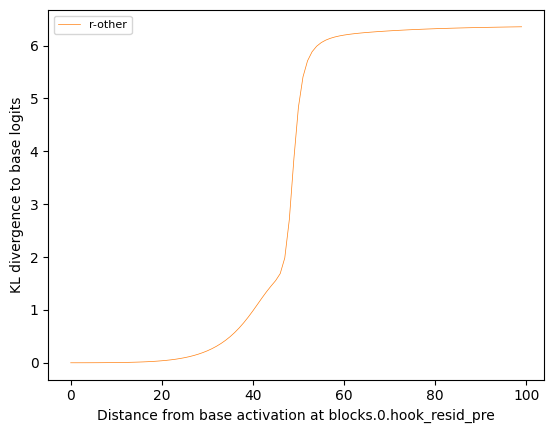

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))
sae.encode(base_ref.act)

tensor([[1.5522e-09]])
tensor([-4.1309e-05,  6.9386e-04,  6.4962e-05,  ..., -1.8521e-03,
        -1.0080e-03,  2.7401e-04])
tensor(0.0006)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
target_prompt = r_other_prompt[0]

target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

In [ ]:
direction = target_ref.act - base_ref.act
perturbed_steps = [
    base_ref.act + alpha * direction
    for alpha in torch.linspace(*perturbation_range, n_steps)
]
perturbed_activations = torch.cat(perturbed_steps, dim=0)


def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = perturbed_activations


with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    prompts = torch.cat([base_ref.prompt for _ in range(len(perturbed_activations))])
    middle_logits, middle_cache = base_ref.model.run_with_cache(prompts)
middle_logits = middle_logits.to("cpu")
middle_cache = middle_cache.to("cpu")

In [ ]:
a = base_ref.cache["blocks.1.mlp.hook_pre"][:, -1, :]
t = target_ref.cache["blocks.1.mlp.hook_pre"][:, -1, :]
m = middle_cache["blocks.1.mlp.hook_pre"][:, -1, :]

In [ ]:
(m[0]-a[0]).sum()

tensor(5.4725e-06)

In [ ]:
(m[-1]-t[0]).sum()

tensor(-69.8362)

In [ ]:
read_layer_mlp = "blocks.0.mlp.hook_pre"
a = base_ref.cache[read_layer_mlp][:, -1, :]
t = target_ref.cache[read_layer_mlp][:, -1, :]
m = middle_cache[read_layer_mlp][:, -1, :]

In [ ]:
(m[0]-a[0]).sum()

tensor(-7.0239e-05)

In [ ]:
(m[-1]-t[0]).sum()

tensor(-33.5782)

In [ ]:
read_layer_mlp = f"blocks.{perturbation_layer_number}.mlp.hook_pre"
a = base_ref.cache[read_layer_mlp][:, -1, :]
t = target_ref.cache[read_layer_mlp][:, -1, :]
m = middle_cache[read_layer_mlp][:, -1, :]

In [ ]:
rand_token = generate_prompt(dataset, n_ctx=1)
target_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))


target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

ValueError: not enough values to unpack (expected 2, got 1)

In [ ]:
target_prompt.shape

torch.Size([2])

In [ ]:
base_ref.prompt.shape

torch.Size([1, 10])

In [ ]:
target_prompt

tensor([8523,  262])

In [ ]:
base_ref.prompt

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])

In [ ]:
base_ref.prompt[0]

tensor([  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523])

In [ ]:
rand_token

tensor([[262]])

In [ ]:
rand_token[0]

tensor([262])

In [ ]:
target_prompt

tensor([8523,  262])

In [ ]:
rand_token = generate_prompt(dataset, n_ctx=1)
target_prompt = torch.cat((base_ref.prompt.clone()[0:-1][0], rand_token[0]))


target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

IndexError: index 0 is out of bounds for dimension 0 with size 0

In [ ]:
rand_token = generate_prompt(dataset, n_ctx=1)
target_prompt = torch.cat((base_ref.prompt.clone()[0][0:-1], rand_token[0]))


target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

ValueError: not enough values to unpack (expected 2, got 1)

In [ ]:
target_prompt

tensor([  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,   262])

In [ ]:
rand_token = generate_prompt(dataset, n_ctx=1)
target_prompt = torch.cat((base_ref.prompt.clone()[0][0:-1], rand_token[0])).unsqueeze(0)


target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

In [ ]:
direction = target_ref.act - base_ref.act
perturbed_steps = [
    base_ref.act + alpha * direction
    for alpha in torch.linspace(*perturbation_range, n_steps)
]
perturbed_activations = torch.cat(perturbed_steps, dim=0)


def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = perturbed_activations


with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    prompts = torch.cat([base_ref.prompt for _ in range(len(perturbed_activations))])
    middle_logits, middle_cache = base_ref.model.run_with_cache(prompts)
middle_logits = middle_logits.to("cpu")
middle_cache = middle_cache.to("cpu")

In [ ]:
read_layer_mlp = f"blocks.{perturbation_layer_number}.mlp.hook_pre"
a = base_ref.cache[read_layer_mlp][:, -1, :]
t = target_ref.cache[read_layer_mlp][:, -1, :]
m = middle_cache[read_layer_mlp][:, -1, :]

In [ ]:
(m[0]-a[0]).sum()

tensor(-7.0239e-05)

In [ ]:
(m[-1]-t[0]).sum()

tensor(0.0003)

In [ ]:
read_layer_mlp = f"blocks.{perturbation_layer_number}.mlp.hook_post"
a = base_ref.cache[read_layer_mlp][:, -1, :]
t = target_ref.cache[read_layer_mlp][:, -1, :]
m = middle_cache[read_layer_mlp][:, -1, :]

In [ ]:
(m[0]-a[0]).sum()

tensor(-1.5515e-06)

In [ ]:
(m[-1]-t[0]).sum()

tensor(-8.9834e-06)

In [ ]:
n_steps = 101
rand_token = generate_prompt(dataset, n_ctx=1)
target_prompt = torch.cat((base_ref.prompt.clone()[0][0:-1], rand_token[0])).unsqueeze(0)


target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

In [ ]:
direction = target_ref.act - base_ref.act
perturbed_steps = [
    base_ref.act + alpha * direction
    for alpha in torch.linspace(*perturbation_range, n_steps)
]
perturbed_activations = torch.cat(perturbed_steps, dim=0)


def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = perturbed_activations


with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    prompts = torch.cat([base_ref.prompt for _ in range(len(perturbed_activations))])
    middle_logits, middle_cache = base_ref.model.run_with_cache(prompts)
middle_logits = middle_logits.to("cpu")
middle_cache = middle_cache.to("cpu")

In [ ]:
read_layer_mlp = f"blocks.{perturbation_layer_number}.mlp.hook_post"
a = base_ref.cache[read_layer_mlp][:, -1, :]
t = target_ref.cache[read_layer_mlp][:, -1, :]
m = middle_cache[read_layer_mlp][:, -1, :]

In [ ]:
(m[0]-a[0]).sum()

tensor(-1.5515e-06)

In [ ]:
(m[-1]-t[0]).sum()

tensor(6.0172e-07)

In [ ]:
a[0].shape

torch.Size([3072])

In [ ]:
read_layer_mlp = f"blocks.{perturbation_layer_number}.mlp.hook_pre"
a = base_ref.cache[read_layer_mlp][:, -1, :]
t = target_ref.cache[read_layer_mlp][:, -1, :]
m = middle_cache[read_layer_mlp][:, -1, :]

In [ ]:
(m[50] - (a[0]+t[0])*0.5).sum()

tensor(142.8212)

In [ ]:
print(a[0][:20])
print(t[0][:20])
print(m[50][:20])


tensor([ 0.2969, -0.7697, -1.5433, -0.8285,  0.5946, -0.6152, -1.6803, -0.6241,
        -0.4668,  0.0781, -1.5963, -1.1792,  0.2895, -0.9316, -0.5717, -0.4498,
        -0.1193, -0.9778, -3.0152, -0.9122])
tensor([ 0.2217, -0.7528, -1.0180, -0.2305, -0.1671,  0.3062, -2.2132, -0.1128,
        -0.6597,  0.5446, -1.7353, -1.4933,  0.0489,  0.3363,  0.6338, -0.3897,
        -0.5918, -1.6283, -1.5161, -0.3025])
tensor([ 0.2750, -0.6861, -1.2875, -0.4570,  0.2669, -0.0602, -1.9713, -0.1246,
        -0.5053,  0.3797, -1.6486, -1.2482,  0.2563, -0.2277,  0.1136, -0.3662,
        -0.2852, -1.3384, -2.2774, -0.5508])


In [ ]:
print(m[50][:20])
print((a[0]+t[0])*0.5)

tensor([ 0.2750, -0.6861, -1.2875, -0.4570,  0.2669, -0.0602, -1.9713, -0.1246,
        -0.5053,  0.3797, -1.6486, -1.2482,  0.2563, -0.2277,  0.1136, -0.3662,
        -0.2852, -1.3384, -2.2774, -0.5508])
tensor([ 0.2593, -0.7613, -1.2807,  ..., -1.4836, -0.1683, -0.8380])


In [ ]:
print(m[50][:20])
print(((a[0]+t[0])*0.5)[:20])

tensor([ 0.2750, -0.6861, -1.2875, -0.4570,  0.2669, -0.0602, -1.9713, -0.1246,
        -0.5053,  0.3797, -1.6486, -1.2482,  0.2563, -0.2277,  0.1136, -0.3662,
        -0.2852, -1.3384, -2.2774, -0.5508])
tensor([ 0.2593, -0.7613, -1.2807, -0.5295,  0.2137, -0.1545, -1.9467, -0.3685,
        -0.5633,  0.3114, -1.6658, -1.3363,  0.1692, -0.2976,  0.0310, -0.4198,
        -0.3556, -1.3031, -2.2657, -0.6074])


In [ ]:
(m[50] - (a[0]+t[0])*0.5).abs().sum()

tensor(197.8027)

In [ ]:
(m[50] - (a[0]+t[0])*0.5)[:50]

tensor([ 0.0157,  0.0752, -0.0068,  0.0725,  0.0531,  0.0942, -0.0245,  0.2439,
         0.0579,  0.0683,  0.0172,  0.0881,  0.0870,  0.0699,  0.0826,  0.0535,
         0.0703, -0.0353, -0.0117,  0.0566,  0.0488,  0.0668,  0.0472,  0.1541,
         0.0348,  0.0856, -0.0290,  0.0549,  0.0767,  0.0566, -0.0419,  0.0902,
         0.0610, -0.0778,  0.0270,  0.0678,  0.1404, -0.0929,  0.0299,  0.0085,
         0.1523,  0.1056, -0.0117,  0.0250, -0.0567,  0.0832,  0.0619,  0.0410,
         0.0184,  0.0571])

In [ ]:
(perturbed_activations[50] - (base_ref.act + target_ref.act) * 0.5).abs().sum()

tensor(8.1165e-07)

In [ ]:
diff_in_exp = (m[50] - (a[0]+t[0])*0.5)

In [ ]:
diff_in_exp

tensor([ 0.0157,  0.0752, -0.0068,  ...,  0.1383,  0.0312, -0.0786])

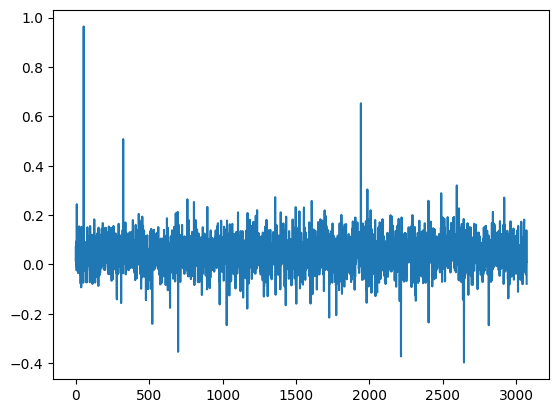

In [ ]:
plt.plot(diff_in_exp)

In [ ]:
torch.diff(m)

tensor([[-1.0667, -0.7736,  0.7149,  ..., -1.2112,  0.8821, -0.1526],
        [-1.0638, -0.7704,  0.7162,  ..., -1.1957,  0.8903, -0.1652],
        [-1.0609, -0.7673,  0.7177,  ..., -1.1803,  0.8984, -0.1779],
        ...,
        [-0.9695, -0.2824,  0.7950,  ..., -0.0743,  1.7214, -1.1815],
        [-0.9720, -0.2738,  0.7913,  ..., -0.0702,  1.7349, -1.1843],
        [-0.9746, -0.2651,  0.7875,  ..., -0.0662,  1.7485, -1.1868]])

In [ ]:
torch.diff(m,dim=-1)

tensor([[-1.0667, -0.7736,  0.7149,  ..., -1.2112,  0.8821, -0.1526],
        [-1.0638, -0.7704,  0.7162,  ..., -1.1957,  0.8903, -0.1652],
        [-1.0609, -0.7673,  0.7177,  ..., -1.1803,  0.8984, -0.1779],
        ...,
        [-0.9695, -0.2824,  0.7950,  ..., -0.0743,  1.7214, -1.1815],
        [-0.9720, -0.2738,  0.7913,  ..., -0.0702,  1.7349, -1.1843],
        [-0.9746, -0.2651,  0.7875,  ..., -0.0662,  1.7485, -1.1868]])

In [ ]:
torch.diff(m,dim=-1).shape

torch.Size([101, 3071])

In [ ]:
torch.diff(m,dim=0).shape

torch.Size([100, 3072])

In [ ]:
torch.diff(m,dim=0).sum(dim=-1)

tensor([10.1352, 10.1070, 10.0735, 10.0365,  9.9952,  9.9494,  9.8988,  9.8446,
         9.7854,  9.7227,  9.6557,  9.5848,  9.5098,  9.4323,  9.3500,  9.2649,
         9.1769,  9.0866,  8.9933,  8.8977,  8.8013,  8.7019,  8.6025,  8.5020,
         8.4005,  8.2994,  8.1983,  8.0978,  7.9975,  7.8986,  7.8010,  7.7047,
         7.6100,  7.5172,  7.4251,  7.3363,  7.2484,  7.1624,  7.0774,  6.9944,
         6.9129,  6.8315,  6.7516,  6.6715,  6.5916,  6.5115,  6.4302,  6.3490,
         6.2652,  6.1799,  6.0929,  6.0031,  5.9101,  5.8144,  5.7155,  5.6118,
         5.5050,  5.3938,  5.2780,  5.1583,  5.0341,  4.9052,  4.7712,  4.6339,
         4.4913,  4.3454,  4.1935,  4.0392,  3.8805,  3.7183,  3.5533,  3.3840,
         3.2126,  3.0393,  2.8626,  2.6845,  2.5052,  2.3235,  2.1418,  1.9586,
         1.7751,  1.5912,  1.4078,  1.2245,  1.0407,  0.8585,  0.6769,  0.4968,
         0.3174,  0.1397, -0.0360, -0.2106, -0.3832, -0.5537, -0.7222, -0.8882,
        -1.0521, -1.2131, -1.3722, -1.52

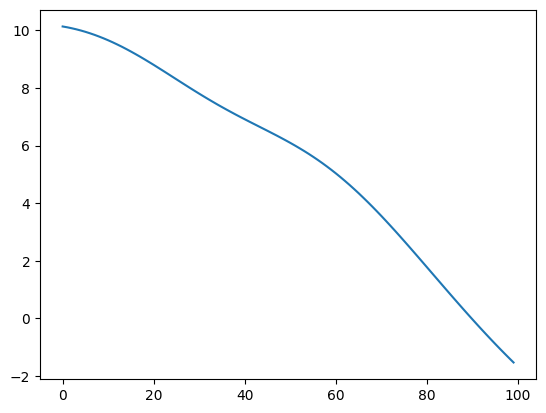

In [ ]:
plt.plot(torch.diff(m,dim=0).sum(dim=-1))

In [ ]:
num_elements_a = (a > 0).sum().item()

In [ ]:
num_elements_a

648

In [ ]:
print((t > 0).sum().item())

942


In [ ]:
print((m[50] > 0).sum().item())

804


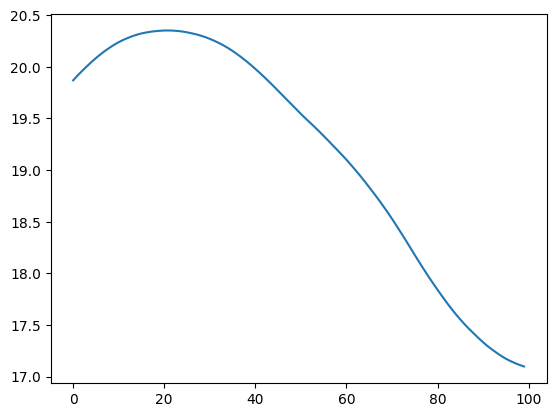

In [ ]:
plt.plot(torch.diff(m,dim=0).abs().sum(dim=-1))

In [ ]:
print(a.abs().sum())

tensor(2496.5825)


In [ ]:
print(t.abs().sum())

tensor(2304.5618)


In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
# model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
model = HookedTransformer.from_pretrained("gpt2")

device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.91 GB


100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

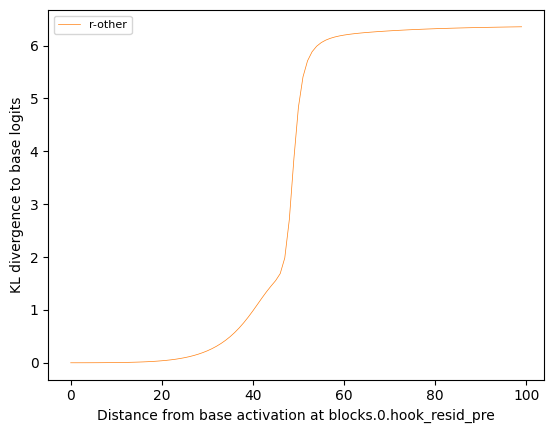

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))
sae.encode(base_ref.act)

tensor([[1.5522e-09]])
tensor([-4.1309e-05,  6.9386e-04,  6.4962e-05,  ..., -1.8521e-03,
        -1.0080e-03,  2.7401e-04])
tensor(0.0006)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
n_steps = 101
rand_token = generate_prompt(dataset, n_ctx=1)
target_prompt = torch.cat((base_ref.prompt.clone()[0][0:-1], rand_token[0])).unsqueeze(
    0
)


target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

In [ ]:
direction = target_ref.act - base_ref.act
perturbed_steps = [
    base_ref.act + alpha * direction
    for alpha in torch.linspace(*perturbation_range, n_steps)
]
perturbed_activations = torch.cat(perturbed_steps, dim=0)


def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = perturbed_activations


with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    prompts = torch.cat([base_ref.prompt for _ in range(len(perturbed_activations))])
    middle_logits, middle_cache = base_ref.model.run_with_cache(prompts)
middle_logits = middle_logits.to("cpu")
middle_cache = middle_cache.to("cpu")

In [ ]:
read_layer_mlp = f"blocks.{perturbation_layer_number}.mlp.hook_pre"
a = base_ref.cache[read_layer_mlp][:, -1, :]
t = target_ref.cache[read_layer_mlp][:, -1, :]
m = middle_cache[read_layer_mlp][:, -1, :]

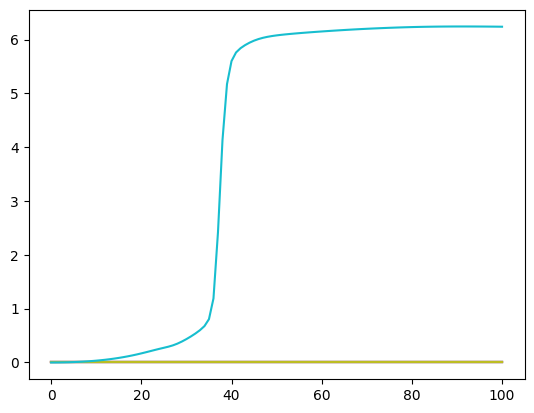

In [ ]:
kl_div = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)
kl_div_target = compute_kl_div(logits_ref=base_ref.logits, logits_pert=target_ref.logits)

plt.plot(kl_div)
plt.plot(kl_div_target)

In [ ]:
base_ref.logits

tensor([[[ 5.6629,  5.9329,  1.6200,  ...,  0.1404,  0.3687,  4.8720],
         [ 4.9456,  4.7598, -1.1059,  ...,  0.4898,  2.1496,  3.1064],
         [ 0.5450,  3.0783,  0.3773,  ...,  0.8267, -0.1660,  2.6201],
         ...,
         [10.6949, 10.4384,  3.3325,  ..., -0.0136,  0.4998,  8.5515],
         [ 4.1553,  6.0022, -0.6531,  ...,  0.2299, -0.2417,  1.7745],
         [ 4.8473,  7.4063, -0.6574,  ...,  1.2490,  3.3542,  4.1477]]])

In [ ]:
target_ref.logits)

SyntaxError: unmatched ')' (<ipython-input-231-7f215ce7a711>, line 1)

In [ ]:
target_ref.logits

tensor([[[ 5.6629,  5.9329,  1.6200,  ...,  0.1404,  0.3687,  4.8720],
         [ 4.9456,  4.7598, -1.1059,  ...,  0.4898,  2.1496,  3.1064],
         [ 0.5450,  3.0783,  0.3773,  ...,  0.8267, -0.1660,  2.6201],
         ...,
         [10.6949, 10.4384,  3.3325,  ..., -0.0136,  0.4998,  8.5515],
         [ 4.1553,  6.0022, -0.6531,  ...,  0.2299, -0.2417,  1.7745],
         [ 0.4007,  3.6502, -0.3836,  ...,  0.1660, -2.3018,  1.3655]]])

In [ ]:
base_ref.act

tensor([[[-0.0539,  0.0598,  0.1534,  0.0068,  0.2346, -0.0361, -0.3119,
           0.0593,  0.0077,  0.0218,  0.0737,  0.0345,  0.0526, -0.2764,
           0.2592,  0.0345, -0.0656,  0.1687, -0.0573,  0.5458, -0.2254,
          -0.1517,  0.0222, -0.0706,  0.0999, -0.0069,  0.0614, -0.1877,
           0.0209,  0.1230, -0.1113, -0.1155, -0.0286,  0.0164,  0.0828,
           0.2035, -0.5592, -0.0020, -0.1394, -0.0183, -0.0453, -0.2003,
          -0.0232, -0.0213, -0.0949,  0.0196,  0.0283,  0.1921,  0.1268,
          -0.5375, -0.1361, -0.1831,  0.1935, -0.0243,  0.1104, -0.3064,
          -0.0564,  0.0161,  0.1316,  0.0994,  0.1679,  0.1986, -0.0463,
          -0.0371,  0.1496,  0.0332,  0.1206, -0.2692,  0.0097, -0.1411,
          -0.0014, -0.1344,  0.0692,  0.1302,  0.1649, -0.0973,  0.1896,
           0.2294, -0.1110, -0.0365, -0.0699,  0.0078, -0.0884,  0.0694,
           0.1542, -0.0041, -0.8585,  0.1455,  0.0673,  0.1144, -0.1589,
          -0.0299, -0.0084, -0.0177,  0.1167, -0.02

In [ ]:
target_ref.act

tensor([[[-3.1866e-02,  9.6614e-03,  1.6240e-01,  4.2171e-02, -3.9388e-02,
          -4.8857e-02, -2.5476e-01,  2.7059e-02,  3.1556e-02,  4.5378e-02,
          -5.3507e-02, -5.6579e-02,  5.6543e-02,  7.6183e-04, -2.7144e-03,
          -6.3252e-02, -3.7510e-02, -2.8073e-02,  9.9227e-03,  4.4993e-01,
           4.2918e-02, -1.0400e-02,  8.1045e-02, -1.3022e-02, -4.5682e-02,
           2.8076e-02, -5.2764e-03, -8.4581e-02, -5.0385e-02,  7.5158e-02,
           5.0399e-02,  3.8571e-02, -4.6410e-02,  9.7555e-02,  6.0898e-02,
           3.1094e-02, -5.5859e-01, -1.3578e-02, -5.5636e-02,  2.2259e-02,
           1.3159e-02,  2.7817e-02, -5.7872e-02,  6.0001e-02,  1.2280e-02,
          -4.6592e-02,  6.3524e-02,  4.3738e-02, -5.6233e-02, -5.9489e-01,
          -2.7784e-02,  2.9291e-02,  9.5987e-02,  5.9959e-02,  3.7000e-02,
          -3.0467e-01, -2.2798e-02, -2.7899e-02,  5.5879e-02,  8.9537e-02,
           2.8335e-02,  2.6595e-02,  3.6307e-02,  1.6981e-02, -5.6689e-01,
           1.2372e-02,  6

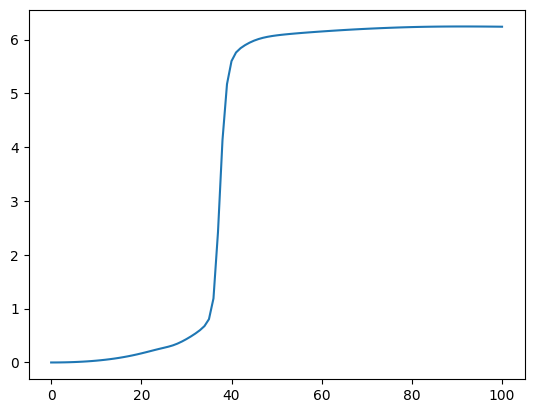

In [ ]:
kl_div = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=base_ref.logits, logits_pert=target_ref.logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

plt.plot(kl_div)
plt.plot(kl_div_target)

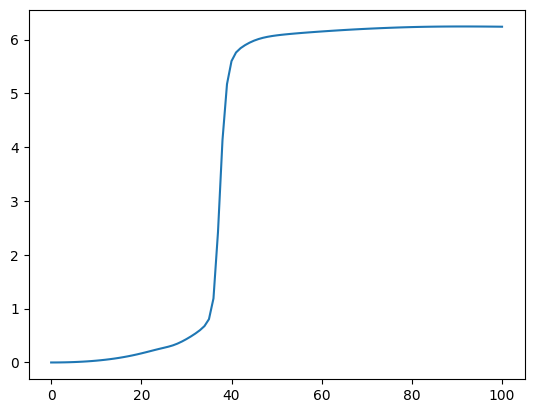

In [ ]:
kl_div = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=base_ref.logits, logits_pert=target_ref.logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

plt.plot(kl_div)

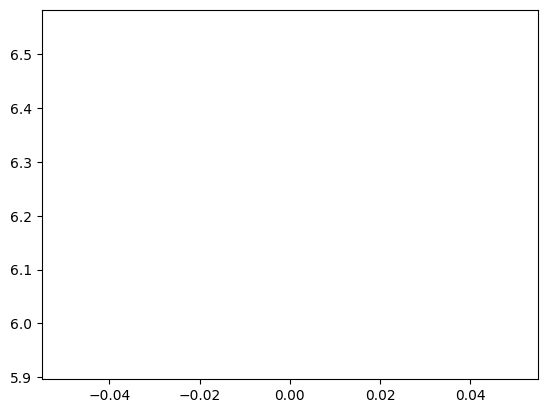

In [ ]:
plt.plot(kl_div_target)

In [ ]:
kl_div_target

tensor([6.2394])

In [ ]:
kl_div[-1]

tensor(6.2394)

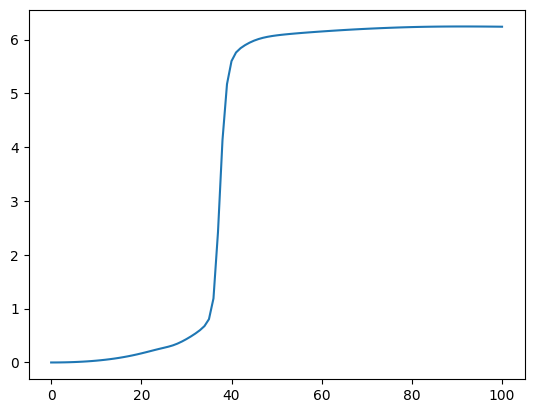

In [ ]:
kl_div = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

plt.plot(kl_div)

In [ ]:
model.to_str_token(base_ref.prompt)

AttributeError: 'HookedTransformer' object has no attribute 'to_str_token'

In [ ]:
model.to_str_tokens(base_ref.prompt)

[' her',
 ' as',
 ' the',
 ' kid',
 ' about',
 ' whom',
 ' parents',
 ' complain',
 ' with',
 ' barely']

In [ ]:
model.to_str_tokens(target_ref.prompt)

[' her',
 ' as',
 ' the',
 ' kid',
 ' about',
 ' whom',
 ' parents',
 ' complain',
 ' with',
 ' the']

In [ ]:
torch.norm(base_ref.act - target_ref.act)

tensor(3.7563)

In [ ]:
torch.norm(base_ref.act)

tensor(4.8946)

In [ ]:
torch.norm(target_ref.act)

tensor(4.7358)

In [ ]:
cosine_similarity(base_ref.act, target_ref.act)

RuntimeError: 1D tensors expected, but got 3D and 3D tensors

In [ ]:
cosine_similarity(base_ref.act.squeeze(0).squeeze(0), target_ref.act.squeeze(0).squeeze(0))

0.6961829662322998

In [ ]:
kl_div_base = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
    :, base_ref.perturbation_pos
].squeeze(-1)[::-1]

plt.plot(kl_div)
plt.plot(kl_div_target)

In [ ]:
kl_div_base = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
    :, base_ref.perturbation_pos
].squeeze(-1)[::-1]

plt.plot(kl_div)
plt.plot(kl_div_target)

ValueError: step must be greater than zero

In [ ]:
kl_div_target

tensor([6.2394])

In [ ]:
kl_div_base = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=target_ref.logits, logits_pert=middle_logits)[
    :, base_ref.perturbation_pos
].squeeze(-1)[::-1]

plt.plot(kl_div)
plt.plot(kl_div_target)

ValueError: step must be greater than zero

In [ ]:
kl_div_base = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=target_ref.logits, logits_pert=middle_logits)[
    :, base_ref.perturbation_pos
].squeeze(-1)[::-1]

plt.plot(kl_div)
plt.plot(kl_div_target)

ValueError: step must be greater than zero

In [ ]:
kl_div_target

tensor([6.2394])

In [ ]:
kl_div

tensor([9.5488e-08, 2.7616e-04, 1.1293e-03, 2.5942e-03, 4.7160e-03, 7.5313e-03,
        1.1086e-02, 1.5425e-02, 2.0596e-02, 2.6652e-02, 3.3645e-02, 4.1639e-02,
        5.0693e-02, 6.0875e-02, 7.2261e-02, 8.4915e-02, 9.8914e-02, 1.1431e-01,
        1.3114e-01, 1.4939e-01, 1.6897e-01, 1.8967e-01, 2.1106e-01, 2.3253e-01,
        2.5333e-01, 2.7316e-01, 2.9349e-01, 3.1806e-01, 3.5011e-01, 3.8947e-01,
        4.3445e-01, 4.8413e-01, 5.3877e-01, 6.0013e-01, 6.7593e-01, 8.0498e-01,
        1.1896e+00, 2.4205e+00, 4.1330e+00, 5.1727e+00, 5.6005e+00, 5.7604e+00,
        5.8401e+00, 5.8967e+00, 5.9429e+00, 5.9805e+00, 6.0105e+00, 6.0338e+00,
        6.0520e+00, 6.0664e+00, 6.0782e+00, 6.0883e+00, 6.0971e+00, 6.1052e+00,
        6.1126e+00, 6.1197e+00, 6.1264e+00, 6.1329e+00, 6.1392e+00, 6.1452e+00,
        6.1511e+00, 6.1569e+00, 6.1624e+00, 6.1678e+00, 6.1731e+00, 6.1782e+00,
        6.1831e+00, 6.1878e+00, 6.1924e+00, 6.1967e+00, 6.2009e+00, 6.2049e+00,
        6.2087e+00, 6.2123e+00, 6.2157e+

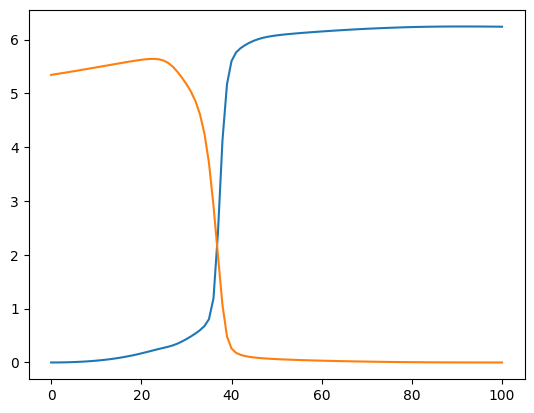

In [ ]:
kl_div_base = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=target_ref.logits, logits_pert=middle_logits)[
    :, base_ref.perturbation_pos
].squeeze(-1)

plt.plot(kl_div)
plt.plot(kl_div_target)

In [ ]:
kl_div_target

tensor([ 5.3445e+00,  5.3575e+00,  5.3708e+00,  5.3843e+00,  5.3981e+00,
         5.4120e+00,  5.4261e+00,  5.4403e+00,  5.4547e+00,  5.4692e+00,
         5.4838e+00,  5.4984e+00,  5.5131e+00,  5.5278e+00,  5.5424e+00,
         5.5570e+00,  5.5715e+00,  5.5858e+00,  5.5996e+00,  5.6128e+00,
         5.6248e+00,  5.6347e+00,  5.6411e+00,  5.6416e+00,  5.6326e+00,
         5.6088e+00,  5.5645e+00,  5.4953e+00,  5.4025e+00,  5.2939e+00,
         5.1737e+00,  5.0346e+00,  4.8579e+00,  4.6129e+00,  4.2529e+00,
         3.7092e+00,  2.9164e+00,  1.9846e+00,  1.0643e+00,  4.8358e-01,
         2.5946e-01,  1.7959e-01,  1.4211e-01,  1.1973e-01,  1.0451e-01,
         9.3297e-02,  8.4596e-02,  7.7604e-02,  7.1813e-02,  6.6877e-02,
         6.2553e-02,  5.8682e-02,  5.5154e-02,  5.1891e-02,  4.8847e-02,
         4.5986e-02,  4.3280e-02,  4.0713e-02,  3.8269e-02,  3.5939e-02,
         3.3712e-02,  3.1582e-02,  2.9544e-02,  2.7591e-02,  2.5719e-02,
         2.3928e-02,  2.2213e-02,  2.0573e-02,  1.9

In [ ]:
kl_div_target[::-1]

ValueError: step must be greater than zero

In [ ]:
kl_div_base = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=target_ref.logits, logits_pert=middle_logits)[
    :, base_ref.perturbation_pos
].squeeze(-1)
kl_div_target_reversed = kl_div_target[::-1]

plt.plot(kl_div)
plt.plot(kl_div_target_reversed)

ValueError: step must be greater than zero

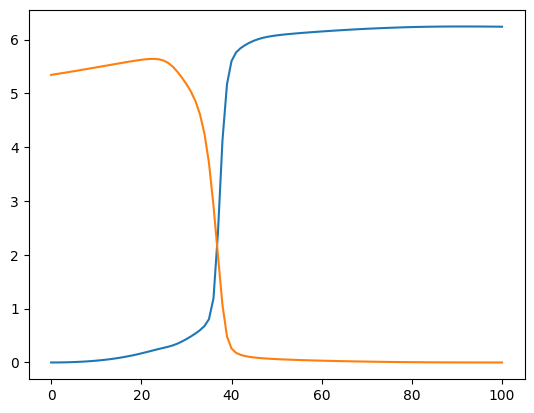

In [ ]:
kl_div_base = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=target_ref.logits, logits_pert=middle_logits)[
    :, base_ref.perturbation_pos
].squeeze(-1)

plt.plot(kl_div)
plt.plot(kl_div_target)

In [ ]:
kl_div_target[80]

tensor(0.0056)

In [ ]:
kl_div_target[60]

tensor(0.0337)

In [ ]:
kl_div_target[450]

IndexError: index 450 is out of bounds for dimension 0 with size 101

In [ ]:
kl_div_target[45]

tensor(0.0933)

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = False
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
# model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
model = HookedTransformer.from_pretrained("gpt2")

device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 1.91 GB


100%|██████████| 1/1 [00:00<00:00, 16320.25it/s]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

In [ ]:
# additive_perturbation = True

# predefined_other_prompts = r_other_prompt

# predefined_other_perturbation = PredefinedActivationPerturbation(
#     base_ref, dataset, predefined_other_prompts
# )

# kl_div = run_perturbation(base_ref, predefined_other_perturbation, sae)

In [ ]:
print(torch.mean(base_ref.act, dim=-1))
print(torch.mean(sae.W_dec, dim=-1))
print(torch.mean(sae.b_dec, dim=-1))
sae.encode(base_ref.act)

tensor([[1.5522e-09]])
tensor([-4.1309e-05,  6.9386e-04,  6.4962e-05,  ..., -1.8521e-03,
        -1.0080e-03,  2.7401e-04])
tensor(0.0006)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.]]])

In [ ]:
n_steps = 101
rand_token = generate_prompt(dataset, n_ctx=1)
target_prompt = torch.cat((base_ref.prompt.clone()[0][0:-1], rand_token[0])).unsqueeze(
    0
)


target_ref = Reference(
    model,
    target_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)

In [ ]:
direction = target_ref.act - base_ref.act
perturbed_steps = [
    base_ref.act + alpha * direction
    for alpha in torch.linspace(*perturbation_range, n_steps)
]
perturbed_activations = torch.cat(perturbed_steps, dim=0)


def hook(act, hook):
    act[:, base_ref.perturbation_pos, :] = perturbed_activations


with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
    prompts = torch.cat([base_ref.prompt for _ in range(len(perturbed_activations))])
    middle_logits, middle_cache = base_ref.model.run_with_cache(prompts)
middle_logits = middle_logits.to("cpu")
middle_cache = middle_cache.to("cpu")

In [ ]:
read_layer_mlp = f"blocks.{perturbation_layer_number}.mlp.hook_pre"
a = base_ref.cache[read_layer_mlp][:, -1, :]
t = target_ref.cache[read_layer_mlp][:, -1, :]
m = middle_cache[read_layer_mlp][:, -1, :]

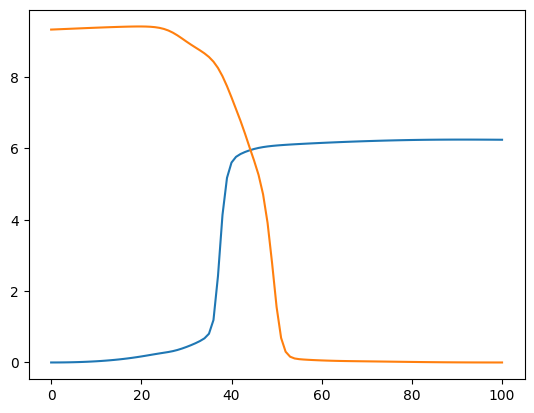

In [ ]:
kl_div_base = compute_kl_div(logits_ref=base_ref.logits, logits_pert=middle_logits)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)
kl_div_target = compute_kl_div(logits_ref=target_ref.logits, logits_pert=middle_logits)[
    :, base_ref.perturbation_pos
].squeeze(-1)

plt.plot(kl_div)
plt.plot(kl_div_target)

In [ ]:
model.to_str_tokens(target_prompt)

[' her',
 ' as',
 ' the',
 ' kid',
 ' about',
 ' whom',
 ' parents',
 ' complain',
 ' with',
 '.']

In [ ]:
import random
from abc import ABC, abstractmethod
from collections import defaultdict
from dataclasses import dataclass, field
from typing import cast, final

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
import torch.nn.functional as F
from datasets import Dataset, load_dataset
from jaxtyping import Float
from sae_lens.toolkit.pretrained_saes import get_gpt2_res_jb_saes
from torch.distributions.multivariate_normal import MultivariateNormal
from tqdm import tqdm
from transformer_lens import HookedTransformer

In [ ]:
# Config
n_ctx = 10
perturbation_layer_number = 0
perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
seed = 688
dataloader_batch_size = 15
perturbation_pos = slice(-1, None, 1)
read_layer = "blocks.11.hook_resid_post"
perturbation_range = (0.0, 1.0)  # (0.0, np.pi)
n_steps = 100
mean_batch_size = 300
sae_threshold = 0.05  # 0.05

NORMALIZE = False
if NORMALIZE:
    MEAN_NORMALIZE = True
# ADDITIVE_PERTURBATION = False #TODO: change back
additive_perturbation = False
# if additive_perturbation: #TODO: change back
ADDITIVE_ORIGIN = True

R_OTHER = True
RANDOM = False
PREDEFINED_OTHER = False
LAST_TOKEN = False
ACTIVATE_SAE_FEATURE = False
DAMPEN_FEATURE = False


SAE_RELU = True
CACHE = True

torch.set_grad_enabled(False)

In [ ]:
###############################################
# caching intermediate data
random_key = "random"
r_other_key = "r-other"
predefined_other_key = "predefined-other"
activate_sae_feature_key = "activate-sae-feature"
dampen_feature_key = "dampen-feature"
last_token_key = "last-token"

keys = [
    random_key,
    r_other_key,
    predefined_other_key,
    activate_sae_feature_key,
    dampen_feature_key,
    last_token_key,
]

# Create the dictionaries with empty lists for all keys
base_acted = {key: [] for key in keys}
base_strs = {key: [] for key in keys}
base_ids = {key: [] for key in keys}

pert_acted = {key: [] for key in keys}
pert_strs = {key: [] for key in keys}
pert_ids = {key: [] for key in keys}
pert_all_act = {key: [] for key in keys}
perturbed_max_values = {key: [] for key in keys}

target_all_act = {key: [] for key in keys}
target_ids = {key: [] for key in keys}

perturbations_only_max_values = {key: [] for key in keys}

perturbations_cache = {key: [] for key in keys}
r_other_act = []
r_other_prompt = []
# tensor([[3513,  553,  262, 8009,  531,   13,  198,  198, 1858,  547]]) base_ref.prompt, seed = 6
###############################################

In [ ]:
# standalone implementation


def set_seed(seed: int = 0):
    """Set the random seed for reproducibility."""
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)


def load_pretokenized_dataset(
    path: str,
    split: str,
) -> Dataset:
    dataset = load_dataset(path, split=split)
    dataset = cast(Dataset, dataset)
    return dataset.with_format("torch")


def get_device_str() -> str:
    if torch.backends.mps.is_available():
        return "mps"
    else:
        return "cuda" if torch.cuda.is_available() else "cpu"


class Reference:
    def __init__(
        self,
        model: HookedTransformer,
        prompt: torch.Tensor,
        perturbation_layer: str,
        read_layer: str,
        perturbation_pos: slice,
        n_ctx: int,
    ):
        self.model = model
        n_batch_prompt, n_ctx_prompt = prompt.shape
        assert (
            n_ctx == n_ctx_prompt
        ), f"n_ctx {n_ctx} must match prompt n_ctx {n_ctx_prompt}"
        self.prompt = prompt
        logits, cache = model.run_with_cache(prompt)
        self.logits = logits.to("cpu").detach()  # type: ignore
        self.cache = cache.to("cpu")
        self.act = self.cache[perturbation_layer][:, perturbation_pos]
        self.perturbation_layer = perturbation_layer
        self.read_layer = read_layer
        self.perturbation_pos = perturbation_pos
        self.n_ctx = n_ctx


def generate_prompt(dataset, n_ctx: int = 1, batch: int = 1) -> torch.Tensor:
    """Generate a prompt from the dataset."""
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch, shuffle=True)  # type: ignore
    return next(iter(dataloader))["input_ids"][:, :n_ctx]


def get_random_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random activation from the dataset."""
    rand_prompt = generate_prompt(dataset, n_ctx=n_ctx)
    # TODO: change back
    read_prompt = torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848])
    r_other_prompt.append(rand_prompt)
    logits, cache = model.run_with_cache(rand_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def get_predefined_activation(
    model: HookedTransformer,
    dataset: Dataset,
    n_ctx: int,
    layer: str,
    pos: int,
    prompt: torch.Tensor,
) -> torch.Tensor:
    """Get an activation from predefined prompt."""
    logits, cache = model.run_with_cache(prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    r_other_act.append(ret)
    return ret


def get_last_token_activation(
    model: HookedTransformer, dataset: Dataset, n_ctx: int, layer: str, pos
) -> torch.Tensor:
    """Get a random last token activation from the dataset."""
    rand_token = generate_prompt(dataset, n_ctx=1)
    last_token_prompt = torch.cat((base_ref.prompt.clone()[:, -1:][0], rand_token[0]))
    logits, cache = model.run_with_cache(last_token_prompt)
    ret = cache[layer][:, pos, :].to("cpu").detach()
    return ret


def calculate_step_of_A_to_T(A, T):
    P = A - T
    p_norm = torch.norm(P)
    A_norm = torch.norm(A)
    rel_ratio = p_norm / A_norm
    import math

    return math.floor(rel_ratio * n_steps)


@dataclass(kw_only=True)
class Perturbation(ABC):
    key: str = field(init=False)

    @final
    def __call__(
        self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]
    ) -> Float[torch.Tensor, "... n_ctx d_model"]:
        """Ensures that all generate method has correct signature with beartype"""
        return self.generate(resid_acts)

    @abstractmethod
    def generate(self, resid_acts: Float[torch.Tensor, "... n_ctx d_model"]):
        raise NotImplementedError


@dataclass
class RandomPerturbation(Perturbation):
    """Scaled random"""

    def __init__(self, data_mean, data_cov):
        self.distrib = MultivariateNormal(data_mean.squeeze(0), data_cov)
        self.key = random_key

    def generate(self, resid_acts):
        target = self.distrib.sample(resid_acts.shape[:-1])
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class RandomActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = r_other_key

    def generate(self, resid_acts):
        target = get_random_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class PredefinedActivationPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset, predefined_prompts):
        self.base_ref = base_ref
        self.dataset = dataset
        self.predefined_prompts = predefined_prompts
        self.count = 0
        self.key = predefined_other_key

    def generate(self, resid_acts):
        if self.count >= len(self.predefined_prompts):
            raise ValueError("No more predefined prompts to perturb to")
        target = get_predefined_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
            self.predefined_prompts[self.count],
        )
        self.count += 1

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class ActivateSAEFeaturePerturbation(Perturbation):
    """Specific SAE feature activation reconstruction direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = activate_sae_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        if additive_perturbation:
            return target.unsqueeze(0).unsqueeze(0)
        else:
            return target - resid_acts


class DampeningPerturbation(Perturbation):
    """Dampening of feature(s) direction"""

    def __init__(self, targets):
        self.targets = targets
        self.count = 0
        self.key = dampen_feature_key

    def generate(self, resid_acts):
        if self.count >= len(self.targets):
            raise ValueError("No more targets to perturb to")
        target = self.targets[self.count]
        self.count += 1

        # if CACHE:  # TODO: FIX THIS, using r-other is hacky
        # r_other_act.append(target)

        if additive_perturbation:
            return target
        else:
            return target - resid_acts


class LastTokenPerturbation(Perturbation):
    """Random activation direction"""

    def __init__(self, base_ref, dataset):
        self.base_ref = base_ref
        self.dataset = dataset
        self.key = last_token_key

    def generate(self, resid_acts):
        target = get_last_token_activation(
            self.base_ref.model,
            self.dataset,
            self.base_ref.n_ctx,
            self.base_ref.perturbation_layer,
            self.base_ref.perturbation_pos,
        )
        if CACHE:
            r_other_act.append(target)
        if additive_perturbation:
            return target
        else:
            return target - resid_acts


###############################################
# Running perturbations
###############################################
def cosine_similarity(vector_a: torch.Tensor, vector_b: torch.Tensor) -> float:
    # Normalize the vectors to unit length
    vector_a_norm = vector_a / vector_a.norm(dim=-1)
    vector_b_norm = vector_b / vector_b.norm(dim=-1)
    # Calculate the dot product
    cos_sim = torch.dot(vector_a_norm, vector_b_norm)
    return cos_sim.item()


def explore_sae_space(perturbed_activations, sae):
    temp = [
        active_features_SAE(p_a.unsqueeze(0), sae, threshold=sae_threshold)
        for p_a in perturbed_activations
    ]
    pert_sae_act = [temp[i][0] for i in range(len(temp))]
    pert_sae_str = [temp[i][1] for i in range(len(temp))]
    pert_feature_acts = [temp[i][2] for i in range(len(temp))]

    ids_list = [get_ids(act) for act in pert_sae_act]
    max_values = [
        tensor.max().item() if tensor.numel() > 0 else None for tensor in pert_sae_str
    ]

    return pert_sae_act, pert_sae_str, pert_feature_acts, ids_list, max_values


def get_ids(act_features):
    return act_features.nonzero(as_tuple=True)[0]


def active_features_SAE(act, sae, threshold):
    # print("act shape in sae function:",act.shape)
    feature_acts = sae.encode(act)[0, -1, :]
    active_feature_ids = (feature_acts / feature_acts.max() > threshold).to("cpu")
    act_str = feature_acts[active_feature_ids]
    return active_feature_ids, act_str, feature_acts


def scan(
    perturbation: Perturbation,
    activations: Float[torch.Tensor, "... n_ctx d_model"],
    n_steps: int,
    range: tuple[float, float],
    sae,
) -> Float[torch.Tensor, "... n_steps 1 d_model"]:
    direction = perturbation(activations)
    if additive_perturbation and ADDITIVE_ORIGIN:
        direction = direction - sae.b_dec
    if NORMALIZE:
        if MEAN_NORMALIZE:
            direction -= torch.mean(direction, dim=-1, keepdim=True)
        direction *= torch.linalg.vector_norm(
            activations, dim=-1, keepdim=True
        ) / torch.linalg.vector_norm(direction, dim=-1, keepdim=True)
    # direction /= 3  # scale down for random
    perturbed_steps = [
        activations + alpha * direction for alpha in torch.linspace(*range, n_steps)
    ]
    perturbed_activations = torch.cat(perturbed_steps, dim=0)
    if not NORMALIZE:
        temp_dir = perturbed_steps[-1] - direction

        similarity = cosine_similarity(
            temp_dir.squeeze(0).squeeze(0), activations.squeeze(0).squeeze(0)
        )
        assert similarity > 0.999, f"Similarity is {similarity}"

    if CACHE:
        perturbations_only = [
            alpha * direction for alpha in torch.linspace(*range, n_steps)
        ]
        global base_acted, base_strs, base_ids
        global pert_acted, pert_strs, pert_all_act, pert_ids, perturbed_max_values
        global target_all_act, target_ids
        global perturbations_only_max_values

        base_acted_ret, base_strs_ret, _, base_ids_ret, _ = explore_sae_space(
            activations, sae
        )
        dict_key = perturbation.key

        base_acted[dict_key].append(base_acted_ret)
        base_strs[dict_key].append(base_strs_ret)
        base_ids[dict_key].append(base_ids_ret)
        (
            pert_acted_ret,
            pert_strs_ret,
            pert_all_act_ret,
            pert_ids_ret,
            perturbed_max_values_ret,
        ) = explore_sae_space(perturbed_activations, sae)
        pert_acted[dict_key].append(pert_acted_ret)
        pert_strs[dict_key].append(pert_strs_ret)
        pert_all_act[dict_key].append(pert_all_act_ret)
        pert_ids[dict_key].append(pert_ids_ret)
        perturbed_max_values[dict_key].append(perturbed_max_values_ret)

        _, _, target_all_act_ret, target_ids_ret, _ = explore_sae_space(
            perturbed_steps[-1], sae
        )
        target_all_act[dict_key].append(target_all_act_ret)
        target_ids[dict_key].append(target_ids_ret)

        # print(f"base active SAE feature ids: {base_ids}")

        _, _, _, _, perturbations_only_max_values_ret = explore_sae_space(
            perturbations_only, sae
        )
        perturbations_only_max_values[dict_key].append(
            perturbations_only_max_values_ret
        )
    if CACHE:
        global perturbations_cache
        perturbations_cache[perturbation.key].append(perturbed_activations)

    return perturbed_activations


def run_perturbed_activation(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
):
    def hook(act, hook):
        act[:, base_ref.perturbation_pos, :] = perturbed_activations

    with base_ref.model.hooks(fwd_hooks=[(base_ref.perturbation_layer, hook)]):
        prompts = torch.cat(
            [base_ref.prompt for _ in range(len(perturbed_activations))]
        )
        logits_pert, cache = base_ref.model.run_with_cache(prompts)

    return logits_pert.to("cpu").detach(), cache.to("cpu")  # type: ignore


def compute_kl_div(logits_ref: torch.Tensor, logits_pert: torch.Tensor) -> torch.Tensor:
    """Compute the KL divergence between the reference and perturbed logprobs."""
    logprobs_ref = F.log_softmax(logits_ref, dim=-1)
    logprobs_pert = F.log_softmax(logits_pert, dim=-1)
    return F.kl_div(logprobs_pert, logprobs_ref, log_target=True, reduction="none").sum(
        dim=-1
    )


def compare(
    base_ref: Reference,
    perturbed_activations: Float[torch.Tensor, "... n_steps 1 d_model"],
) -> Float[torch.Tensor, "n_steps"]:
    logits_pert, cache = run_perturbed_activation(base_ref, perturbed_activations)
    kl_div = compute_kl_div(base_ref.logits, logits_pert)[
        :, base_ref.perturbation_pos
    ].squeeze(-1)

    return kl_div


def run_perturbation(base_ref: Reference, perturbation: Perturbation, sae=None):
    perturbed_activations = scan(
        perturbation=perturbation,
        activations=base_ref.act,
        n_steps=n_steps,
        range=perturbation_range,
        sae=sae,
    )

    kl_div = compare(base_ref, perturbed_activations)
    return kl_div

In [ ]:
set_seed(seed)

dataset = load_pretokenized_dataset(
    path="apollo-research/Skylion007-openwebtext-tokenizer-gpt2", split="train"
)
dataloader = torch.utils.data.DataLoader(  # type: ignore
    dataset, batch_size=dataloader_batch_size, shuffle=True
)

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/73 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/75 [00:00<?, ?it/s]

In [ ]:
# model = HookedTransformer.from_pretrained("gpt2", center_writing_weights=False)
model = HookedTransformer.from_pretrained("gpt2")

device = get_device_str()

print(device)

Loaded pretrained model gpt2 into HookedTransformer
cuda


In [ ]:
base_prompt = generate_prompt(dataset, n_ctx=n_ctx)
base_ref = Reference(
    model,
    base_prompt,
    perturbation_layer,
    read_layer,
    perturbation_pos,
    n_ctx,
)
print(base_prompt)

tensor([[  607,   355,   262,  5141,   546,  4150,  3397, 13121,   351,  8523]])


In [ ]:
sae = get_gpt2_res_jb_saes(perturbation_layer)[0][perturbation_layer].to("cpu")


if not SAE_RELU:
    sae.turn_off_activation()

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


In [ ]:
# Related to created normalised random
# Some experiment specific utils for converting a cov matrix
# to positive definite (we suspect it's because of smaller
# batch size) needed for MultivariateNormal


def is_positive_definite(A):
    try:
        torch.linalg.cholesky(A)
        return True
    except RuntimeError:
        return False


def nearest_positive_definite(A):
    B = (A + A.T) / 2
    _, s, V = torch.svd(B)
    H = V.mm(torch.diag(s).mm(V.T))
    A2 = (B + H) / 2
    A3 = (A2 + A2.T) / 2
    if is_positive_definite(A3):
        return A3
    spacing = np.geomspace(torch.finfo(A.dtype).eps, 1, 10)
    for i in range(len(spacing)):
        mineig = torch.min(torch.real(torch.linalg.eigvals(A3)))
        A3 += torch.eye(A.shape[0]) * (-mineig * (1 + spacing[i]))
        if is_positive_definite(A3):
            return A3
    return A3


if RANDOM or PREDEFINED_OTHER:
    torch.cuda.empty_cache()
    print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)
    print(f"batch data shape: {data.shape}")

if RANDOM:
    data_mean = data.mean(dim=0, keepdim=True)
    data_cov = (
        torch.einsum("i j, i k -> j k", data - data_mean, data - data_mean)
        / data.shape[0]
    )
    if not is_positive_definite(data_cov):
        print("data_cov is not positive definite, need to alter it slightly")
        data_cov = nearest_positive_definite(data_cov)

In [ ]:
if PREDEFINED_OTHER:
    specific_prompt = True
    if specific_prompt:
        predefined_other_prompts = []
        predefined_other_prompts.append(
            torch.Tensor([22473, 286, 852, 257, 3222, 475, 318, 318, 534, 848]).long()
        )
        number_of_prompts_pe = 1
    else:

        A_origin = base_ref.act.squeeze(0).squeeze(0) - sae.b_dec
        metrics = []
        number_of_prompts_pe = 45
        pe_cos_sim_thres = 0.05

        if additive_perturbation:
            predefined_other_metric = "cosine similarity"
        else:
            predefined_other_metric = "cosine similarity"

        temp_metrics = []
        if additive_perturbation:
            topN = True
            ret_indices = []
            for i, t in enumerate(data):
                t_origin = t - sae.b_dec
                # metrics.append(cosine_similarity(A_origin, t_origin))
                metrics.append(t_origin.dot(A_origin).abs().item())
                temp_metrics.append(
                    cosine_similarity(base_ref.act.squeeze(0).squeeze(0), t)
                )
                if len(ret_indices) < number_of_prompts_pe and not topN:
                    if np.abs(metrics[i]) < pe_cos_sim_thres:
                        ret_indices.append(len(metrics) - 1)
            if topN:
                sorted_indices = np.argsort(metrics)  # [::-1]
                sorted_indices = sorted_indices.copy()
                ret_indices = sorted_indices[:number_of_prompts_pe]
        else:
            for t in data:
                t_origin = t - sae.b_dec
                metrics.append(cosine_similarity(A_origin, t_origin))
            sorted_indices = np.argsort(metrics)[::-1]
            sorted_indices = sorted_indices.copy()
            ret_indices = np.concatenate(
                (
                    sorted_indices[:5],  # first 5
                    sorted_indices[
                        len(sorted_indices) // 2 - 2 : len(sorted_indices) // 2 + 3
                    ],  # middle 5
                    sorted_indices[-5:],  # last 5
                )
            )
        predefined_other_prompts = batch_of_prompts[ret_indices]
        chosen_metric = [metrics[i] for i in ret_indices]

        assert len(predefined_other_prompts) == number_of_prompts_pe

In [ ]:
def sort_indices_by_similarity(similarities):
    return np.argsort(similarities)[::-1]


def sort_indices_by_abs_zero(A_encoded_abs):
    return torch.argsort(A_encoded_abs, descending=False)


def sort_indices_by_similarity_abs(similarities):
    similarities_array = np.array(similarities)
    return np.argsort(np.abs(similarities_array))


def sort_indices_by_max_orthogonality():
    _, _, _, ids, _ = explore_sae_space(base_ref.act, sae)
    feature_vectors = [sae.W_dec[id] for id in ids[0]]
    orthogonality_metrics = []
    for i in range(sae.cfg.d_sae):
        orthogonality_metrics.append(
            sum(
                [
                    sae.W_dec[i].dot(feature_vector).abs().item()
                    for feature_vector in feature_vectors
                ]
            )
        )
    orthogonality_metrics_array = np.array(orthogonality_metrics)
    return np.argsort(orthogonality_metrics_array)


def choose_indices(
    sims,
    num,
    value_to_set,
    lower_threshold,
    upper_threshold,
    base_zero,
):
    # sorted_indices = sort_indices_by_abs_zero(torch.abs(sae.encode_nonactivation(base_ref.act)[0, -1, :]))  # type: ignore
    # sorted_indices = sort_indices_by_similarity_abs(sims)  # type: ignore
    if additive_perturbation:
        sorted_indices = sort_indices_by_max_orthogonality()
    else:
        sorted_indices = sort_indices_by_similarity(sims)  # type: ignore
    ret = []
    cur_chosen = 0
    for i in tqdm(range(0, len(sorted_indices))):
        if cur_chosen >= num:
            break
        base_zero[sorted_indices[i]] = value_to_set
        decoded = sae.decode(base_zero)
        _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
        if ids[0].shape[0] >= lower_threshold and ids[0].shape[0] <= upper_threshold:
            ret.append(sorted_indices[i])
            cur_chosen += 1
        # print(f"Feature {recon_sorted_indices[i]} is {ids}")
        base_zero[sorted_indices[i]] = 0
    return ret


if ACTIVATE_SAE_FEATURE:
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = A_encoded * 0
    A_max = A_encoded.max()
    A_encoded_norm = torch.norm(A_encoded)
    f_recon = None
    A = base_ref.act.squeeze(0).squeeze(0)
    recon_sim = []
    recon_norm = []
    recon_batch_size = 2000
    selection = "singles"

    activation_value_to_set = A_encoded_norm
    num_chosen = 20
    upper_threshold_for_bullshit = 2

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = activation_value_to_set
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero)

        # Compute norms and cosine similarities for the batch
        for f_recon in f_recon_batch:
            recon_norm.append(torch.norm(f_recon))
            recon_sim.append(cosine_similarity(A - sae.b_dec, f_recon - sae.b_dec))

    # recon_chosen_indices = recon_sorted_indices[:num_chosen] # previous code, DON'T DELETE
    recon_chosen_indices = choose_indices(
        sims=recon_sim,
        num=num_chosen,
        value_to_set=activation_value_to_set,
        lower_threshold=1,
        upper_threshold=upper_threshold_for_bullshit,
        base_zero=sae_zero,
    )
    assert len(recon_chosen_indices) == num_chosen

    num_chosen = len(recon_chosen_indices)
    recon_chosen_act = []
    for index in recon_chosen_indices:
        sae_zero[index] = A_encoded_norm
        if additive_perturbation:
            recon_chosen_act.append(sae.decode(sae_zero) - sae.b_dec)
        else:
            t_origin = sae.decode(sae_zero) - sae.b_dec
            # t_origin = t_origin / torch.norm(t_origin)
            # t_origin = t_origin * torch.norm(A - sae.b_dec) * recon_sim[index]
            # t_origin = t_origin + sae.b_dec
            # recon_chosen_act.append(t_origin)
            recon_chosen_act.append(sae.decode(sae_zero))
        sae_zero[index] = 0
    recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
    recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]

    if selection == "couples":
        ratio_similar = 0.7
        import math

        ratio_couple = math.sqrt(1 - ratio_similar**2)
        recon_norm_couple = []
        recon_sim_couple = []

        for i in tqdm(range(len(recon_chosen_indices))):
            recon_norm_cur = []
            recon_sim_cur = []
            for start_idx in range(0, sae_zero.shape[0], recon_batch_size):
                end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
                # Set the corresponding indices in sae_zero to A_encoded_norm

                batch_sae_zero = []
                for idx in range(start_idx, end_idx):
                    if idx == i:
                        continue
                    temp_sae_zero = torch.zeros_like(sae_zero)
                    temp_sae_zero[i] = A_encoded_norm * ratio_similar
                    temp_sae_zero[idx] = A_encoded_norm * ratio_couple
                    batch_sae_zero.append(temp_sae_zero)

                batch_sae_zero = torch.stack(batch_sae_zero)

                # Decode the batch
                f_recon_batch = sae.decode(batch_sae_zero)

                # Compute norms and cosine similarities for the batch
                for f_recon in f_recon_batch:
                    recon_norm_cur.append(torch.norm(f_recon))
                    recon_sim_cur.append(cosine_similarity(A, f_recon))
            recon_norm_couple.append(recon_norm_cur)
            recon_sim_couple.append(recon_sim_cur)

        num_chosen_couple = 5

        recon_sorted_indices_couple = [np.argsort(sims)[::-1] for sims in recon_sim_couple]  # type: ignore
        recon_chosen_indices_couple = [
            recon_sorted_indices_couple[i][:num_chosen_couple]
            for i in range(len(recon_sorted_indices_couple))
        ]
        recon_chosen_act_couple = []
        for i in range(0, len(recon_chosen_indices_couple)):
            temp_chosen_act = []
            for index in recon_chosen_indices_couple[i]:
                sae_zero[recon_chosen_indices[i]] = A_encoded_norm * ratio_similar
                sae_zero[index] = A_encoded_norm * ratio_couple
                temp_chosen_act.append(sae.decode(sae_zero))
                sae_zero[recon_chosen_indices[i]] = 0
                sae_zero[index] = 0
            recon_chosen_act_couple.append(temp_chosen_act)
        # recon_chosen_sim = [recon_sim[index] for index in recon_chosen_indices]
        # recon_chosen_norm = [recon_norm[index] for index in recon_chosen_indices]
        recon_chosen_sim_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_sim_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_sim_couple.append(recon_sim_couple[i][index])
            recon_chosen_sim_couple.append(temp_chosen_sim_couple)

        recon_chosen_norm_couple = []
        for i in range(0, len(recon_chosen_indices)):
            temp_chosen_norm_couple = []
            for index in recon_chosen_indices_couple[i]:
                temp_chosen_norm_couple.append(recon_norm_couple[i][index])
            recon_chosen_norm_couple.append(temp_chosen_norm_couple)

        # recon_chosen_sim_couple = [[recon_sim_couple[similar_index] for similar_index in recon_chosen_indiices]]

        num_chosen = num_chosen * num_chosen_couple
        recon_chosen_act = [
            act for sublist in recon_chosen_act_couple for act in sublist
        ]
        recon_chosen_sim = [
            sim for sublist in recon_chosen_sim_couple for sim in sublist
        ]
        recon_chosen_norm = [
            norm for sublist in recon_chosen_norm_couple for norm in sublist
        ]
        recon_chosen_indices = [
            (recon_chosen_indices[i], j)
            for i in range(len(recon_chosen_indices_couple))
            for j in recon_chosen_indices_couple[i]
        ]

In [ ]:
if DAMPEN_FEATURE:
    dampen_targets = []
    if additive_perturbation:
        full_dampen = -(base_ref.act - sae.b_dec)
        dampen_targets.append(full_dampen)
    else:
        just_dampen = True
        if just_dampen:
            dampen_targets.append(torch.zeros_like(base_ref.act))
            # dampen_targets.append(sae.b_dec)
        else:
            v_a_f_d = False
            if v_a_f_d:
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)

                (
                    acts[0][ids[0][sorted_indices[0].item()]],
                    # acts[0][ids[0][sorted_indices[1].item()]],
                ) = (
                    0,
                    # strs[0][sorted_indices[0].item()].clone(),
                )
                # print(acts[0][ids[0][sorted_indices[0].item()]])
                # print(acts[0][ids[0][sorted_indices[1].item()]])
                dampen_targets.append(sae.decode(acts[0]))
            else:
                # Generate a direction that reduces most activated feature in base_ref.act in SAE space
                _, strs, acts, ids, _ = explore_sae_space(base_ref.act, sae)
                sorted_indices = torch.argsort(strs[0], descending=True)
                top_id = sorted_indices[0].item()
                projection_vector = [sae.W_enc[i][top_id].item() for i in range(sae.cfg.d_in)]  # type: ignore
                projection_vector = torch.tensor(projection_vector)
                projection_vector = -projection_vector
                dampen_targets.append(base_ref.act + projection_vector)

In [ ]:
perturbations = {}

if RANDOM:
    random_perturbation = RandomPerturbation(data_mean, data_cov)
    perturbations[random_key] = random_perturbation

if R_OTHER:
    random_activation_perturbation = RandomActivationPerturbation(base_ref, dataset)
    perturbations[r_other_key] = random_activation_perturbation

if PREDEFINED_OTHER:
    predefined_other_perturbation = PredefinedActivationPerturbation(
        base_ref, dataset, predefined_other_prompts
    )
    perturbations[predefined_other_key] = predefined_other_perturbation

if ACTIVATE_SAE_FEATURE:
    activate_sae_feature_perturbation = ActivateSAEFeaturePerturbation(recon_chosen_act)
    perturbations[activate_sae_feature_key] = activate_sae_feature_perturbation

if DAMPEN_FEATURE:
    dampen_feature_perturbation = DampeningPerturbation(dampen_targets)
    perturbations[dampen_feature_key] = dampen_feature_perturbation

if LAST_TOKEN:
    last_token_perturbation = LastTokenPerturbation(base_ref, dataset)
    perturbations[last_token_key] = last_token_perturbation

In [ ]:
torch.cuda.empty_cache()
print(f"Allocated: {torch.cuda.memory_allocated() / 1024 ** 3:.2f} GB")

results = defaultdict(list)

loop_len = 1
if PREDEFINED_OTHER:
    loop_len = len(predefined_other_prompts)

# for _ in tqdm(range(len(ret_indices))):
for num_times in tqdm(range(loop_len)):
    for name, perturbation in perturbations.items():
        if type(perturbation) == DampeningPerturbation and num_times >= len(
            dampen_targets
        ):
            continue
        if (
            type(perturbation) == ActivateSAEFeaturePerturbation
            and num_times >= num_chosen
        ):
            continue
        if type(perturbation) == PredefinedActivationPerturbation and num_times >= len(
            predefined_other_prompts
        ):
            continue

        kl_div = run_perturbation(base_ref, perturbation, sae)

        results[name].append(kl_div)

Allocated: 2.55 GB


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


In [ ]:
def plot_kl_blowup(results):
    colors = {
        random_key: "tab:blue",
        r_other_key: "tab:orange",
        last_token_key: "tab:red",
        activate_sae_feature_key: "tab:green",
        dampen_feature_key: "tab:purple",
    }

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data, color=colors[perturb_name], label=perturb_name, linewidth=0.5
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(data, color=colors[perturb_name], linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_num_active_features(new_ids, old_ids, threshold):
    plt.plot(new_ids, color="tab:orange", label="New Active Features")
    plt.plot(old_ids, color="tab:blue", label="Old Active Features")
    plt.xlabel(f"Perturbation Steps")
    plt.ylabel("Number of Active Features in SAE space")
    plt.suptitle("Survival of the Fittest Features")
    plt.title(
        f"Perturbation towards r-other. Straight mode. range(0,1), so final result is r-other activation itself. thrs={threshold}",
        fontsize=8,
    )
    plt.legend()
    plt.show()


def plot_max_values(max_values, perturbations_only_max_values):
    plt.plot(max_values, label="perturbed activations")
    plt.plot(perturbations_only_max_values, label="perturbatoions only")
    plt.title("Maximum Value of SAE activations")
    plt.xlabel("Perturbation Step")
    plt.ylabel("Max Value")
    plt.legend()
    plt.show()

In [ ]:
def plot_activation_evolution(feature_ids, all_activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in all_activations]
    # Step 1: Stack the tensors
    stacked_tensors = torch.stack(selected_activations, dim=0)
    # reaching_point = calculate_step_of_A_to_T(base_ref.act, r_other_act[cur_id])
    # stacked_tensors = stacked_tensors[:reaching_point]
    # Step 2 and 3: Transpose and unbind for each dimension
    transposed_tensors = stacked_tensors.transpose(0, 1)
    for i, act in enumerate(transposed_tensors):
        plt.plot(act.squeeze(0).squeeze(0))  # , label=f"Feature {feature_ids[i]}")
    plt.legend()
    plt.show()


###################
from typing import Optional

import requests


def get_explanation(
    layer, feature, model_name="gpt2-small", sae_name="res-jb"
) -> Optional[str]:
    print(f"Fetching explanation for layer {layer} and feature {feature}...")
    """Fetches a single explanation for a given layer and feature from Neuronpedia."""
    res = requests.get(
        f"https://www.neuronpedia.org/api/feature/{model_name}/{layer}-{sae_name}/{feature}"
    ).json()
    if res is None:
        return None
    explanation = (
        res["explanations"][0]["description"]
        if res is not None or len(res["explanations"]) > 0
        else None
    )

    return explanation


###################


def heatmap_activation_evolution(feature_ids, activations, cur_id):
    selected_activations = [tensor[feature_ids] for tensor in activations]
    # Stack the selected activations into a 2D array
    stacked_tensors = torch.stack(selected_activations, dim=0)
    transposed_tensors = stacked_tensors.transpose(0, 1)
    # Plot the heatmap
    ylabels = [
        f"{get_explanation(perturbation_layer_number, feature_id)} {feature_id}"
        for feature_id in feature_ids
    ]
    ylabels = [label if label is not None else "" for label in ylabels]
    plt.figure(figsize=(10, 8))
    sns.heatmap(transposed_tensors, cmap="rocket_r", cbar=True, yticklabels=ylabels)
    plt.title("Heatmap of Feature Activation Evolution")
    if PREDEFINED_OTHER:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n r-other prompt={model.to_str_tokens(predefined_other_prompts[cur_id])}\n seed={seed}. sae_threshold={sae_threshold}",
        )
    else:
        plt.suptitle(
            f"base prompt={model.to_str_tokens(base_ref.prompt)}\n seed={seed}. sae_threshold={sae_threshold}"
        )
    plt.xlabel("Steps")
    plt.ylabel("Features")
    plt.show()

In [ ]:
def plot_predefined_other(results):
    first_5_colors = ["red"] * 15
    second_5_colors = ["green"] * 15
    last_5_colors = ["blue"] * 15
    forth_5_colors = ["purple"] * 15

    # Concatenate the lists
    color_list = first_5_colors + second_5_colors + last_5_colors + forth_5_colors

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    color=color_list[i],
                    # label=f"{chosen_metric[i]:.2f}",
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, r_other_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        color=color_list[i],
                    )
    # if predefined_other_metric == "dot product":
    #     plt.legend(title="Dot products", fontsize=8)
    # elif predefined_other_metric == "cosine similarity":
    #     plt.legend(title="Cosine similarities", fontsize=8)
    if additive_perturbation:
        plt.suptitle("orthogonal r-others")
        plt.title(
            f"Top {len(predefined_other_prompts)} chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )
    else:
        plt.suptitle("r-other activation perturbation")
        plt.title(
            f"Top, middle and bottom 5 r-other activations chosen out of {mean_batch_size}, seed={seed}, n_ctx={n_ctx}",
            fontsize=8,
        )

    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_activate_sae_features(results):
    color_list = (
        ["red"] * 5
        + ["green"] * 5
        + ["blue"] * 5
        + ["purple"] * 5
        + ["orange"] * 5
        + ["yellow"] * 5
        + ["pink"] * 5
        + ["brown"] * 5
        + ["gray"] * 5
        + ["black"] * 5
    )

    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            if i == 0:
                # Only label the first line for each perturb_name
                plt.plot(
                    data,
                    # color=color_list[i],
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    linewidth=0.5,
                )
            else:
                # Don't label subsequent lines to avoid duplicate legend entries
                plt.plot(
                    data,
                    label=f"{recon_chosen_sim[i]:.2f}, {recon_chosen_indices[i]}",
                    # color=color_list[i],
                    linewidth=0.5,
                )
            if NORMALIZE and not additive_perturbation:
                cur_reaching_point = calculate_step_of_A_to_T(
                    base_ref.act, recon_chosen_act[i]
                )
                if cur_reaching_point < n_steps:
                    plt.scatter(
                        cur_reaching_point,
                        results[perturb_name][i][cur_reaching_point],
                        #    color=color_list[i],
                    )
    plt.legend(title="Cosine similarities", fontsize=8)
    plt.suptitle(f"seed={seed}")
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

In [ ]:
def plot_dampen_feature(results):
    for perturb_name in results.keys():
        for i, data in enumerate(results[perturb_name]):
            plt.plot(data, linewidth=0.5)

    plt.legend(fontsize=8)
    plt.ylabel("KL divergence to base logits")
    plt.xlabel(f"Distance from base activation at {perturbation_layer}")
    plt.show()

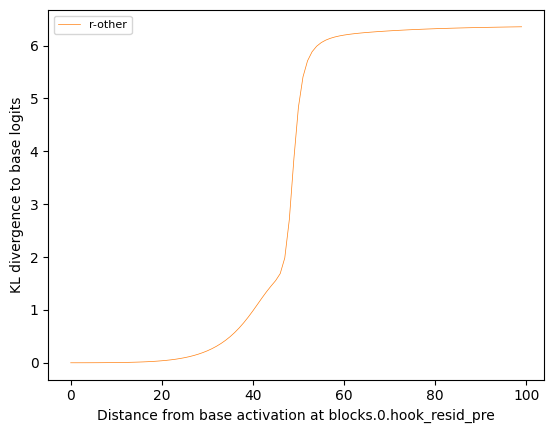

In [ ]:
# plotting here
heatmap = False
if heatmap:
    cur_key = dampen_feature_key  # activate_sae_feature_key  # predefined_other_key
    cur_id = 0

num_features = False
if num_features:
    cur_key = activate_sae_feature_key
    cur_id = 8

standard_kl_blowup = False
if R_OTHER or LAST_TOKEN:
    standard_kl_blowup = True

if ACTIVATE_SAE_FEATURE:
    plot_activate_sae_features(results)
if PREDEFINED_OTHER:
    plot_predefined_other(results)
# elif DAMPEN_FEATURE:
#    plot_dampen_feature(results)

if heatmap:
    # cur_key = activate_sae_feature_key
    # cur_id = 8

    base_list = base_ids[cur_key][cur_id][0].tolist()
    if ACTIVATE_SAE_FEATURE:
        cur_reaching_point = calculate_step_of_A_to_T(
            base_ref.act, recon_chosen_act[cur_id]
        )

        target_list = pert_ids[cur_key][cur_id][cur_reaching_point].tolist()
    elif PREDEFINED_OTHER:
        _, _, _, target_list_tensor, _ = explore_sae_space(r_other_act[cur_id], sae)
        target_list = target_list_tensor[0].tolist()
    elif DAMPEN_FEATURE:
        target_list = []  # dampen_targets[cur_id].tolist()
    # Combine lists and remove duplicates
    combined_list = list(set(base_list) | set(target_list))
    # If you need to maintain the order of elements as they appear in the original lists
    combined_list = list(dict.fromkeys(base_list + target_list))

    # heatmap_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)
    plot_activation_evolution(combined_list, pert_all_act[cur_key][cur_id], cur_id)

    # plot_activation_evolution(base_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # plot_activation_evolution(target_ids[cur_key][cur_id], pert_all_act[cur_key][cur_id])
    # print(selected_activations)

if num_features:

    # cur_key = predefined_other_key
    # cur_id = 1
    new_ids = [
        len([id for id in ids if id not in base_ids[cur_key][cur_id][0]])
        for ids in pert_ids[cur_key][0]
    ]
    old_ids = [
        len([id for id in base_ids[cur_key][cur_id][0] if id in ids])
        for ids in pert_ids[cur_key][cur_id]
    ]

    plot_num_active_features(new_ids, old_ids, threshold=sae_threshold)
    plot_max_values(
        perturbed_max_values[cur_key][cur_id],
        perturbations_only_max_values[cur_key][cur_id],
    )

if standard_kl_blowup:
    plot_kl_blowup(results)

In [ ]:
check_clean_SAE_features = False
if check_clean_SAE_features:
    r_s_i = np.argsort(recon_sim)[::-1]  # type: ignore
    upper_threshold_for_bullshit = 10
    normal_threshold_for_bullshit = 2
    clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    legit_clean_count = {i: 0 for i in range(1, upper_threshold_for_bullshit + 1)}
    clean_str = {}
    calc_clean = False
    calc_str_parity = True

    diff_in_clean = []
    # for i in tqdm(range(0, len(r_s_i))):

    #     sae_zero[r_s_i[i]] = A_encoded_norm
    #     decoded = sae.decode(sae_zero)
    #     _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    #     if ids[0].shape[0] <= upper_threshold_for_bullshit:
    #         clean_count += 1
    #     sae_zero[recon_sorted_indices[i]] = 0

    for start_idx in tqdm(range(0, sae_zero.shape[0], recon_batch_size)):
        end_idx = min(start_idx + recon_batch_size, sae_zero.shape[0])
        # Set the corresponding indices in sae_zero to A_encoded_norm

        batch_sae_zero = []
        for idx in range(start_idx, end_idx):
            temp_sae_zero = torch.zeros_like(sae_zero)
            temp_sae_zero[idx] = A_encoded_norm
            batch_sae_zero.append(temp_sae_zero)

        batch_sae_zero = torch.stack(batch_sae_zero)

        # Decode the batch
        f_recon_batch = sae.decode(batch_sae_zero).unsqueeze(1)
        _, strs, _, ids, _ = explore_sae_space(f_recon_batch, sae)

        if calc_clean:
            for i in range(len(ids)):
                for thresh in range(1, upper_threshold_for_bullshit + 1):
                    if len(ids[i]) <= thresh:
                        clean_count[thresh] += 1
                        if ids[i][np.argmax(strs[i])] == start_idx + i:
                            legit_clean_count[thresh] += 1
        if calc_str_parity:
            for i in range(len(ids)):
                if len(ids[i]) <= normal_threshold_for_bullshit:
                    if ids[i][np.argmax(strs[i])] == start_idx + i:
                        diff_in_clean.append(A_encoded_norm - strs[i].max())

    if calc_str_parity:
        print(f"average diff in cleans {np.mean(diff_in_clean)}")

    # print(f"clean count {clean_count}, start idx {start_idx}")
    if calc_clean:
        print(f"clean count {clean_count}")
        print(f"legit clean count {legit_clean_count}")

    # clean count       {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6960, 6: 7737, 7: 8454, 8: 9017, 9: 9449, 10: 9875}
    # legit clean count {1: 1452, 2: 3298, 3: 4778, 4: 6025, 5: 6956, 6: 7733, 7: 8450, 8: 9013, 9: 9445, 10: 9870}

In [ ]:
def check_id_count(feature_id):
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.zeros_like(A_encoded)
    sae_zero[feature_id] = torch.norm(A_encoded)
    decoded = sae.decode(sae_zero)
    _, _, _, ids, _ = explore_sae_space(decoded.unsqueeze(0).unsqueeze(0), sae)
    return len(ids[0])


# print(check_id_count(7354))

In [ ]:
def check_all_feature_development():
    A_encoded = sae.encode(base_ref.act)[0, -1, :]
    sae_zero = torch.full(A_encoded.shape, torch.norm(A_encoded).item())
    print(sae_zero)
    decoded = sae.decode(sae_zero)
    decoded_origin = decoded - sae.b_dec
    return decoded_origin


# tttt = check_all_feature_development()

In [ ]:
activation_space_explorations = False
if activation_space_explorations:
    n_ctx = 50
    perturbation_layer_number = 4
    perturbation_layer = f"blocks.{perturbation_layer_number}.hook_resid_pre"
    batch_of_prompts = generate_prompt(dataset, n_ctx=n_ctx, batch=mean_batch_size)
    batch_act_cache = model.run_with_cache(batch_of_prompts)[1].to("cpu")
    # data = batch_act_cache[perturbation_layer][:, perturbation_pos, :].squeeze(1)

    zz = batch_act_cache[perturbation_layer][:, slice(0, None, 1), :]
    print(f"layer {perturbation_layer}")
    norms = []
    for i in range(len(zz[0])):
        norms.append([])
    for i in range(len(zz)):
        for j in range(len(zz[i])):
            norms[j].append(torch.norm(zz[i][j]))
    for i in range(len(norms)):
        print(np.mean(norms[i]))

Connected to .venv (Python 3.10.14)

Connected to .venv (Python 3.10.14)

Connected to .venv (Python 3.10.14)

Connected to .venv (Python 3.10.14)

No kernel connected

Connected to .venv (Python 3.10.14)

Connected to .venv (Python 3.10.14)